# Deep learning technical model for ETFs

Based on the kibot data

In [2]:
# preamble
%alias_magic  nbagg matplotlib -p nbagg
%alias_magic  inline matplotlib -p inline
%load_ext memory_profiler

from io import BytesIO
from IPython.display import display, Image, HTML
from pylab import *
plt.style.use( 'seaborn-whitegrid' )
from madmax.api import *
mx = mx.reload()
mxtr = mxtr.reload()

from research import yahoo; reload( yahoo)

# create a configuration
mx.Config.name = 'etf_technical/online/2020.04.13'
mx.Config.start()
mx.Config.hps = mx.HPSet(
    # trade during market hours     
    market_hours=True,
    # trade after market hours
    pre_market=False,
    # trade pre market hours 
    post_market=False,
)
hps = mx.Config.hps

dh( mx.Config )


Created `%nbagg` as an alias for `%matplotlib nbagg`.
Created `%inline` as an alias for `%matplotlib inline`.
The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


In [ ]:
# --- build data nad features ---
######################################################################################################
from research.etf_technical import load_data as eld; reload( eld )
volume_features = ['log_dollar_volume_5min', 'log_dollar_volume_1hr', 'log_dollar_volume_1day' ]
calendar_features = ['cos_timeofday', 'sin_timeofday', 'cos_dayofweek', 'sin_dayofweek',
                     'cos_dayofmonth', 'sin_dayofmonth', 'cos_weekofyear', 'sin_weekofyear', ]
returns_features = ['logrtn_lag_intraday', 'logrtn_lag_overnight', 'logrtn_lag_intraweek', 
                    'logrtn_lag_weekend', 'logrtn_lag_intramonth', 'logrtn_lag_5min', 'logrtn_lag_1hr', 'logrtn_lag_1day']
volatility_features = ['logprice_vol_intraday', 'logprice_vol_intraweek']
responses = ['logrtn_lead_5min', 'logrtn_lead_1hr', 'logrtn_lead_1day']


if False:
    dfs = []
    das = []
    for symbol in ['SPY' , 'XLF', 'GDX', 'EEM', 'HYG', 'AGG', 'BND', 'VXX']:
        dh( 'loading data for ', symbol, h=3 )
        if symbol not in eld.kibot_day_files.keys():
            dh( f'kibot does not have data for {symbol} = SKIPPING', h=2, color='orange' )
            continue    
        df, da, features = eld.build_features( 
            symbol=symbol, verbose=False, 
            volatility_features=volatility_features, returns_features=returns_features,
            calendar_features=calendar_features, volume_features=volume_features, 
        )
        dfs.append( df )
        das.append( da )

    df = pd.concat( dfs, axis=0 ).sort_index( )
    da = xa.concat( das, dim='ticker' )

    reg = mx.Regression( response=None, weight=None, dk_lags=[10, 30], autocorr=None )
    with timer( 'profiling features ' ):
        res = []
        figure( figsize=(20, 30) )
        y = da.loc[:, :, 'logrtn_lead_1day'].to_series().exp() - 1
        for i, f in pbar( enumerate( features ) ):
            x = da.loc[:, :, f].to_series()
            rm = reg.apply_series( x, y )
            subplot( len( features ) + 1, 3, 3 * i + 1 )
            plot( rm['pnl'].cumsum(), '-r' )
            gca().set_title( f + ' pnl' )
            subplot( len( features ) + 1, 3, 3 * i + 2 )
            plot( x.time_index, x.rolling( 780 ).std(), '-r' )
            gca().set_title( f + ' 10D std' )
            subplot( len( features ) + 1, 3, 3 * i + 3 )
            plot( x.time_index, x.rolling( 780 ).mean(), '-r' )
            gca().set_title( f + '  10D mean' )
            rm['feature'] = f
            rm.pop( 'pnl' )
            rm.pop( 'hitRate' )
            res.append( rm )
    dh( pd.DataFrame( res ).set_index( 'feature' ) )


# Online linear on SPY only (5min) - small grid
* No quadratic transoform
* See OneNote `spy_technical_2020.03.07/experiment_2` for details

In [ ]:
# test a simple online linear model for SPY only - grid search (see onenote for results)
################################################################################################################
%inline

df, da, features = eld.build_features( 
    'SPY', dilation=12, levels=4, haar=False, zscore=False, winsorize=0.05, verbose=True
    volatility_features=volatility_features, returns_features=returns_features,
    calendar_features=calendar_features, volume_features=volume_features, 
)
# add a dummy weight columns
da = da.assign_features( one=da.loc[:, :, returns[0]].isfinite().astype( float ) )
# rolling window
xfmr = mx.transforms.rolling(
    windows=[1, 12, 30] + (np.array( [1, 2, 7, 10, 30,  ] )*78).tolist(),
    sid='ticker'
).mean()
da = xfmr( da, features=['rtn_lag_1', 'log_dollar_volume_5min', 'log_open_5min', 'log_open_5min_78.rw_sd'] ) #pfeat.output_features)

for hl_1 in [1000]: # [10, 100, 1000, 5000]:
    for lr in [1000]: #[10, 100, 1000, 5000]:        
        hps.features = xfmr.output_features + [
        #     'log_dollar_volume_5min', 'log_dollar_volume_day', 'log_dollar_volume_week',
        #     'log_volume_5min', 'log_volume_day', 'log_volume_week',
        #     'cos_timeofday', 'sin_timeofday', 'cos_dayofweek', 'sin_dayofweek',
        #     'cos_dayofmonth', 'sin_dayofmonth', 'cos_weekofyear', 'sin_weekofyear',
        #     'rtn_lag_intraday',  'rtn_lag_intraweek',
              'rtn_lag_overnight', 'rtn_lag_premarket',
        #     'rtn_lag_weekend', 'rtn_lag_intramonth',
        #    'rtn_lag_1', 'rtn_lag_365D',
             'intraday_price_vol',   'intraweek_price_vol',
        #     'log_open_5min_78.rw_sd', 'log_open_5min_780.rw_sd',   'log_open_5min_2340.rw_sd'
        ]
        hps.returns = ['rtn_lead_-12']  
        hps.weight = 'one'
        hps.lookhead = 12
        hps.hl_1 = hl_1
        hps.hl_2 = 5000
        hps.lr = lr
        hps.algo = 'mbprox'
        hps.loss = 'psr'
        hps.ridge = 1e-9
        decay_1 = mx.Resolve.halflife( hps.hl_1 )['decay']
        hl_1 = mx.Resolve.halflife( hps.hl_1 )['halflife']
        decay_2 = mx.Resolve.halflife( hps.hl_2 )['decay']
        hl_2 = mx.Resolve.halflife( hps.hl_2 )['halflife']

        reg = mx.Regression( response=hps.returns[0], weight=hps.weight, dk_lags=[10, 30], autocorr=[1, 12, 72, 100] )

        assert da.loc[:, :, hps.returns].notfinite().sum() < 20, 'too many null returns'
        da_use = da.loc[:, :, hps.features + hps.returns + [hps.weight]].fillna( 0 )[200000:300000]
        X = da_use.loc[:, :, hps.features]
        Y = da_use.loc[:, :, hps.returns]
        W = da_use.loc[:, :, hps.weight]
        print( X.shape, Y.shape, W.shape )

        def quadratic_transformer( X ):
            '''
            compute quadratic features transforms for online learning
            fs1: features to be haar transformed
            fs2: features not be be haared
            '''
            Xout = None
            return X

        mx.Config.device = 'cpu'
        mx.Config.dtype = tr.float64

        if True:
            Xt = tr.as_tensor( X.values, dtype=mx.Config.dtype, device=mx.Config.device )
            Yt = tr.as_tensor( Y.values, dtype=mx.Config.dtype, device=mx.Config.device )
            Wt = tr.as_tensor( W.values, dtype=mx.Config.dtype, device=mx.Config.device )
            with timer( 'running LinearRnn' ):
                linear_rnn = mxtr.LinearRNN(
                    lookahead=hps.lookhead, ridge=hps.ridge, loss=hps.loss, algo=hps.algo,
                    decay_1=decay_1, decay_2=decay_2, lr=hps.lr,
                    transformer=None, verbose=True
                )
                Yht, meta, state = linear_rnn( Xt, Yt, Wt )
                Yh = Yht.to_dataarray( Y )
                wins = mx.transforms.batch( sid='ticker' ).winsorize( quantiles=0.05 )
                Yh = wins( Yh, features=Yh.features.values )
                Yh = Yh.loc[:, :, wins.output_features[0]]

        with timer( 'running regressions' ):
            dh( hps )
            permabet = reg.apply_series(
                da_use.loc[:, :, 'one'].squeeze().to_series(),
                Y.squeeze().to_series()
            )
            perma_pnl = permabet.pop( 'pnl' )
            permabet.pop( 'hitRate' )
            permabet['strategy'] = 'static'
            rm = reg.apply_series( Yh.squeeze().to_series(), Y.squeeze().to_series() )
            ax = subplot( 121 )
            model_pnl = rm.pop( 'pnl' )
            rm['strategy'] = 'intraday'
            rm.pop( 'hitRate' )
            ax.plot( model_pnl.cumsum(), '-r' )
            ax.set_ylabel( 'strategy', color='red' )
            ax.twinx().plot( perma_pnl.cumsum(), '--b' )
            ax.twinx().set_ylabel( 'SPY', color='blue' )
            gca().set_title( 'corr with SPY={:0.2f}%'.format( 100 * model_pnl.corr( perma_pnl ) ) )
            gcf().show()
            dh( pd.DataFrame( [rm, permabet] ).set_index( 'strategy' ) )

        if False:
            # the online updater and linear_rnn results match quite nicely
            with timer( 'Running online-learner' ):
                lu = mx.LinearUpdater( ridge=linear_rnn.ridge, loss=linear_rnn.loss,
                                       algo=linear_rnn.algo, lr=linear_rnn.lr,
                                       hl_1=hl_1, hl_2=hl_2, )
                ol = mx.OnlineLearner(
                    updater=lu, lookahead=hps.lookhead, response=hps.returns,
                    weight=hps.weight, transformer=None
                ).set( verbose=True )
                dao = ol( da_use, features=hps.features )
                da_use = da_use.assign_features( yhat=dao )

            reg( da_use, features=ol.output_features )
            rm = reg.output_meta[0]
            plot( rm.pop( 'pnl' ).cumsum(), '--b' )
            rm.pop( 'hitRate' )
            dh( pd.Series( rm ) )



# Online linear @5min, multiple instruments, with quadratic transform 
* 8 Instruments
* Limited number of features
* 5-min data


In [ ]:
# Multi-instrument online linear model
################################################################################################################
%nbagg
from research.etf_technical import load_data as eld; reload( eld )

device = 'cuda'
dtype = tr.float64

reg = mx.Regression( response=responses[0], weight='one', dk_lags=[10, 30], autocorr=[1, 12, 72, 100] )

if True:    
    dfs = []
    das = []
    for symbol in pbar( ['SPY' , 'XLF', 'GDX', 'EEM', 'HYG', 'AGG', 'BND', 'VXX'] ):
        dh( 'loading data for ', symbol, h=4 )
        if symbol not in eld.kibot_day_files.keys():
            dh( f'kibot does not have data for {symbol} = SKIPPING', h=2, color='orange' )
            continue    
        df, da, features = eld.build_features( 
            symbol=symbol, zscore=False, haar=False, winsorize=0.05,  verbose=False,
            volatility_features=volatility_features, returns_features=returns_features,
            calendar_features=calendar_features, volume_features=volume_features, 
        )
        dfs.append( df )
        das.append( da )

    df = pd.concat( dfs, axis=0 ).sort_index( )
    da = xa.concat( das, dim='symbol' )
    # add a dummy weight columns
    da = da.assign_features( one=da.loc[:, :, responses[0]].isfinite().astype( float ) )
 
    with mx.timer( 'year on year permabet computation and regression'):
        permabet_regressions = []
        permabet_pnl = []
        ix = 0  
        # run a bunch of permabet regressions
        for split in mx.Freq.timesplits( da.time.to_series().min(), da.time.to_series().max(), mx.Freq.year ):
            sda = da.loc[split[0]:split[1]] 
            # compute the permabet with lookahead
            permabet_betas = (
                ( sda.loc[:,:,'one'] * sda.loc[:,:,'logrtn_lead_5min'] ).mean(axis=0) 
                / ( sda.loc[:,:,'one'] * sda.loc[:,:,'logrtn_lead_5min'].notnull() ).mean(axis=0)
            )
            sda = sda.assign_features( permabet=sda.loc[:,:,'one'] * permabet_betas )
            pr = reg.apply_series(
                sda.loc[:, :, 'permabet'].squeeze().to_series().fillna(0),
                sda.loc[:,:,'logrtn_lead_5min'].squeeze().to_series().fillna(0)
            )
            permabet_pnl.append( pr.pop('pnl') )        
            pr.pop( 'hitRate' )
            pr['start'] = pd.to_datetime(sda.time.min().values)
            pr['end'] = pd.to_datetime(sda.time.max().values)
            pr['strategy'] = 'permabet'
            permabet_regressions.append( pr )             
        permabet_regressions = pd.DataFrame( permabet_regressions ).set_index( ['start', 'end'] )
        permabet_pnl = pd.concat( permabet_pnl )

    dh( 'Permabet ', h=2 )
    dh( permabet_regressions )
    fig = figure()
    plot( permabet_pnl.cumsum() )
    fig.suptitle( 'permabet', fontsize=15 )

    with mx.timer(' rolling window features ---'):
        xfmr = mx.transforms.rolling(
            windows=[1, 12, 30] + (np.array( [1, 2, 7, 10, 30,  ] )*78).tolist(),
            sid='symbol'
        ).mean()
        da = xfmr( da, features=['logrtn_lag_5min', 'log_dollar_volume_1day', 'log_open_5min', ] ) #pfeat.output_features)
    
        
# quadratic transformer
def quadratic_transformer( Xt ):
    '''
    compute quadratic features transforms for online learning
    '''
    Xo =  tr.einsum( 'tna,tnb->tnab', Xt, Xt )
    assert Xo.shape == (Xt.shape[0], Xt.shape[1], Xt.shape[2], Xt.shape[2] )
    return Xo.reshape( Xt.shape[0], Xt.shape[1], -1 )


for hl_1 in [1000, 10000 ]: #100
    for lr in [ 5000, 10000, 1000]:    
        tr.cuda.empty_cache()
        hps.features = xfmr.output_features + [
            'log_dollar_volume_5min', 'log_dollar_volume_1hr', 'log_dollar_volume_1day',
            'cos_timeofday', 'sin_timeofday', 
            'cos_dayofweek', 'sin_dayofweek',
            'cos_dayofmonth', 'sin_dayofmonth',
            'cos_weekofyear', 'sin_weekofyear',
            'logrtn_lag_intraday', 'logrtn_lag_overnight', 'logrtn_lag_intraweek', 
            'logrtn_lag_weekend', 'logrtn_lag_intramonth',
            'logrtn_lag_5min', 'logrtn_lag_1hr', 'logrtn_lag_1day',
            'logprice_vol_intraday', 'logprice_vol_intraweek',
            'log_open_5min_78.rw_sd', 'log_open_5min_780.rw_sd',
            'logrtn_lag_5min_78.rw_sd', 'logrtn_lag_5min_780.rw_sd',
             'log_open_5min_2340.rw_sd', 'logrtn_lag_5min_2340.rw_sd'
        ]
        hps.returns = ['logrtn_lead_1hr']  
        hps.weight = 'one'
        hps.lookhead = 12
        hps.hl_1 = hl_1
        hps.hl_2 = 10000        
        hps.lr = lr
        hps.algo = 'mbprox'
        hps.loss = 'psr'
        hps.ridge = 1e-9
        hps.transformer = quadratic_transformer
        decay_1 = mx.Resolve.halflife( hps.hl_1 )['decay']
        hl_1 = mx.Resolve.halflife( hps.hl_1 )['halflife']
        decay_2 = mx.Resolve.halflife( hps.hl_2 )['decay']
        hl_2 = mx.Resolve.halflife( hps.hl_2 )['halflife']
        dh( hps )

        # assert (
        #     da_use.loc[:, :, hps.returns].notfinite().sum() 
        #     / da_use.loc[:, :, hps.returns].isfinite().sum() < 1e-3
        # ), 'too many null returns'
        da_use = da.loc[:, :, hps.features + hps.returns + [hps.weight]].fillna( 0 )[200000:250000]
        X = da_use.loc[:, :, hps.features]
        Y = da_use.loc[:, :, hps.returns]
        W = da_use.loc[:, :, hps.weight]
        print( X.shape, Y.shape, W.shape )                          

        def fit( X, Y, W ):
            '''
            one fit and regression cycle 
            '''            
            # the linear rnn learner
            linear_rnn = mxtr.LinearRNN(
                lookahead=hps.lookhead, ridge=hps.ridge, loss=hps.loss, algo=hps.algo,
                decay_1=decay_1, decay_2=decay_2, lr=hps.lr,
                transformer=hps.transformer, 
                verbose=True, 
            )        
            tr.cuda.empty_cache()
            Xt = tr.as_tensor( X.values, dtype=dtype, device=device )
            Yt = tr.as_tensor( Y.values, dtype=dtype, device=device )
            Wt = tr.as_tensor( W.values, dtype=dtype, device=device )
            Yht, meta, state = linear_rnn( Xt, Yt, Wt )
            Yh = Yht.to_dataarray( Y )
            wins = mx.transforms.batch( sid='symbol' ).winsorize( quantiles=0.05 )
            Yh = wins( Yh, features=Yh.features.values )
            return Yh.loc[:, :, wins.output_features[0]]
        
        def regress( Yh, Y, title ):
            # run a regression
            try:
                fig = figure()            
                with timer( 'running regressions' ):
                    rm = reg.apply_series( Yh.squeeze().to_series(), Y.squeeze().to_series() )
                    ax = subplot( 121 )
                    model_pnl = rm.pop( 'pnl' )
                    perma_pnl = permabet_pnl[model_pnl.index]
                    rm['strategy'] = 'intraday'
                    rm.pop( 'hitRate' )
                    ax.plot( model_pnl.cumsum(), '-r' )
                    ax.set_ylabel( 'strategy', color='red' )
                    ax.twinx().plot( perma_pnl.cumsum(), '--b' )
                    ax.twinx().set_ylabel( 'permabet', color='blue' )
                    gca().set_title( 'corr {:0.2f}%'.format( 100 * model_pnl.corr( perma_pnl ) ) )                    
                    gcf().suptitle( title, fontsize=20 )                    
                    dh( title, gcf(), pd.DataFrame( rm, index=['intraday']), h=5, color='purple' )
                return rm
            except ValueError:
                dh( title, 'regression failed ', h=3, color='red' )
                return None
        
        dh( f'Fitting global model', color='blue', h=4 )
        Yh = fit(  X, Y, W )
        regress( Yh, Y, title=f'Global :: lr={lr}, hl_1={hl_1}, hl_2={hl_2}' )            
        
        if False:
            dh( f'Fitting per-symbol models', color='blue', h=4 )
            Yhs = []
            for symbol in pbar( X.symbol.values ):
                dh( f'Fitting {symbol}', color='blue', h=5 )
                Yh = fit(  X.loc[:,[symbol], :], Y.loc[:,[symbol], :], W.loc[:,[symbol]] )            
                regress( Yh, Y.loc[:,[symbol], :], title=f'{symbol}:: lr={lr}, hl_1={hl_1}, hl_2={hl_2}' )
                # equal vol weighting when building the combined portfolio
                Yhs.append( Yh / Yh.std() * Y.loc[:,[symbol], :].std() )
            Yh = xa.concat( Yhs, dim='symbol' )    
            regress( Yh, Y, title=f'Combined:: lr={lr}, hl_1={hl_1}, hl_2={hl_2}' )            




# Online linear @5min with quadratic transform (big range)
* 8 Instruments
* Limited number of features
* 5-min data
* Bigger range of  `lr x hl1 x hl2 x ridge` hyperparameters than the previous cell

In [ ]:
# Multi-instrument online linear model - bigger hp range than the above cell
################################################################################################################
%nbagg
from research.etf_technical import load_data as eld; reload( eld )
device = 'cuda'
dtype = tr.float64

@mx.memoize
def build_dataset():
    dfs = []
    das = []
    for symbol in pbar( ['SPY' , 'XLF', 'GDX', 'EEM', 'HYG', 'AGG', 'BND', 'VXX'] ):
        dh( 'loading data for ', symbol, h=4 )
        if symbol not in eld.kibot_day_files.keys():
            dh( f'kibot does not have data for {symbol} = SKIPPING', h=2, color='orange' )
            continue    
        df, da, features = eld.build_features( 
            symbol=symbol, zscore=False, haar=False, winsorize=0.05,  verbose=False,
            volatility_features=volatility_features, returns_features=returns_features,
            calendar_features=calendar_features, volume_features=volume_features, 
        )
        dfs.append( df )
        das.append( da )

    df = pd.concat( dfs, axis=0 ).sort_index( )
    da = xa.concat( das, dim='symbol' )
    # add a dummy weight columns
    da = da.assign_features( one=da.loc[:, :, responses[0]].isfinite().astype( float ) )
    with mx.timer(' rolling window features ---'):
        xfmr = mx.transforms.rolling(
            windows=[1, 12, 30] + (np.array( [1, 2, 7, 10, 30,  ] )*78).tolist(),
            sid='symbol'
        ).mean()
        da = xfmr( da, features=['logrtn_lag_5min', 'log_dollar_volume_1day', 'log_open_5min', ] ) #pfeat.output_features)
    return df, da, xfmr.output_features

@mx.memoize
def permabet_computation():
    df, da, output_features = build_dataset()
    reg = mx.Regression( response=responses[0], weight='one', dk_lags=[10, 30], autocorr=[1, 12, 72, 100] )
    with mx.timer( 'year on year permabet computation and regression'):
        permabet_regressions = []
        permabet_pnl = []
        ix = 0  
        # run a bunch of permabet regressions
        for split in mx.Freq.timesplits( da.time.to_series().min(), da.time.to_series().max(), mx.Freq.year ):
            sda = da.loc[split[0]:split[1]] 
            # compute the permabet with lookahead
            permabet_betas = (
                ( sda.loc[:,:,'one'] * sda.loc[:,:,'logrtn_lead_5min'] ).mean(axis=0) 
                / ( sda.loc[:,:,'one'] * sda.loc[:,:,'logrtn_lead_5min'].notnull() ).mean(axis=0)
            )
            sda = sda.assign_features( permabet=sda.loc[:,:,'one'] * permabet_betas )
            pr = reg.apply_series(
                sda.loc[:, :, 'permabet'].squeeze().to_series().fillna(0),
                sda.loc[:,:,'logrtn_lead_5min'].squeeze().to_series().fillna(0)
            )
            permabet_pnl.append( pr.pop('pnl') )        
            pr.pop( 'hitRate' )
            pr['start'] = pd.to_datetime(sda.time.min().values)
            pr['end'] = pd.to_datetime(sda.time.max().values)
            pr['strategy'] = 'permabet'
            permabet_regressions.append( pr )             
        permabet_regressions = pd.DataFrame( permabet_regressions ).set_index( ['start', 'end'] )
        permabet_pnl = pd.concat( permabet_pnl )
    return permabet_pnl, permabet_regressions
       
permabet_pnl, permabet_regressions = permabet_computation()
dh( 'Permabet ', h=2 )
dh( permabet_regressions )
fig = figure()
plot( permabet_pnl.cumsum() )
fig.suptitle( 'permabet', fontsize=15 )

@mx.memoize
def run_one_configuration( ridge, hl_1, lr, hl_2 ):
    df, da, xfmr_features = build_dataset()
    tr.cuda.empty_cache()

    # quadratic transformer
    def quadratic_transformer( Xt ):
        '''
        compute quadratic features transforms for online learning
        '''
        Xo =  tr.einsum( 'tna,tnb->tnab', Xt, Xt )
        assert Xo.shape == (Xt.shape[0], Xt.shape[1], Xt.shape[2], Xt.shape[2] )
        return Xo.reshape( Xt.shape[0], Xt.shape[1], -1 )

    hps = mx.HPSet()    
    hps.features = xfmr_features + [
        'log_dollar_volume_5min', 'log_dollar_volume_1hr', 'log_dollar_volume_1day',
        'cos_timeofday', 'sin_timeofday', 
        'cos_dayofweek', 'sin_dayofweek',
        'cos_dayofmonth', 'sin_dayofmonth',
        'cos_weekofyear', 'sin_weekofyear',
        'logrtn_lag_intraday', 'logrtn_lag_overnight', 'logrtn_lag_intraweek', 
        'logrtn_lag_weekend', 'logrtn_lag_intramonth',
        'logrtn_lag_5min', 'logrtn_lag_1hr', 'logrtn_lag_1day',
        'logprice_vol_intraday', 'logprice_vol_intraweek',
        'log_open_5min_78.rw_sd', 'log_open_5min_780.rw_sd',
        'logrtn_lag_5min_78.rw_sd', 'logrtn_lag_5min_780.rw_sd',
         'log_open_5min_2340.rw_sd', 'logrtn_lag_5min_2340.rw_sd'
    ]
    hps.returns = ['logrtn_lead_1hr']  
    hps.weight = 'one'
    hps.lookhead = 12
    hps.hl_1 = hl_1
    hps.hl_2 = hl_2      
    hps.lr = lr
    hps.algo = 'mbprox'
    hps.loss = 'psr'
    hps.ridge = ridge
    hps.transformer = quadratic_transformer
    decay_1 = mx.Resolve.halflife( hps.hl_1 )['decay']
    hl_1 = mx.Resolve.halflife( hps.hl_1 )['halflife']
    decay_2 = mx.Resolve.halflife( hps.hl_2 )['decay']
    hl_2 = mx.Resolve.halflife( hps.hl_2 )['halflife']
    dh( hps )

    # assert (
    #     da_use.loc[:, :, hps.returns].notfinite().sum() 
    #     / da_use.loc[:, :, hps.returns].isfinite().sum() < 1e-3
    # ), 'too many null returns'
    da_use = da.loc[:, :, hps.features + hps.returns + [hps.weight]].fillna( 0 )[200000:250000]
    X = da_use.loc[:, :, hps.features]
    Y = da_use.loc[:, :, hps.returns]
    W = da_use.loc[:, :, hps.weight]    

    def fit( X, Y, W ):
        '''
        one fit and regression cycle 
        '''            
        # the linear rnn learner
        linear_rnn = mxtr.LinearRNN(
            lookahead=hps.lookhead, ridge=hps.ridge, loss=hps.loss, algo=hps.algo,
            decay_1=decay_1, decay_2=decay_2, lr=hps.lr,
            transformer=hps.transformer, 
            verbose=True, 
        )        
        tr.cuda.empty_cache()
        Xt = tr.as_tensor( X.values, dtype=dtype, device=device )
        Yt = tr.as_tensor( Y.values, dtype=dtype, device=device )
        Wt = tr.as_tensor( W.values, dtype=dtype, device=device )
        Yht, meta, state = linear_rnn( Xt, Yt, Wt )
        Yh = Yht.to_dataarray( Y )
        wins = mx.transforms.batch( sid='symbol' ).winsorize( quantiles=0.05 )
        Yh = wins( Yh, features=Yh.features.values )
        return Yh.loc[:, :, wins.output_features[0]]

    dh( f'Fitting global model', color='blue', h=4 )
    Yh = fit(  X, Y, W )
    return Yh, Y

if False:
    dh( f'Fitting per-symbol models', color='blue', h=4 )
    Yhs = []
    for symbol in pbar( X.symbol.values ):
        dh( f'Fitting {symbol}', color='blue', h=5 )
        Yh = fit(  X.loc[:,[symbol], :], Y.loc[:,[symbol], :], W.loc[:,[symbol]] )            
        regress( Yh, Y.loc[:,[symbol], :], title=f'{symbol}:: lr={lr}, hl_1={hl_1}, hl_2={hl_2}' )
        # equal vol weighting when building the combined portfolio
        Yhs.append( Yh / Yh.std() * Y.loc[:,[symbol], :].std() )
    Yh = xa.concat( Yhs, dim='symbol' )    
    regress( Yh, Y, title=f'Combined:: lr={lr}, hl_1={hl_1}, hl_2={hl_2}' )            

def regress( Yh, Y, title ):
    # run a regression
    reg = mx.Regression( response=responses[0], weight='one', dk_lags=[10, 30], autocorr=[1, 12, 72, 100] )
    try:
        fig = figure()            
        with timer( 'running regressions' ):
            rm = reg.apply_series( Yh.squeeze().to_series(), Y.squeeze().to_series() )
            ax = subplot( 121 )
            model_pnl = rm.pop( 'pnl' )
            perma_pnl = permabet_pnl[model_pnl.index]
            rm['strategy'] = 'intraday'
            rm.pop( 'hitRate' )
            ax.plot( model_pnl.cumsum(), '-r' )
            ax.set_ylabel( 'strategy', color='red' )
            ax.twinx().plot( perma_pnl.cumsum(), '--b' )
            ax.twinx().set_ylabel( 'permabet', color='blue' )
            gca().set_title( 'corr {:0.2f}%'.format( 100 * model_pnl.corr( perma_pnl ) ) )                    
            gcf().suptitle( title, fontsize=20 )                    
            dh( title, gcf(), pd.DataFrame( rm, index=['intraday']), h=5, color='purple' )
        return rm
    except ValueError:
        dh( title, 'regression failed ', h=3, color='red' )
        return None
        
hl_2 = 10000

for hl_1 in [100, 1000, 5000 ]: 
    for lr in [1000, 5000, 10000]:    
        for ridge in [1e-1, 1e-3, 1e-6, 1e-9]:
            Yh, Y = run_one_configuration( ridge=ridge, hl_1=hl_1, hl_2=hl_2, lr=lr )
            regress( Yh, Y, title=f'lr={lr}, hl_1={hl_1}, hl_2={hl_2} ridge={ridge}' )            


# Online linear model with 30min data
------
* 200 instruments
* Both global and single instrument models
* large numbers of features





/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


<IPython.core.display.Javascript object>


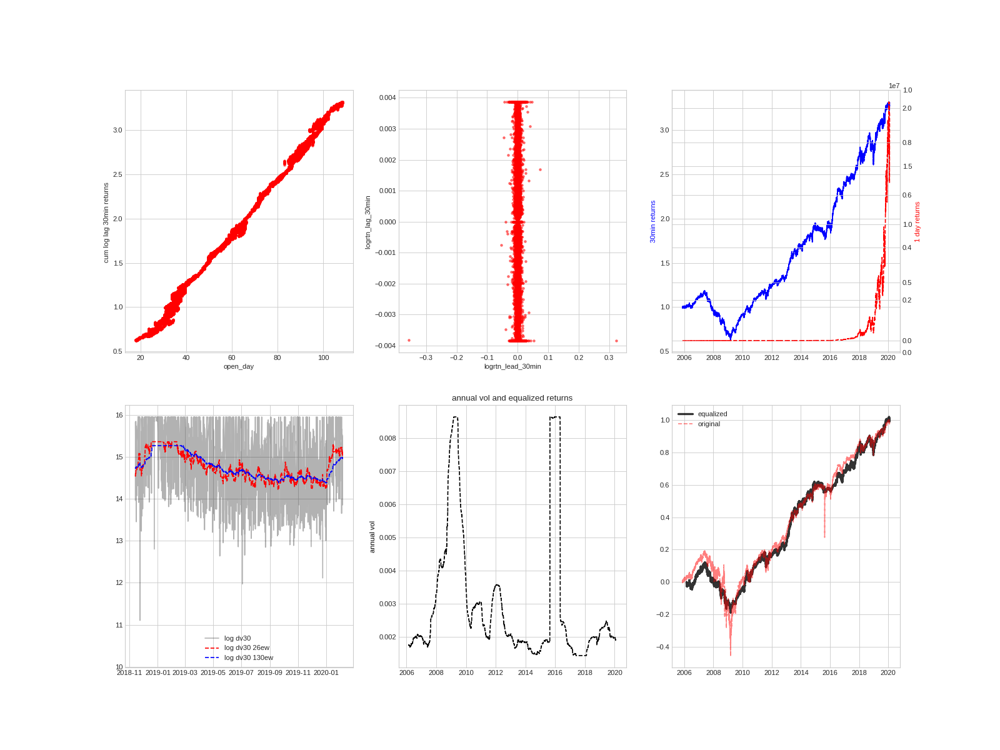

/home/fj/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


In [9]:
# Build up the 30min dataset and construct a bunch of features
####################################################################
%nbagg

from research.etf_technical import load_data as eld; reload( eld )

price_features = ['open_30min', 'high_30min', 'low_30min', 'close_30min', 
                      'open_day', 'high_day', 'low_day', 'close_day', 'close_prev_day', 
                      'open_week', 'high_week', 'low_week', 'close_week', 'close_prev_week', 
                      'open_month', 'high_month', 'low_month', 'close_month', ]
                      
volume_features = ['volume_30min', 'volume_intraday', 'volume_intraweek', 'volume_1hr', 'volume_1day', 
                       'dollar_volume_30min', 'dollar_volume_intraday',
                       'dollar_volume_intraweek', 'dollar_volume_1hr', 'dollar_volume_1day',]
                       
calendar_features = [ 'week', 'month', 'timeofday', 'dayofweek', 'dayofmonth', 
                          'weekofyear', 'cos_timeofday', 'sin_timeofday', 
                          'cos_dayofweek', 'sin_dayofweek', 'cos_dayofmonth',
                          'sin_dayofmonth', 'cos_weekofyear', 'sin_weekofyear',]

returns_features = ['logrtn_lag_intraday', 'logrtn_lag_overnight', 'logrtn_lag_intraweek',
                    'logrtn_lag_weekend', 'logrtn_lag_intramonth', 'logrtn_lag_30min',
                    'logrtn_lag_1hr','logrtn_lag_1day', ]

responses = ['logrtn_lead_30min',  'logrtn_lead_1hr', 'logrtn_lead_1day'] #'logrtn_lead_intraday', 



@mx.operatorize( memoize='md', consumes_features=False, produces_meta=True )
def FeatureBuilder( data, responses=responses,  emv=True, ema=True, equalize_lagging_returns=False,
                    haar=False, dilation=2, levels=5, winsorize=0.05, smz=False,   
                   volume_features=volume_features, returns_features=returns_features, 
                   verbose=False ):
    '''
    build up the 30 min dataset for learning
    
    equalize_lagging_returns:
        divide out annual vol from all lagging returns features
        Leading returns features are equalized anyways
    '''
    INTS_PER_DAY = 13    
    logger = mx.Logger( 'build_features', verbose=verbose )        
    das = []
    with logger.timer( 'loading the data'):
        for symbol in logger.pbar( eld.kibot_day_files.keys() ):
            if symbol.startswith( 'INCOMPLETE' ):
                logger.warn( f'No data for {symbol} - SKIPPING' )
                continue
            logger.info( 'loading data for ', symbol )
            da, meta = eld.build_30min_data( symbol=symbol )
            das.append( da )    
        da = xa.concat( das, dim='symbol' )
    features = volume_features + returns_features
    with logger.timer( ' compute log features' ):
        for ft in ['dollar_volume_30min', 'open_30min', 'dollar_volume_intraday',  'dollar_volume_intraweek',] :
            da = da.assign_features( **{ f'log_{ft}': da.loc[:,:, ft].log() } )        
            features.append( f'log_{ft}' )
    with logger.timer(' compute an annual returns volatility'):
        avc = mx.transforms.rolling( windows='252D', sid='symbol', min_periods=INTS_PER_DAY*60 ).sd()
        da = avc( da, features='logrtn_lag_30min' )
        annual_vol = avc.output_features[0]
        # equalize the response variable
        equalized_responses = []
        for response in responses:
            equalized_response = f'{response}_equalized'
            da = da.assign_features( **{equalized_response: da.loc[:,:,response] / ( da.loc[:,:,annual_vol] + 1e-12 ) } )
            equalized_responses.append( equalized_response )        
    if equalize_lagging_returns:
        # equalize all the laggign returns columns inplace ....
        with logger.timer( 'compute "normalized" leading and lagging returns' ):            
            da.loc[:,:,returns_features] =  da.loc[:,:,returns_features] / ( da.loc[:,:,annual_vol] + 1e-12 )            
    # volume, price and returns vol
    if emv:
        with logger.timer( 'compute volatility' ):
            emv = mx.transforms.exponential( halflifes=np.array( [2, 10, 30] ) * INTS_PER_DAY, sid='symbol' ).sd()
            da = emv( da, features=['log_open_30min', 'log_dollar_volume_30min', 'logrtn_lag_30min', 'logrtn_lag_1day'] )
            features += emv.output_features
    # volume, price and returns sma
    if ema:
        with logger.timer( 'compute ema' ):
            ema = mx.transforms.exponential( halflifes=np.array( [2, 10, 30] ) * INTS_PER_DAY, sid='symbol' ).mean()            
            da = ema( da, features=['log_open_30min', 'log_dollar_volume_30min', 'logrtn_lag_30min', 'logrtn_lag_1day'] )
            features += ema.output_features        
    # compute haar transform
    if haar:
        with logger.timer( 'compute haar' ):
            haar = mx.transforms.haar( levels=levels, dilation=dilation, sid='symbol' )
            haar.features = ['log_open_30min', 'log_dollar_volume_30min', 'logrtn_lag_30min', 'logrtn_lag_1day'] 
            da = haar( da )
            features += haar.output_features
    # winsorize the features we've constructed and other good stuff
    if winsorize:
        with logger.timer( 'winsorizing' ):
            wins = mx.transforms.batch( sid='symbol' ).winsorize( quantiles=winsorize )
            wins.features = sorted( set(features + [annual_vol] + equalized_responses  ) )
            da = wins( da )
            # drop the original features and rename the winsorized one
            da = (da.drop_coords( features=wins.features )
                  .rename_coords( features=dict( zip( wins.output_features, wins.features ) ) ))
    # zscore the features
    if smz:
        with logger.timer( 'zscoring' ):
            zscore = mx.transforms.rolling( windows=smz, sid='symbol' ).zscore()
            da = zscore( da, features=features )
            # drop the original features and rename the zscored one
            # da = da.drop_coords( features=zscore.features ).rename_coords( features=dict( zip( zscore.output_features, zscore.features ) ) )
    # add a dummy weight column
    da = da.assign_features( one=1 )
    return da, features, dict( equalized_responses=equalized_responses, annual_vol=annual_vol )        

builder = FeatureBuilder()
da = builder( data=None )  

fig  = figure( figsize=(20, 15 ) )
sdf = da.loc[:,'SDY',:].to_dataframe_mx()
plt.style.use( 'seaborn-whitegrid')

ax = subplot( 2, 3, 1 )
ax.plot( sdf['open_day'], sdf['logrtn_lag_30min'].cumsum().exp(), '.r', alpha=0.5 )
ax.set_xlabel('open_day')
ax.set_ylabel('cum log lag 30min returns ')
ax = subplot( 2, 3, 2 )
ax.plot( sdf['logrtn_lead_30min'], sdf['logrtn_lag_30min'], '.r', alpha=0.5 )
ax.set_xlabel('logrtn_lead_30min')
ax.set_ylabel('logrtn_lag_30min ')
ax = subplot( 2, 3, 3 )
ax.plot( sdf['logrtn_lag_30min'].cumsum().exp(), '-b', label='30min lag')
ax.set_ylabel( '30min returns', color='blue')
ax.twinx().plot( sdf['logrtn_lag_1day'].cumsum().exp(), '--r', label='1 day lag')
ax.twinx().set_ylabel( '1 day returns', color='red')

ax = subplot( 2, 3, 4 )
ax.plot( sdf.tail(4000)['log_dollar_volume_30min'], '-k', alpha=0.3, label='log dv30')
ax.plot( sdf.tail(4000)['log_dollar_volume_30min_26.ew_mean'], '--r', label='log dv30 26ew')
ax.plot( sdf.tail(4000)['log_dollar_volume_30min_130.ew_mean'], '--b', label='log dv30 130ew')
ax.legend()

ax = subplot( 2, 3, 5 )
# ax.plot( da.loc[:,:,'logrtn_lead_30min_equalized'].to_series(), da.loc[:,:,'logrtn_lead_30min'].to_series(), '.r', alpha=0.5 )
ax.plot( sdf['logrtn_lag_30min_252D.rw_sd'], '--k' )
ax.set_ylabel('annual vol', color='black' )
# ax.twinx().plot( sdf['logrtn_lead_30min_equalized'], '-r', alpha=0.5 )
# ax.twinx().set_ylabel('equalized returns', color='red' )
ax.set_title('annual vol and equalized returns')
ax = subplot( 2, 3, 6 )
ax.plot( sdf['logrtn_lead_30min_equalized'].cumsum()/sdf['logrtn_lead_30min_equalized'].sum(), '-k', alpha=0.8, linewidth=3 , label='equalized' )
ax.plot( sdf['logrtn_lead_30min'].cumsum()/sdf['logrtn_lead_30min'].sum(), '--r', alpha=0.5, label='original' )
ax.legend()
# ax.plot( sdf['logrtn_lead_30min_equalized'] , sdf['logrtn_lead_30min'], '.', alpha=0.5 )
# ax.set_ylabel('original')
# ax.set_xlabel('equalized')

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_13,ac_65,strategy
start,end,,,,,,,,,,,,,
1998-01-02 09:30:00,1998-12-31 15:30:00,643402,1.0,-0.033531,1.747414,0.007466,0.000056,5.988938,1.811341,1.952456,1.0,1.0,1.0,permabet
1999-01-04 09:30:00,1999-12-31 13:00:00,643402,1.0,0.112593,2.965444,0.015175,0.000230,12.173740,2.904177,2.974648,1.0,1.0,1.0,permabet
2000-01-03 09:30:00,2000-12-29 15:30:00,643599,1.0,-0.156490,2.473903,0.008095,0.000066,6.494055,2.571786,2.536270,1.0,1.0,1.0,permabet
2001-01-02 09:30:00,2001-12-31 15:30:00,631976,1.0,-0.049160,2.206872,0.010279,0.000106,8.171670,2.274199,2.265500,1.0,1.0,1.0,permabet
2002-01-02 09:30:00,2002-12-31 15:30:00,642811,1.0,-0.216952,2.009832,0.022186,0.000492,17.792337,2.077433,2.044199,1.0,1.0,1.0,permabet
2003-01-02 09:30:00,2003-12-31 15:30:00,642220,1.0,0.449858,3.274624,0.025836,0.000668,20.711840,3.257368,3.131457,1.0,1.0,1.0,permabet
2004-01-02 09:30:00,2004-12-31 15:30:00,644584,1.0,0.446495,2.976062,0.020680,0.000428,16.606889,2.997402,2.768190,1.0,1.0,1.0,permabet
2005-01-03 09:30:00,2005-12-30 15:30:00,644387,1.0,0.401870,2.742825,0.018318,0.000336,14.707322,2.812820,2.569062,1.0,1.0,1.0,permabet
2006-01-03 09:30:00,2006-12-29 15:30:00,640841,1.0,0.595141,2.435356,0.022610,0.000511,18.104871,2.429594,2.416481,1.0,1.0,1.0,permabet


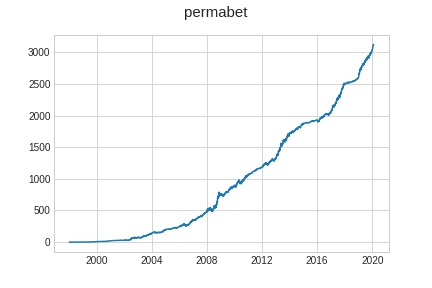

In [11]:
# Permabet computation
#####################################################################
%inline
@mx.memoize
def permabet_computation( response='logrtn_lead_30min_equalized', weight='one', verbose=True ):
    ''' 
    compute the returns of aa permabet strategy with lookhead that rebalances yearly
    '''
    logger = mx.Logger('permabet_computation', verbose=verbose)
    builder = FeatureBuilder()
    da = builder( data=None )    
    reg = mx.Regression( response=response, weight=weight, dk_lags=[10, 30], autocorr=[1, 13, 13*5] )
    with logger.timer( 'year on year permabet computation and regression'):
        permabet_regressions = []
        permabet_pnl = []
        ix = 0  
        # run a bunch of permabet regressions
        permabet_betas = []
        for split in mx.Freq.timesplits( da.time.to_series().min(), da.time.to_series().max(), mx.Freq.year ):
            sda = da.loc[split[0]:split[1]] 
            # compute the permabet with lookahead
            permabet_beta = (
                ( sda.loc[:,:,'one'] * sda.loc[:,:,response] ).mean(axis=0) 
                / ( sda.loc[:,:,'one'] * sda.loc[:,:,'one'].notnull() ).mean(axis=0)
            )
            sda = sda.assign_features( permabet=sda.loc[:,:,'one'] * permabet_beta )
            pr = reg.apply_series(
                sda.loc[:, :, 'permabet'].squeeze().to_series().fillna(0),
                sda.loc[:,:,response].squeeze().to_series().fillna(0)
            )
            permabet_betas.append( permabet_beta )
            permabet_pnl.append( pr.pop('pnl') )        
            pr.pop( 'hitRate' )
            pr['start'] = pd.to_datetime(sda.time.min().values)
            pr['end'] = pd.to_datetime(sda.time.max().values)
            pr['strategy'] = 'permabet'
            permabet_regressions.append( pr )             
        permabet_regressions = pd.DataFrame( permabet_regressions ).set_index( ['start', 'end'] )
        permabet_pnl = pd.concat( permabet_pnl )        
    return permabet_pnl, permabet_regressions, permabet_betas

permabet_pnl, permabet_regressions, permabet_betas = permabet_computation()
dh( 'Permabet ', h=2 )
dh( permabet_regressions )
fig = figure()
plot( permabet_pnl.cumsum() )
fig.suptitle( 'permabet', fontsize=15 )
disp( fig )
       

### Insample results

,mean,std
features,,
cos_dayofmonth,-2.592226e-02,0.000955
cos_dayofweek,1.825136e-01,0.000894
cos_timeofday,7.130840e-02,0.007088
cos_weekofyear,-1.853680e-02,0.007110
log_dollar_volume_30min_130.ew_mean,1.464890e+01,1.466815
log_dollar_volume_30min_130.ew_sd,9.209896e-01,0.161770
log_dollar_volume_30min_26.ew_mean,1.465688e+01,1.466740
log_dollar_volume_30min_26.ew_sd,8.703970e-01,0.163942
log_dollar_volume_30min_390.ew_mean,1.462852e+01,1.467063


,mean,std
features,,
cos_dayofmonth,0.699875,0.000356
cos_dayofweek,0.748315,0.000282
cos_timeofday,0.729424,0.000738
cos_weekofyear,0.699163,0.001482
log_dollar_volume_30min_130.ew_mean,1.147864,0.558458
log_dollar_volume_30min_130.ew_sd,0.174573,0.073371
log_dollar_volume_30min_26.ew_mean,1.164007,0.546274
log_dollar_volume_30min_26.ew_sd,0.192676,0.070826
log_dollar_volume_30min_390.ew_mean,1.148058,0.571082


/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
NaN,3940000,0.9994,-0.007117,1.003885,0.003383,-0.000011,4.458003,8.911018,9.404013,0.999289,0.997068,0.9838,0.97618,1154698200000000000,1347537600000000000


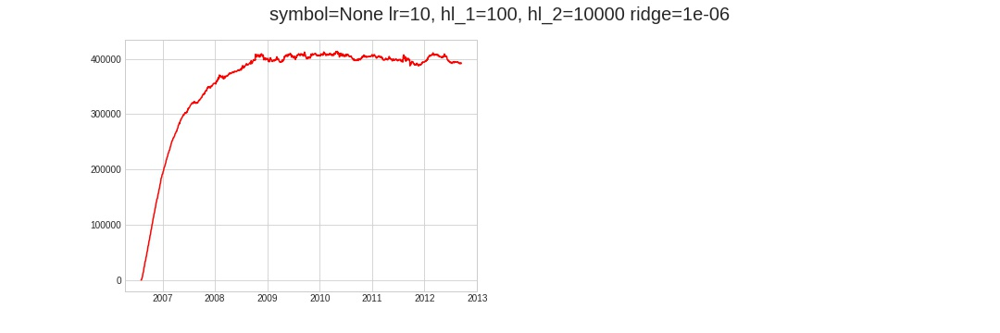

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
NaN,3940000,0.9994,-0.010028,1.111754,0.003124,-0.00001,5.149123,9.532146,9.842077,0.999137,0.996887,0.989308,0.985417,1154698200000000000,1347537600000000000


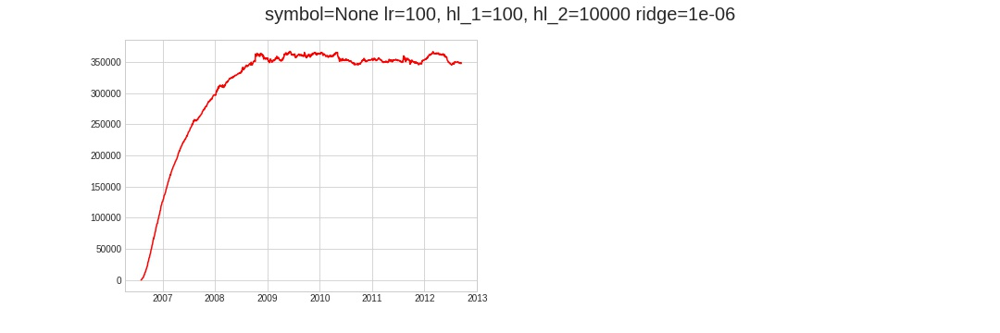

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
NaN,3940000,0.9994,-0.017138,1.016,0.002685,-0.000007,6.046334,8.413564,8.599282,0.998511,0.994972,0.987245,0.984052,1154698200000000000,1347537600000000000


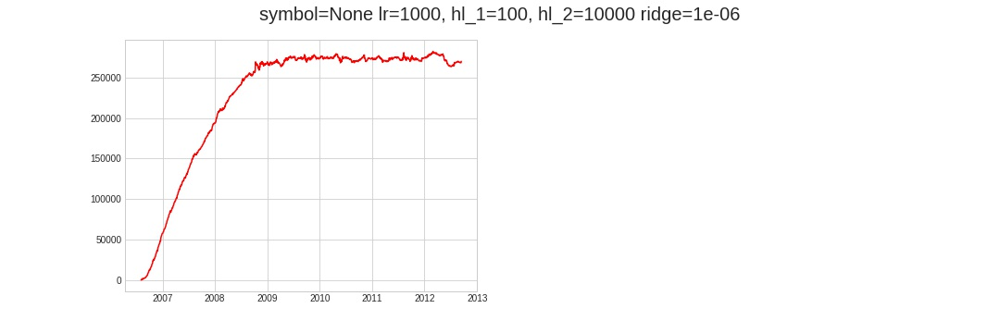

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
NaN,3940000,0.9994,-0.007229,2.324733,0.002938,-0.000009,5.563248,19.520959,19.055115,0.999694,0.998482,0.988765,0.982816,1154698200000000000,1347537600000000000


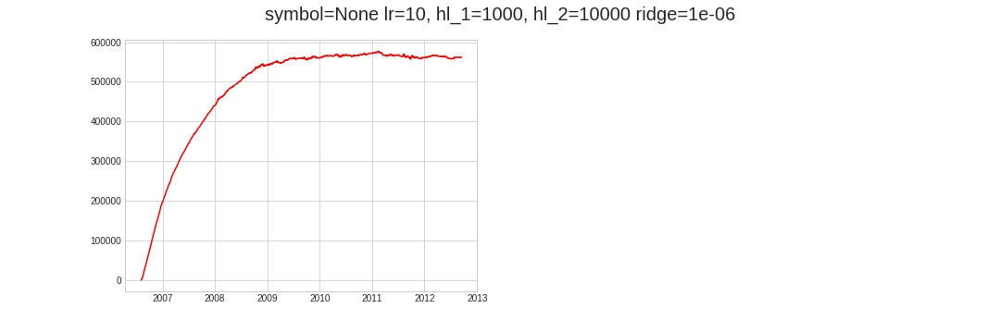

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
NaN,3940000,0.9994,-0.00972,2.105003,0.002758,-0.000008,5.916061,17.964968,18.139523,0.999593,0.998281,0.993028,0.990052,1154698200000000000,1347537600000000000


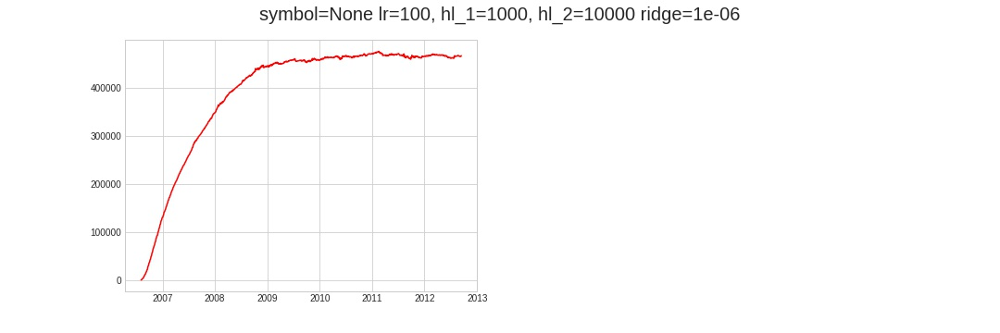

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
NaN,3940000,0.9994,-0.015538,1.727873,0.002398,-0.000006,6.503539,15.181381,15.331663,0.99927,0.997195,0.991746,0.989404,1154698200000000000,1347537600000000000


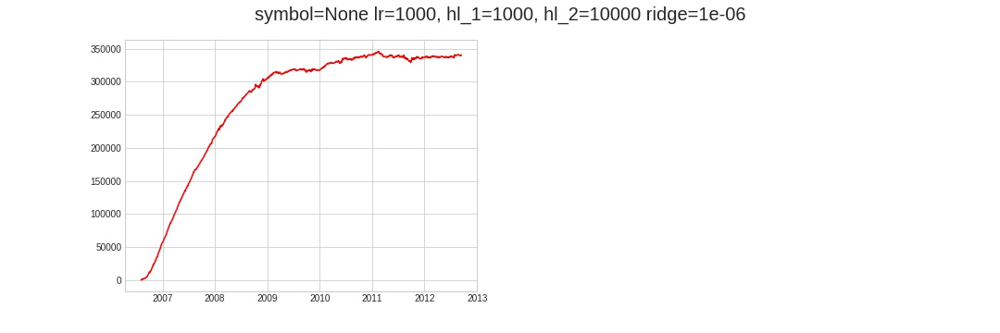

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
NaN,3940000,0.9994,-0.00745,3.674111,0.00271,-0.000007,6.002336,30.246268,26.1375,0.999823,0.998802,0.989414,0.983695,1154698200000000000,1347537600000000000


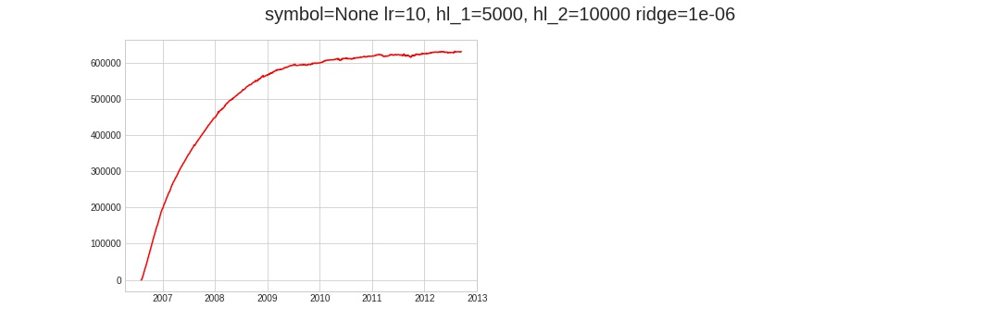

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
NaN,3940000,0.9994,-0.009898,3.130509,0.002519,-0.000006,6.3212,27.183928,25.350206,0.999752,0.998663,0.993471,0.990582,1154698200000000000,1347537600000000000


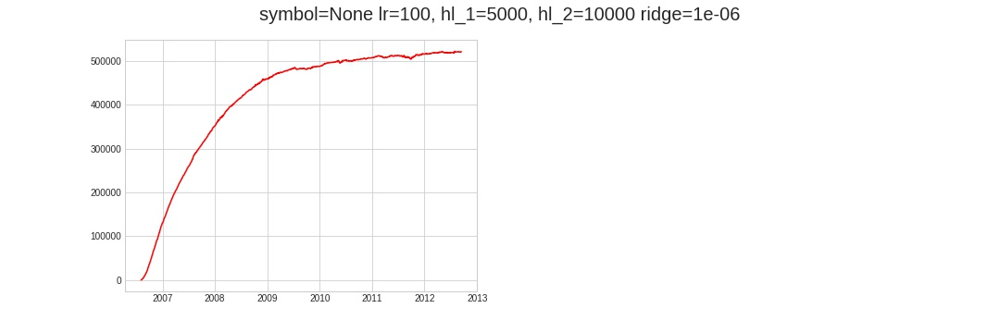

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
NaN,3940000,0.9994,-0.015302,2.434108,0.002098,-0.000004,6.900275,21.344876,20.884155,0.999516,0.997896,0.992371,0.990016,1154698200000000000,1347537600000000000


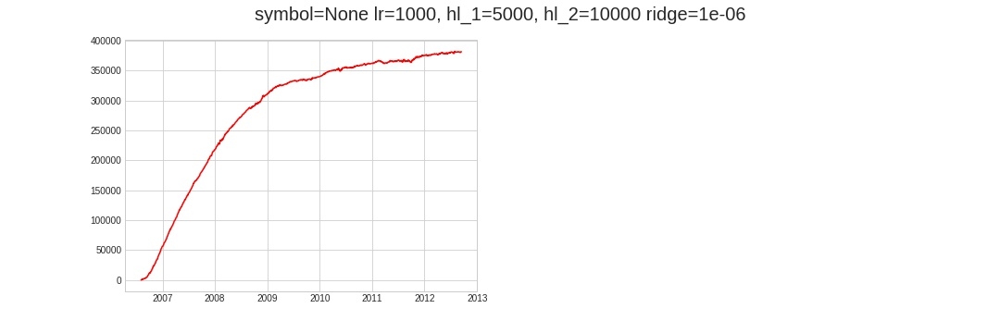

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,20000,0.9994,0.035254,-0.180306,-0.011146,0.000124,-1.576897,-1.705275,-1.730691,0.903932,0.534386,0.071717,0.079473,1154698200000000000,1347537600000000000


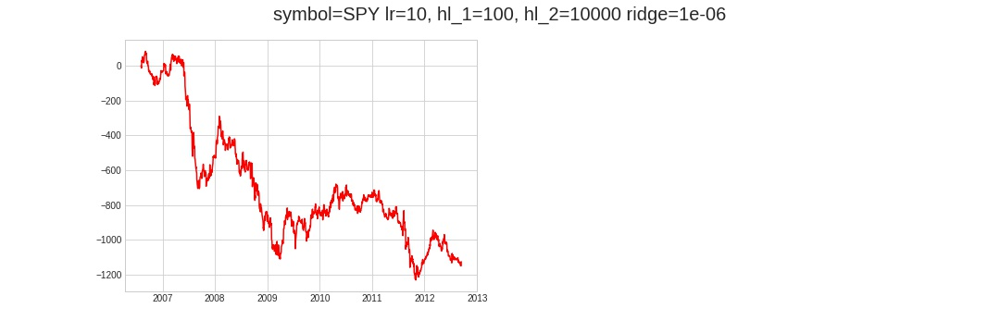

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,20000,0.9994,0.044984,-0.206453,-0.01302,0.00017,-1.841713,-1.910798,-1.946096,0.887928,0.58385,0.101155,0.098104,1154698200000000000,1347537600000000000


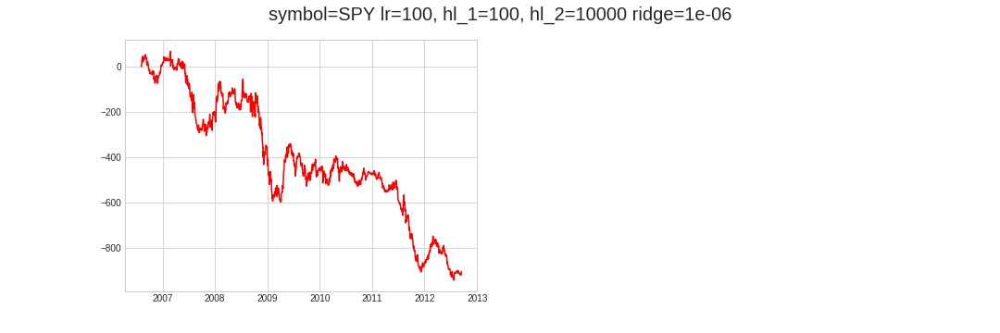

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,20000,0.9994,0.062552,-0.187001,-0.012298,0.000151,-1.739704,-1.664464,-1.699441,0.878717,0.629518,0.181886,0.163621,1154698200000000000,1347537600000000000


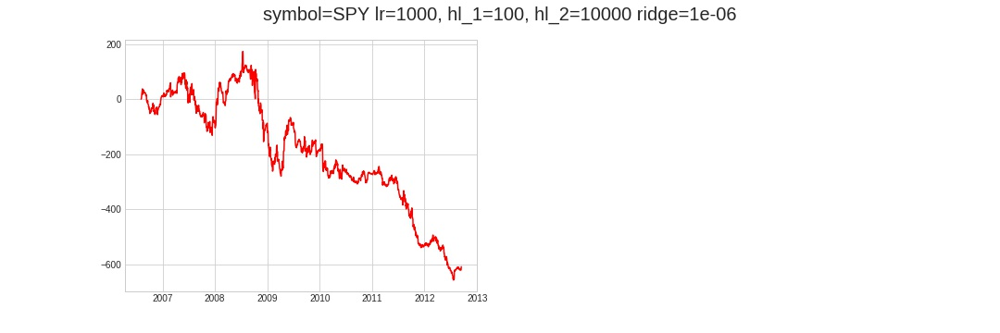

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,20000,0.9994,0.017093,-0.169172,-0.01149,0.000132,-1.625476,-1.577019,-1.534643,0.915852,0.538457,0.033688,0.048353,1154698200000000000,1347537600000000000


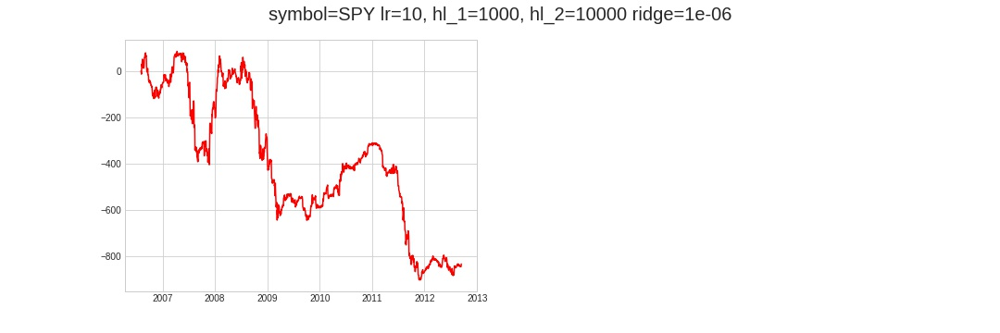

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,20000,0.9994,0.028287,-0.232857,-0.015886,0.000252,-2.246862,-2.106421,-2.124269,0.889594,0.594122,0.072145,0.051001,1154698200000000000,1347537600000000000


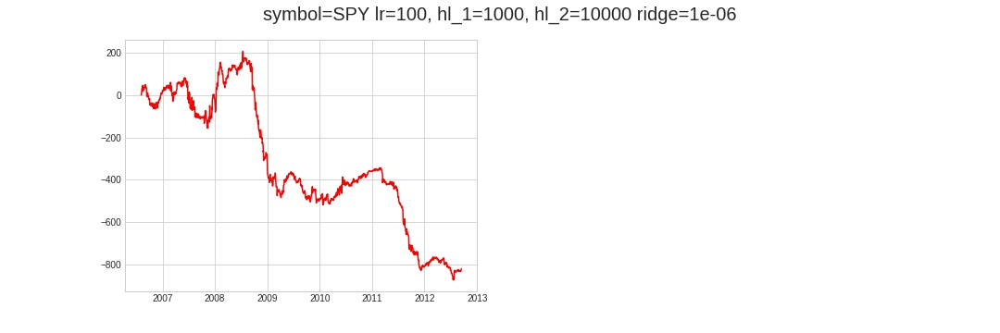

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,20000,0.9994,0.061805,-0.176941,-0.012438,0.000155,-1.759486,-1.611569,-1.603382,0.862807,0.570687,0.126969,0.082966,1154698200000000000,1347537600000000000


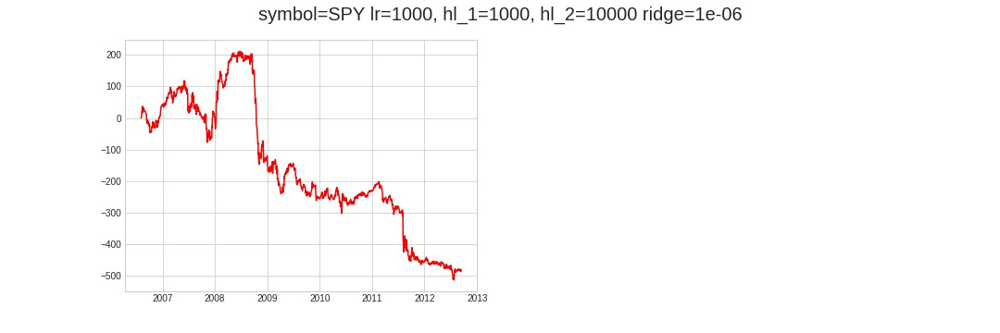

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,20000,0.9994,0.0053,-0.285415,-0.019449,0.000378,-2.750769,-2.635512,-2.551832,0.93856,0.601205,0.060186,0.06989,1154698200000000000,1347537600000000000


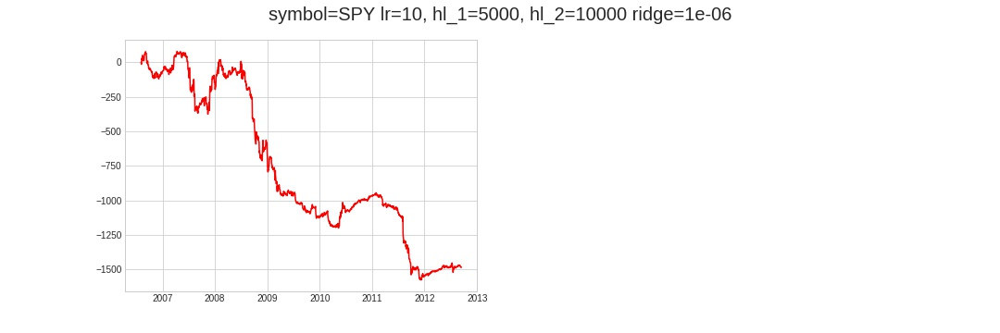

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,20000,0.9994,0.010677,-0.2839,-0.019799,0.000392,-2.800263,-2.60673,-2.572153,0.917617,0.651635,0.115803,0.073627,1154698200000000000,1347537600000000000


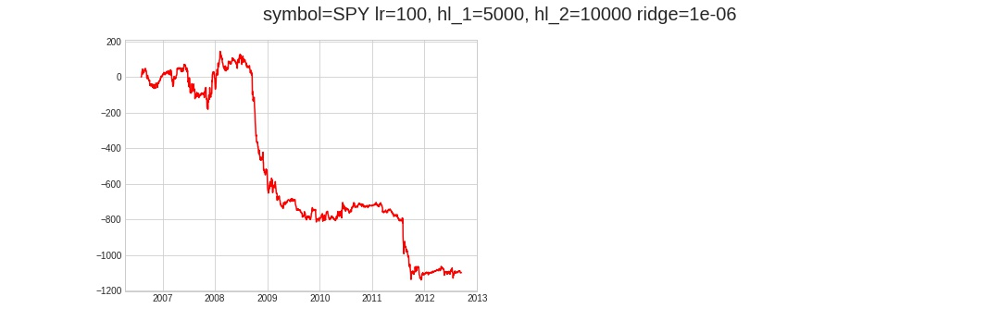

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,20000,0.9994,0.018066,-0.1331,-0.009305,0.000087,-1.3168,-1.230232,-1.211812,0.883648,0.607488,0.128976,0.064842,1154698200000000000,1347537600000000000


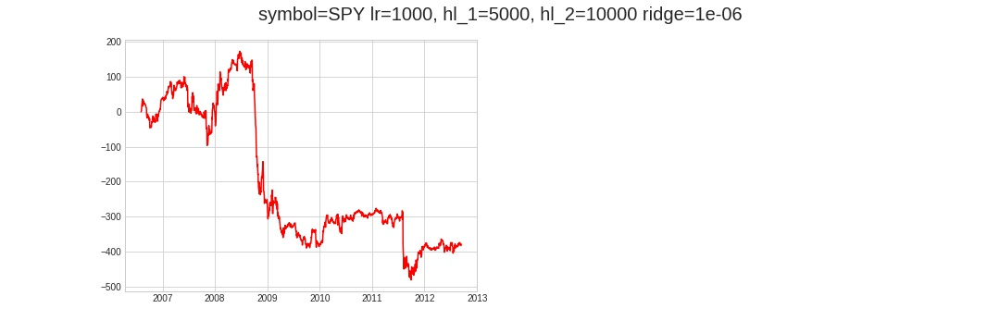

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
XLF,20000,0.9994,0.032224,-0.242997,-0.014738,0.000217,-2.083306,-2.173667,-2.145484,0.897895,0.551532,0.090437,0.067637,1154698200000000000,1347537600000000000


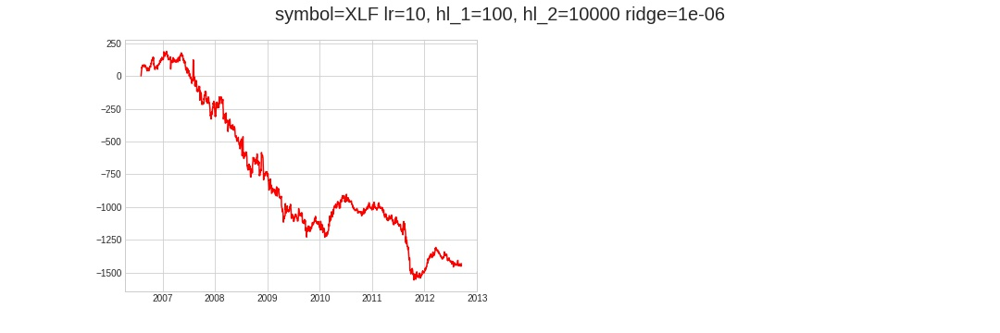

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
XLF,20000,0.9994,0.042566,-0.203891,-0.012949,0.000168,-1.830246,-1.862813,-1.844469,0.88595,0.590125,0.124746,0.120763,1154698200000000000,1347537600000000000


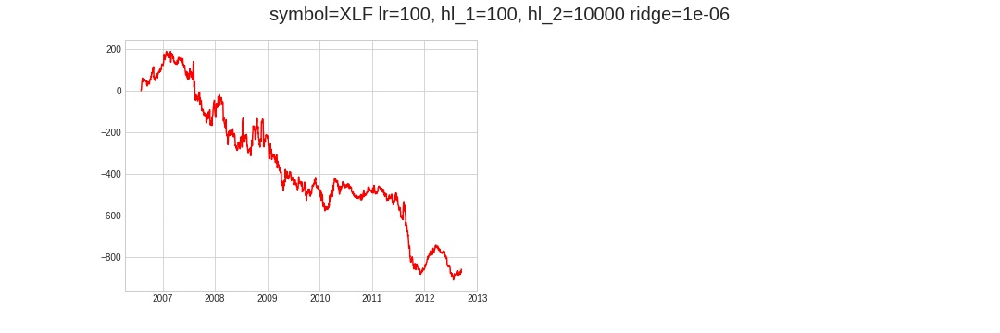

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
XLF,20000,0.9994,0.051275,-0.116339,-0.007309,0.000053,-1.032221,-1.0318,-1.012568,0.886612,0.63565,0.215968,0.189693,1154698200000000000,1347537600000000000


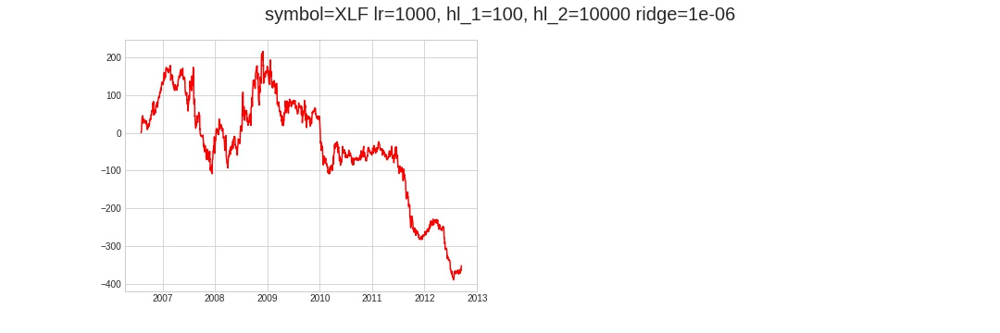

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
XLF,20000,0.9994,0.016532,-0.171747,-0.011201,0.000125,-1.582918,-1.580685,-1.561416,0.907568,0.53609,0.133531,0.119926,1154698200000000000,1347537600000000000


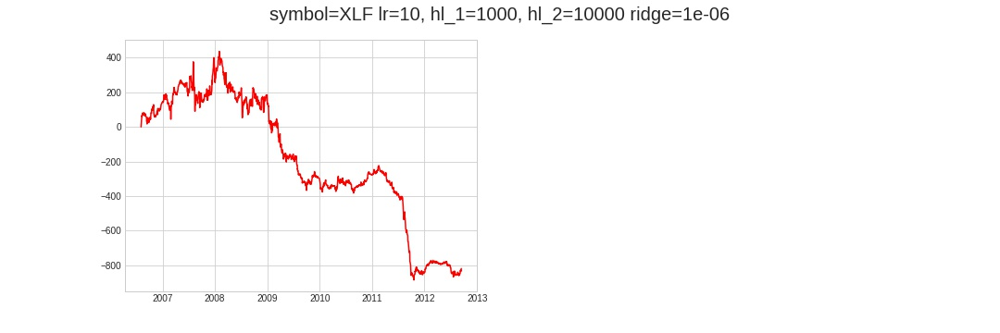

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
XLF,20000,0.9994,0.00578,-0.033111,-0.002214,0.000005,-0.309372,-0.29984,-0.296587,0.89792,0.582025,0.089624,0.10019,1154698200000000000,1347537600000000000


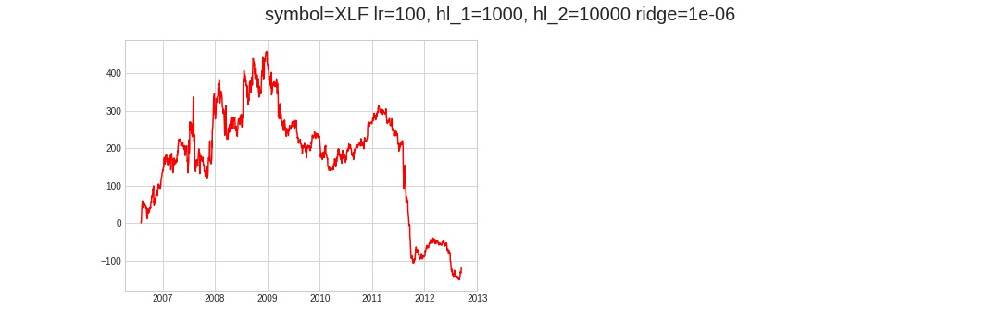

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
XLF,20000,0.9994,0.016587,0.086511,0.005766,0.000033,0.813781,0.743019,0.718083,0.871964,0.568091,0.156373,0.117159,1154698200000000000,1347537600000000000


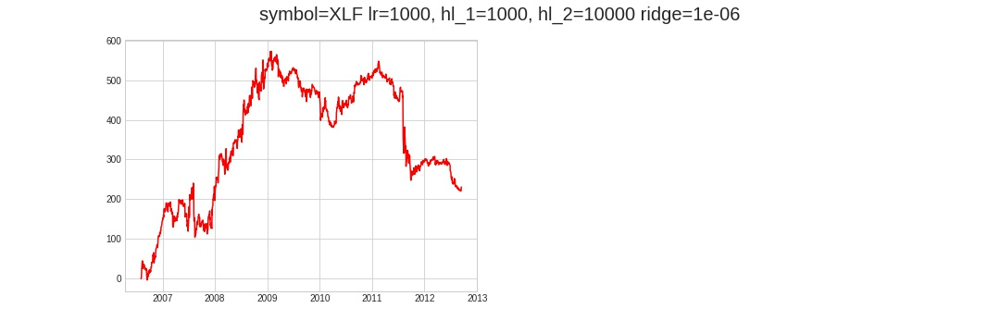

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
XLF,20000,0.9994,-0.013334,-0.040796,-0.002639,0.000007,-0.370009,-0.370007,-0.356759,0.928339,0.591013,0.146943,0.124238,1154698200000000000,1347537600000000000


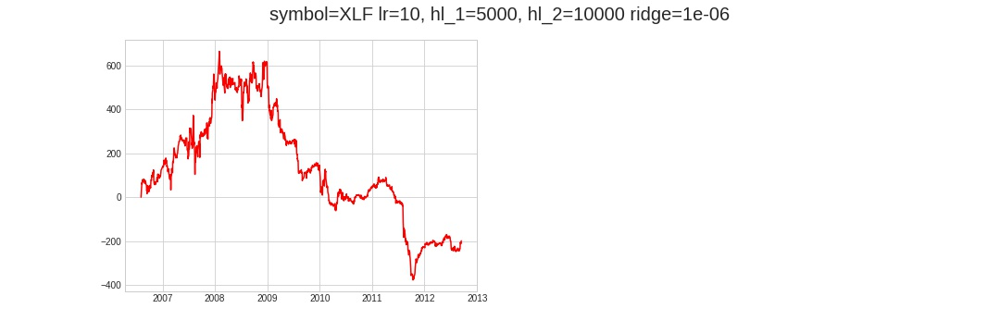

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
XLF,20000,0.9994,-0.019828,0.070701,0.004607,0.000021,0.649519,0.62858,0.597721,0.920807,0.639898,0.152029,0.149686,1154698200000000000,1347537600000000000


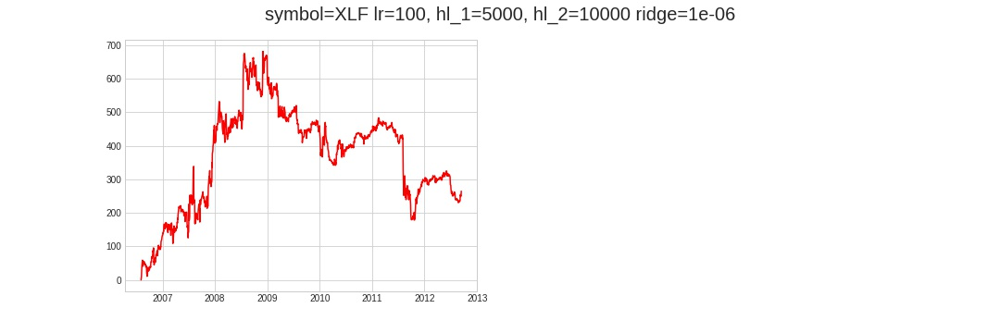

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
XLF,20000,0.9994,-0.011424,0.153038,0.010378,0.000108,1.466531,1.339462,1.287527,0.88959,0.614915,0.212453,0.150077,1154698200000000000,1347537600000000000


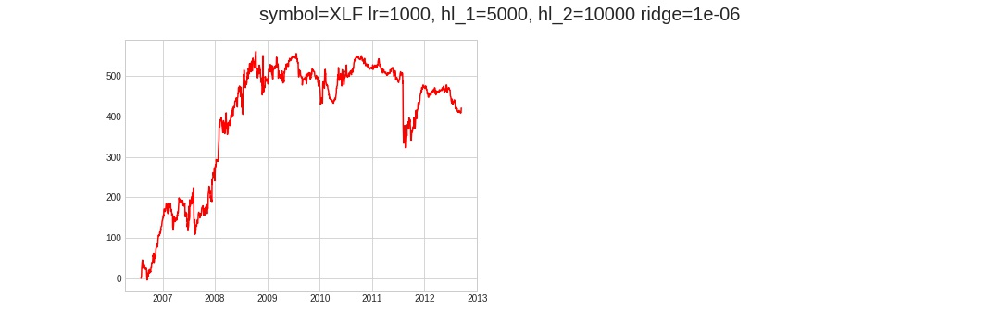

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,20000,0.99925,-0.007598,-0.548485,-0.036071,0.001301,-5.102543,-4.802402,-4.7958,0.893931,0.463786,-0.037088,0.022356,1154698200000000000,1347537600000000000


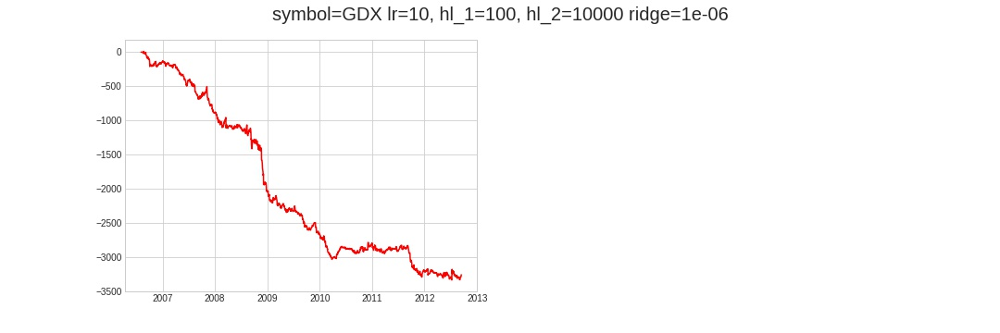

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,20000,0.99925,-0.009455,-0.324091,-0.021891,0.000479,-3.095353,-2.744362,-2.767807,0.88205,0.524206,0.015575,0.057355,1154698200000000000,1347537600000000000


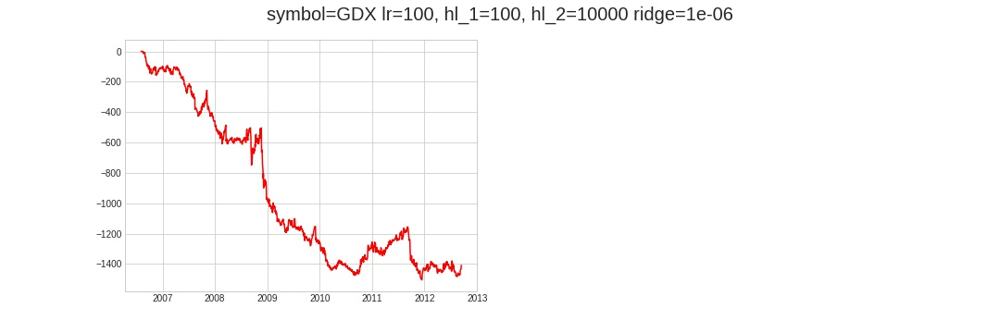

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,20000,0.99925,0.01215,-0.104042,-0.007162,0.000051,-1.012557,-0.88953,-0.909767,0.872836,0.570647,0.071068,0.069058,1154698200000000000,1347537600000000000


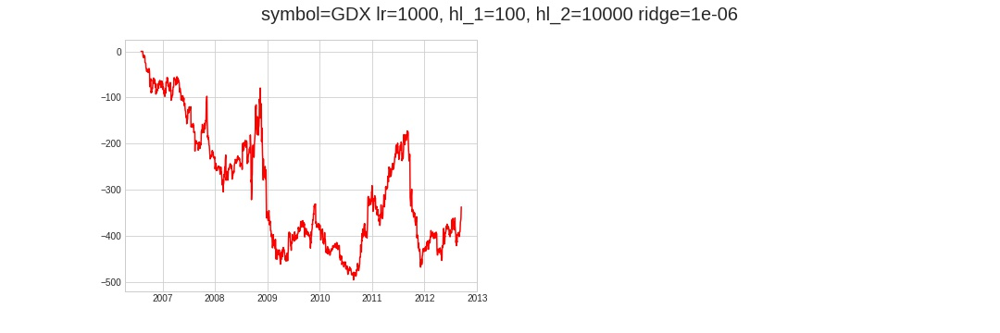

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,20000,0.99925,0.001775,-0.164937,-0.011055,0.000122,-1.562971,-1.466132,-1.459374,0.923877,0.551095,0.082446,0.074723,1154698200000000000,1347537600000000000


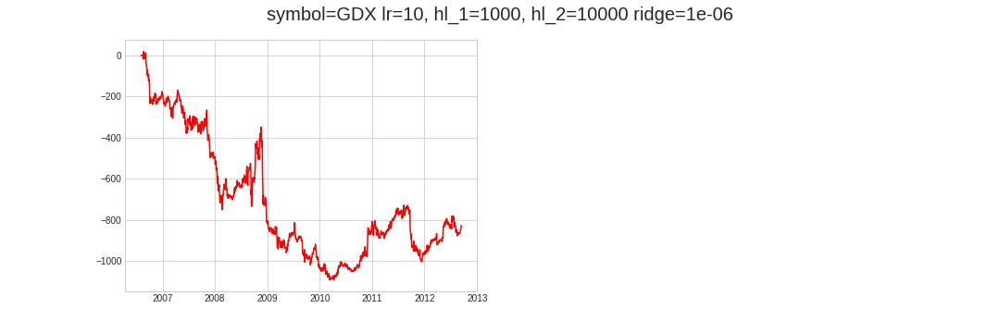

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,20000,0.99925,0.029354,0.090683,0.00621,0.000039,0.877944,0.787264,0.777927,0.905209,0.593159,0.133561,0.083753,1154698200000000000,1347537600000000000


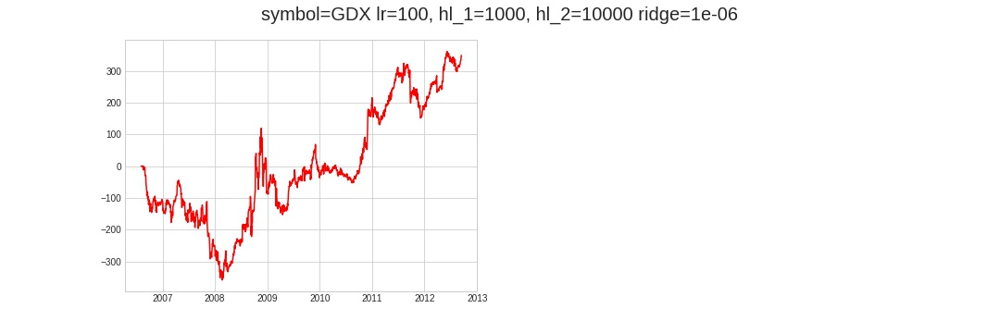

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,20000,0.99925,0.057132,0.193716,0.013255,0.000176,1.873992,1.691707,1.703429,0.888741,0.601293,0.156771,0.074882,1154698200000000000,1347537600000000000


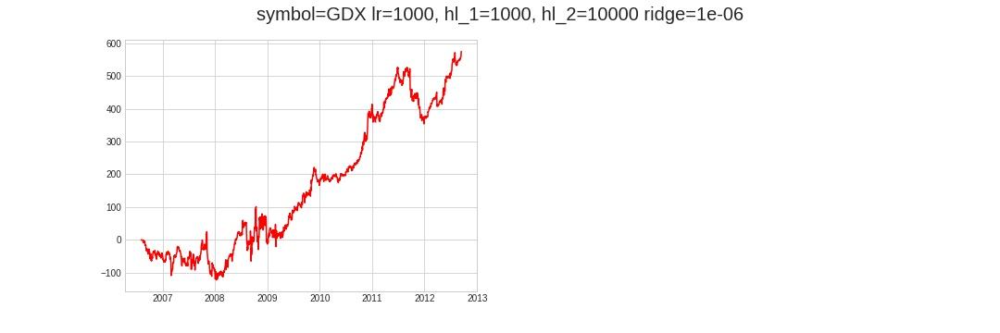

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,20000,0.99925,0.029053,0.020757,0.001377,0.000002,0.195141,0.184426,0.183644,0.94298,0.629256,0.173424,0.110889,1154698200000000000,1347537600000000000


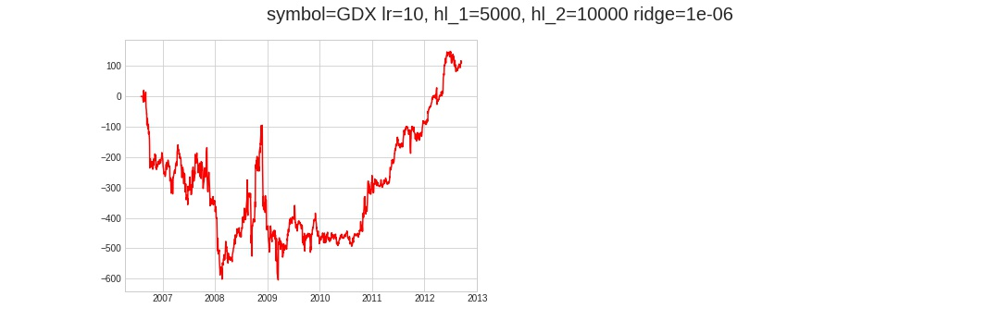

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,20000,0.99925,0.057975,0.221952,0.014856,0.000221,2.100414,1.966027,1.9668,0.926641,0.655644,0.218089,0.116906,1154698200000000000,1347537600000000000


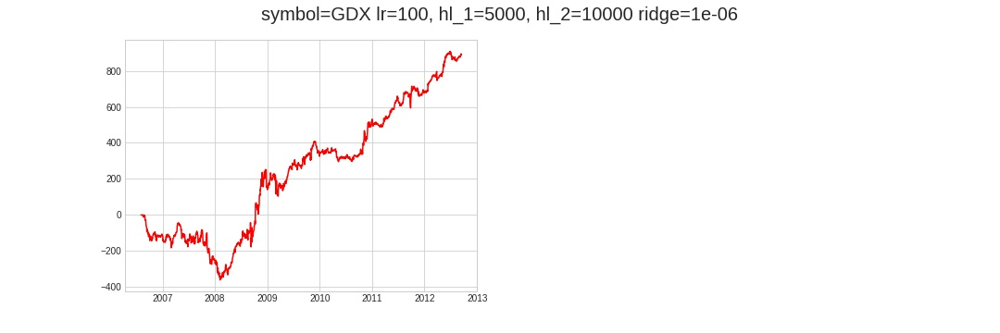

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,20000,0.99925,0.080917,0.231806,0.015638,0.000245,2.210945,2.026542,2.060382,0.894328,0.617929,0.172866,0.077978,1154698200000000000,1347537600000000000


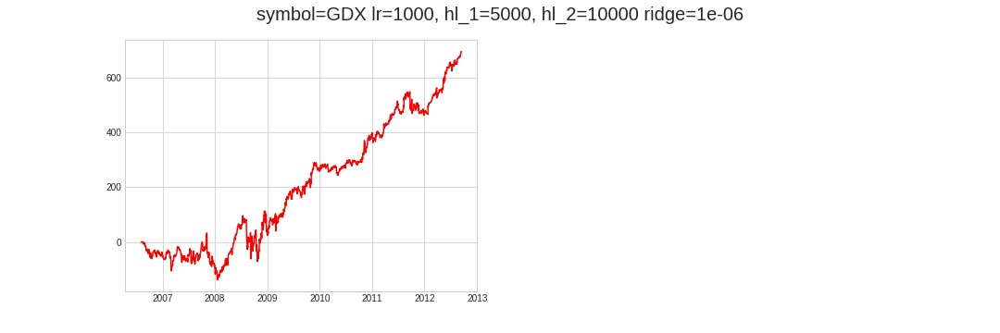

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
EEM,20000,0.9994,0.027901,-0.127564,-0.007957,0.000063,-1.123071,-1.171307,-1.231279,0.896635,0.558391,0.039111,0.019768,1154698200000000000,1347537600000000000


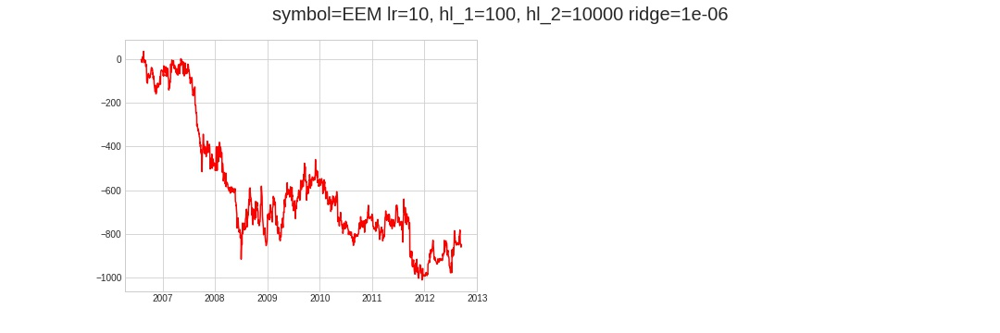

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
EEM,20000,0.9994,0.042367,-0.159154,-0.009972,0.000099,-1.408385,-1.428851,-1.47023,0.890018,0.587435,0.080237,0.023837,1154698200000000000,1347537600000000000


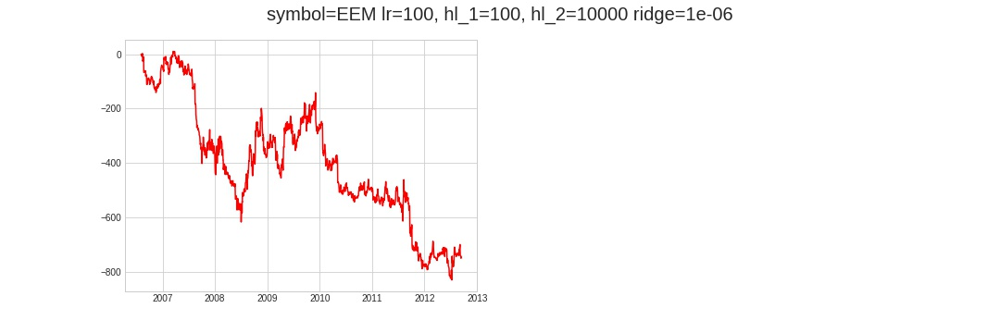

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
EEM,20000,0.9994,0.052217,-0.084568,-0.005385,0.000029,-0.758443,-0.748502,-0.759406,0.87289,0.608084,0.166738,0.067562,1154698200000000000,1347537600000000000


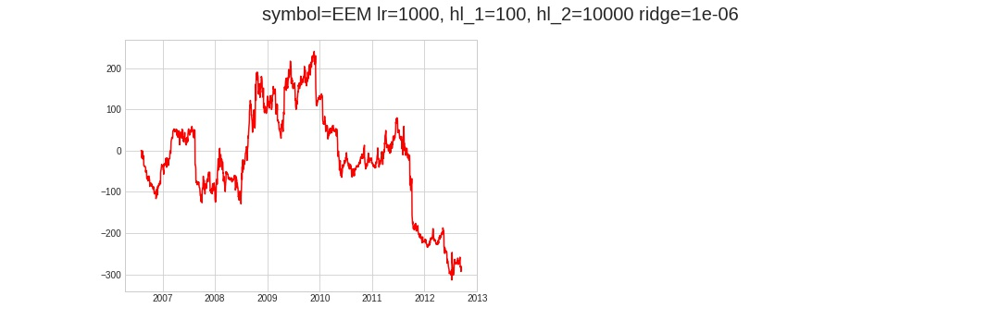

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
EEM,20000,0.9994,0.020352,0.033234,0.002296,0.000005,0.317874,0.296875,0.301842,0.909252,0.540895,0.091393,0.067328,1154698200000000000,1347537600000000000


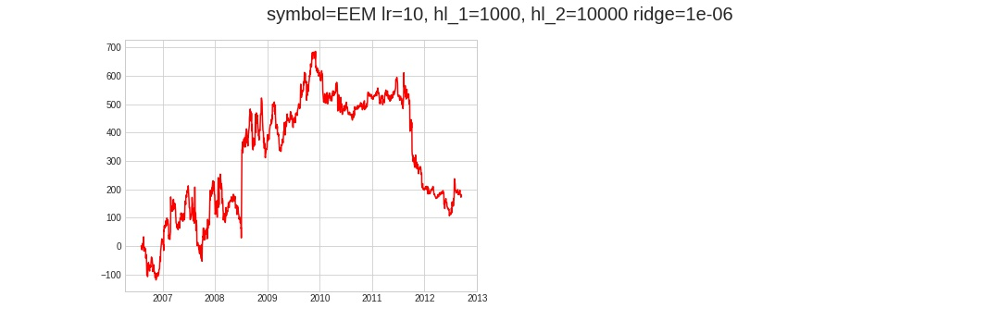

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
EEM,20000,0.9994,0.028618,-0.002388,-0.000493,2.434402e-07,-0.022694,-0.021021,-0.021016,0.892679,0.547767,0.056053,0.01213,1154698200000000000,1347537600000000000


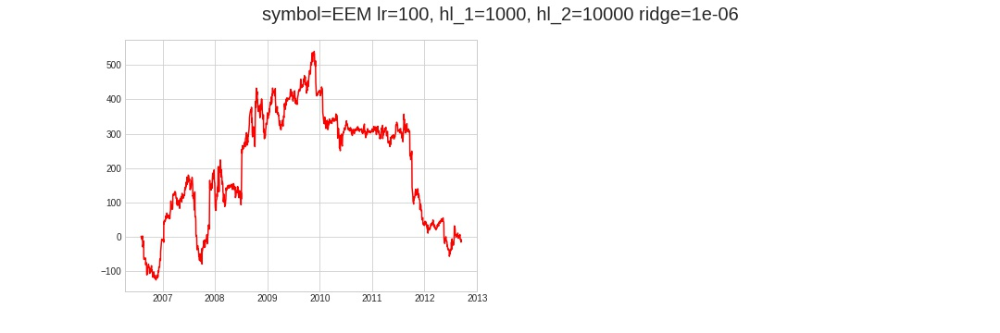

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
EEM,20000,0.9994,0.021072,0.092676,0.006132,0.000038,0.864411,0.817229,0.826662,0.857872,0.559239,0.092523,0.023132,1154698200000000000,1347537600000000000


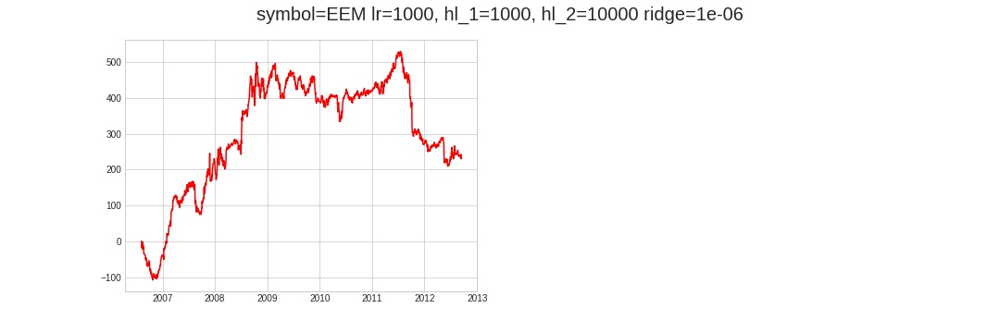

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
EEM,20000,0.9994,0.015564,0.13524,0.009321,0.000087,1.316232,1.238644,1.269465,0.929226,0.565715,0.158147,0.136579,1154698200000000000,1347537600000000000


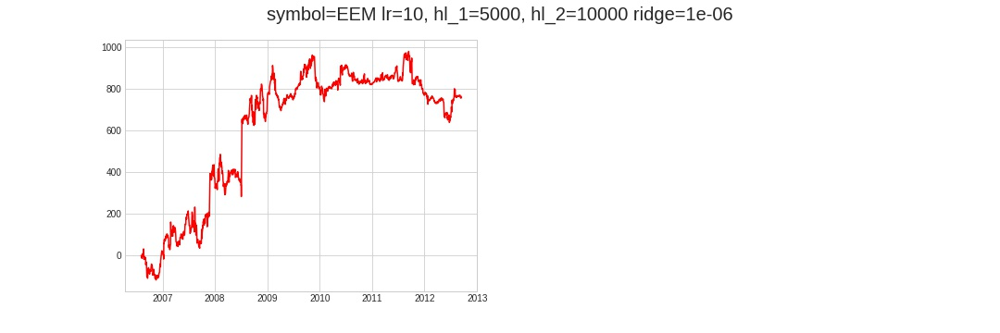

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
EEM,20000,0.9994,0.008363,0.067712,0.004689,0.000022,0.659683,0.601591,0.607344,0.910052,0.57492,0.050462,0.027669,1154698200000000000,1347537600000000000


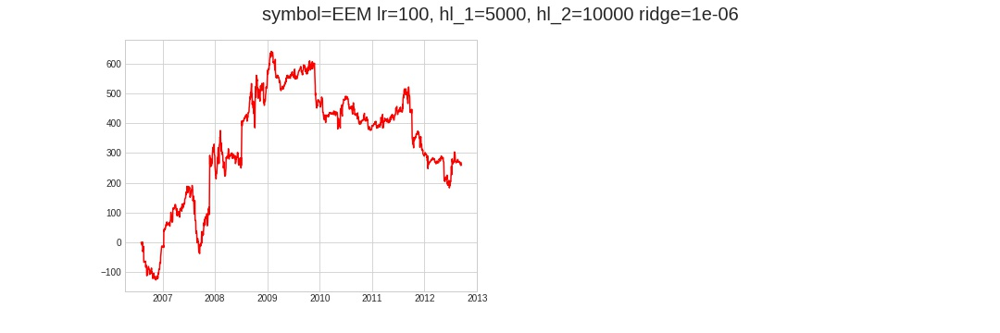

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
EEM,20000,0.9994,0.015317,0.145101,0.009716,0.000094,1.372077,1.285372,1.332758,0.873836,0.567928,0.066665,-0.008826,1154698200000000000,1347537600000000000


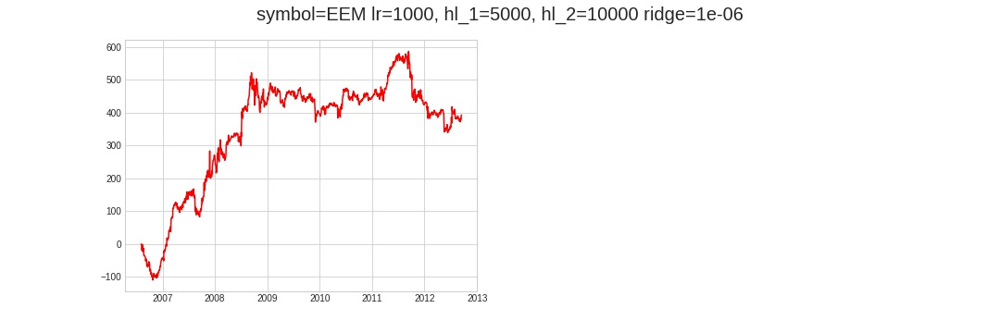

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,20000,0.8987,-0.004358,0.073167,0.005154,0.000027,0.690424,0.699204,0.71726,0.954782,0.758185,0.367664,0.331881,1154698200000000000,1347537600000000000


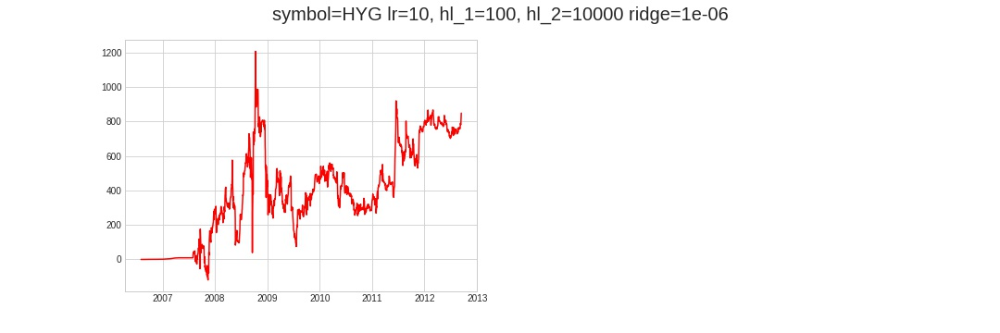

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,20000,0.8987,-0.025035,0.107567,0.007494,0.000056,1.004388,0.990521,1.009849,0.954269,0.823318,0.494551,0.472732,1154698200000000000,1347537600000000000


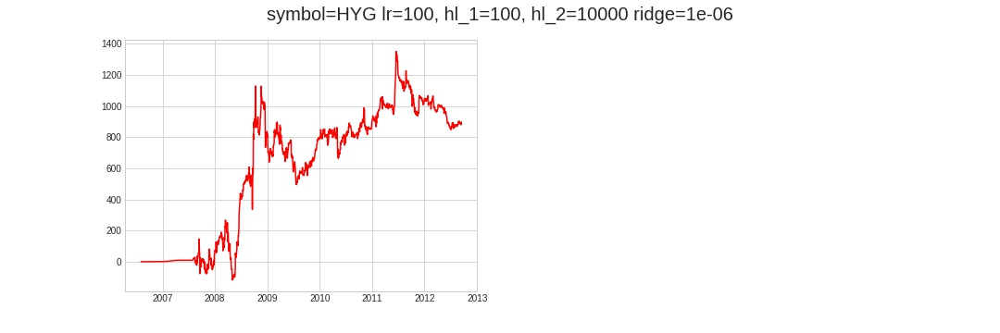

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,20000,0.8987,-0.02891,0.05656,0.003782,0.000014,0.506294,0.498173,0.476178,0.916134,0.76334,0.430679,0.384744,1154698200000000000,1347537600000000000


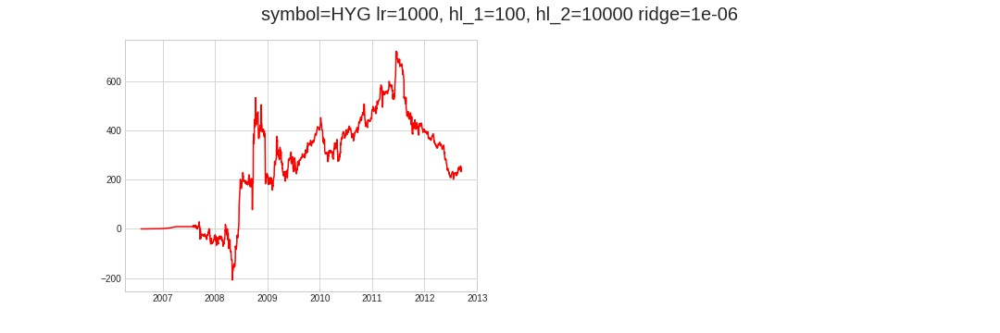

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,20000,0.8987,-0.01701,0.001306,0.000219,4.781288e-08,0.012782,0.011934,0.013126,0.97896,0.805997,0.455396,0.41654,1154698200000000000,1347537600000000000


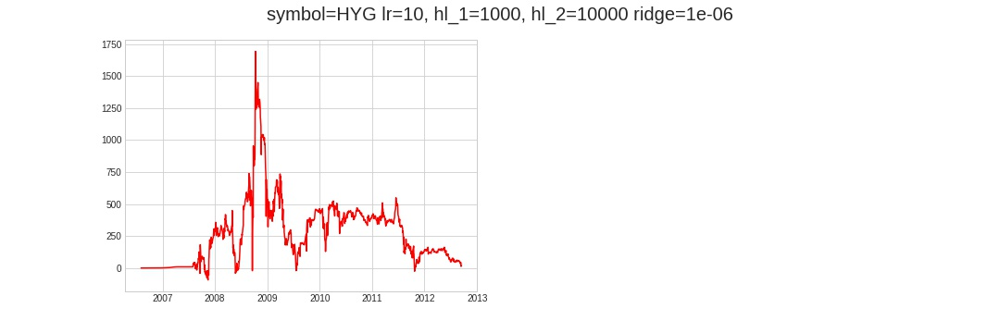

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,20000,0.8987,-0.038582,0.062406,0.004536,0.000021,0.607524,0.567975,0.596801,0.983084,0.886342,0.631239,0.602297,1154698200000000000,1347537600000000000


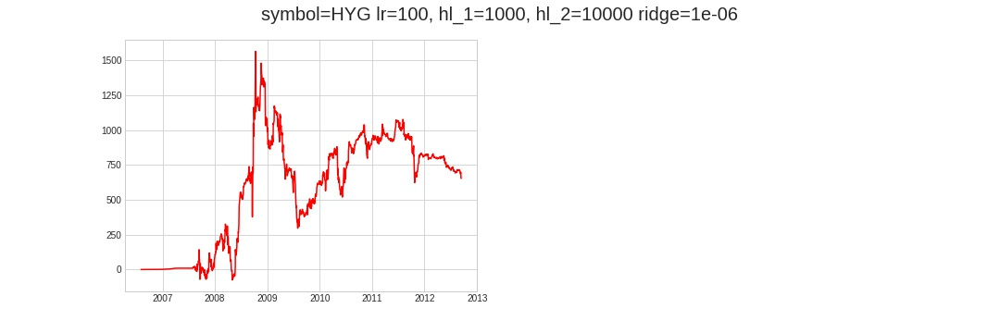

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,20000,0.8987,-0.075648,0.00764,0.000586,3.435422e-07,0.074017,0.067437,0.068699,0.958655,0.847748,0.589183,0.57748,1154698200000000000,1347537600000000000


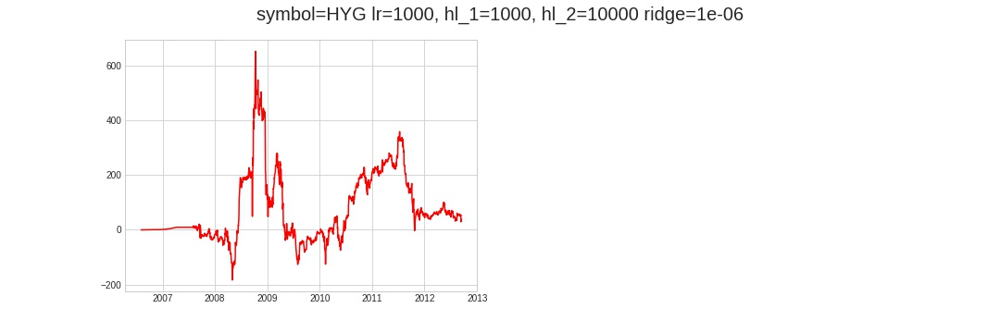

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,20000,0.8987,-0.021578,0.032639,0.002399,0.000006,0.320581,0.294577,0.323971,0.982629,0.822416,0.489183,0.448298,1154698200000000000,1347537600000000000


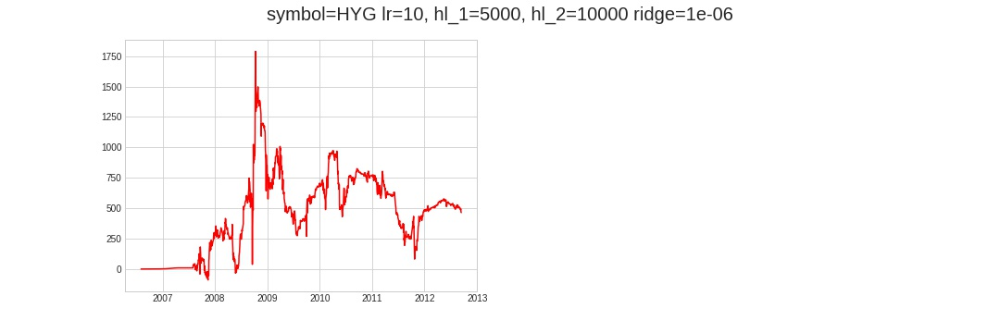

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,20000,0.8987,-0.046574,0.056971,0.004128,0.000017,0.552781,0.512652,0.539656,0.988052,0.906471,0.671217,0.637489,1154698200000000000,1347537600000000000


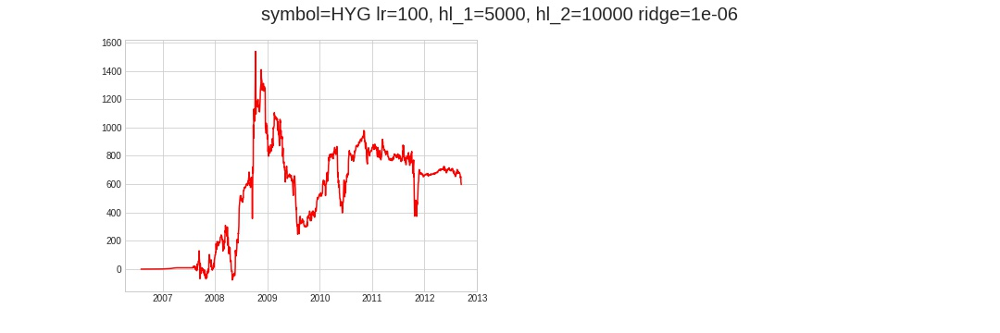

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,20000,0.8987,-0.119485,-0.072866,-0.005188,0.000027,-0.695026,-0.632126,-0.660778,0.980567,0.919404,0.71752,0.685794,1154698200000000000,1347537600000000000


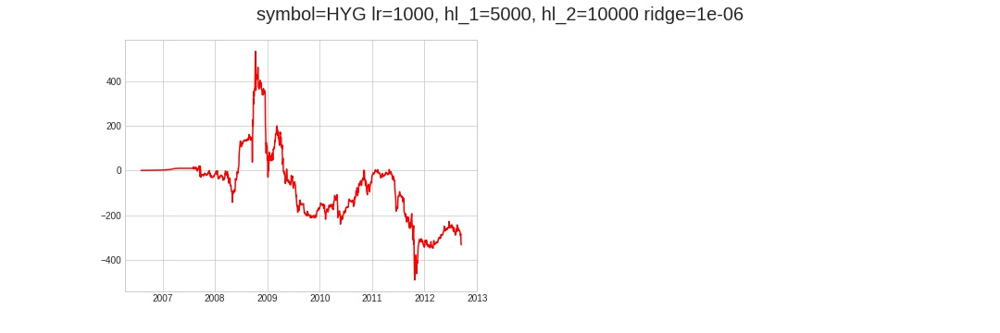

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
AGG,20000,0.9994,-0.018312,0.113755,0.006825,0.000047,0.968652,1.143809,1.164511,0.883138,0.555763,0.131758,0.130299,1154698200000000000,1347537600000000000


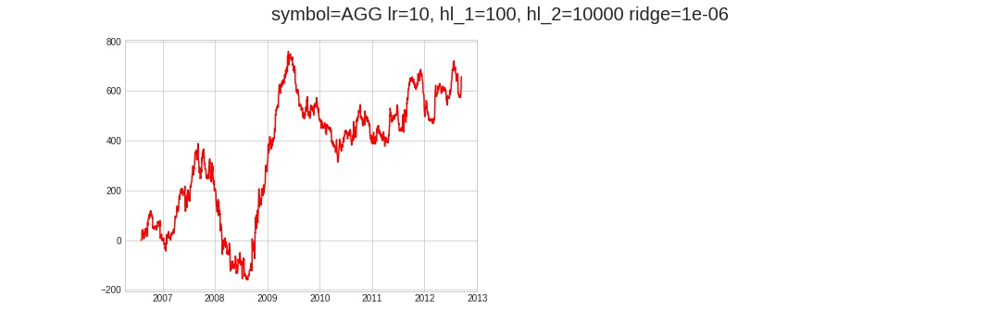

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
AGG,20000,0.9994,-0.030069,0.147157,0.008657,0.000075,1.226784,1.464641,1.503226,0.881997,0.619988,0.198501,0.169781,1154698200000000000,1347537600000000000


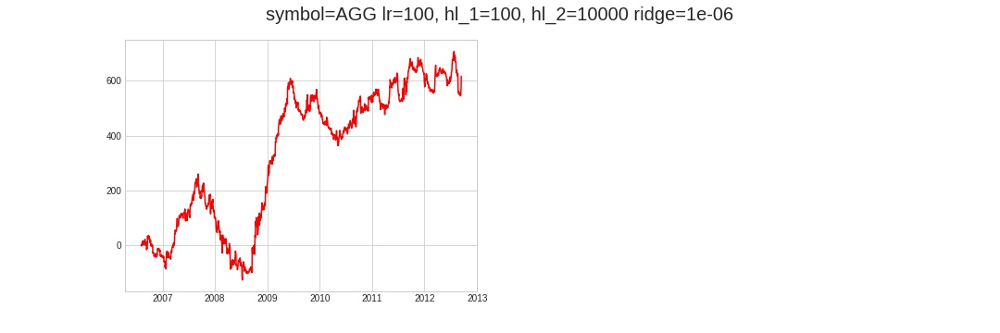

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
AGG,20000,0.9994,-0.047312,0.249413,0.01508,0.000227,2.133829,2.380622,2.386992,0.870056,0.643107,0.25073,0.201181,1154698200000000000,1347537600000000000


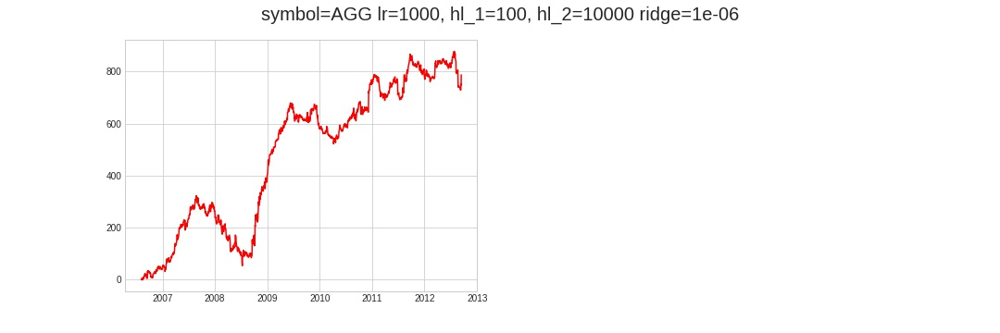

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
AGG,20000,0.9994,-0.026165,0.193321,0.012028,0.000145,1.702691,1.964389,1.984815,0.899073,0.6034,0.153467,0.113334,1154698200000000000,1347537600000000000


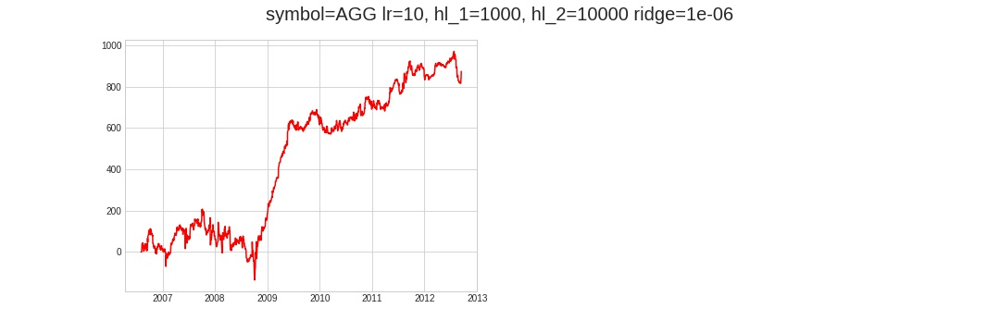

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
AGG,20000,0.9994,-0.036801,0.253349,0.015771,0.000249,2.231488,2.478328,2.49641,0.878079,0.640699,0.168462,0.138817,1154698200000000000,1347537600000000000


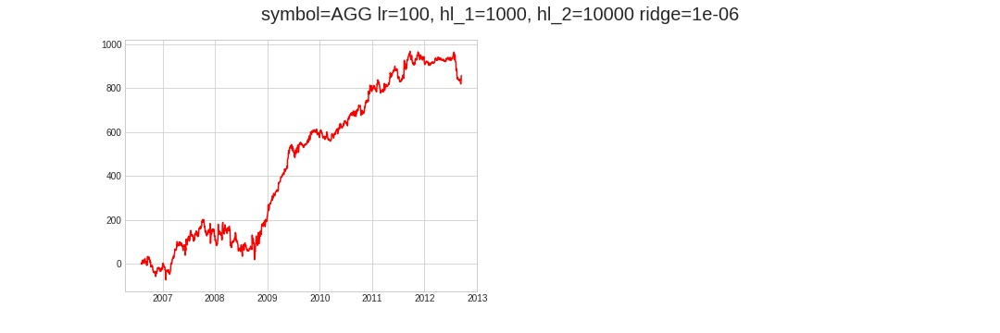

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
AGG,20000,0.9994,-0.083789,0.354662,0.022533,0.000508,3.187573,3.394568,3.385677,0.832125,0.601355,0.202749,0.167487,1154698200000000000,1347537600000000000


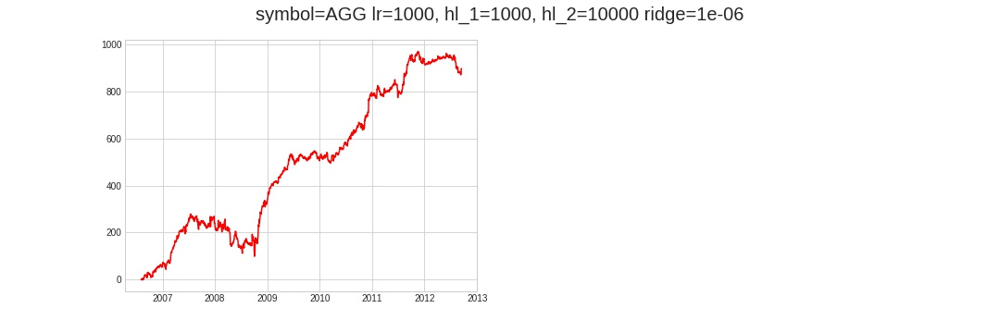

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
AGG,20000,0.9994,-0.038726,0.242482,0.015695,0.000246,2.220765,2.421916,2.438912,0.906242,0.625832,0.147048,0.112059,1154698200000000000,1347537600000000000


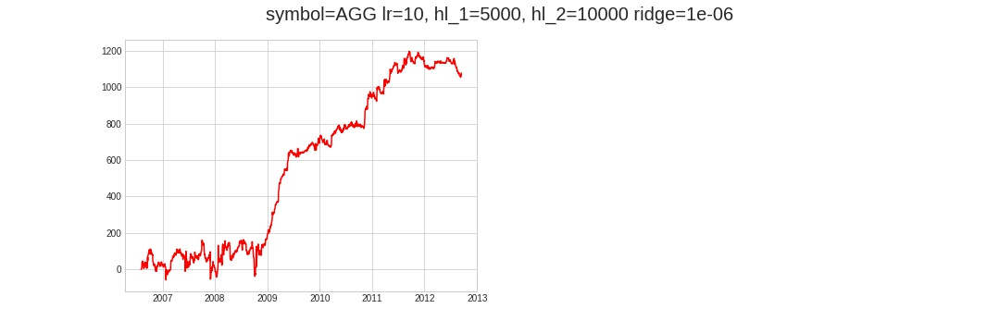

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
AGG,20000,0.9994,-0.059915,0.288303,0.018632,0.000347,2.635956,2.755661,2.806958,0.886003,0.670728,0.199807,0.164894,1154698200000000000,1347537600000000000


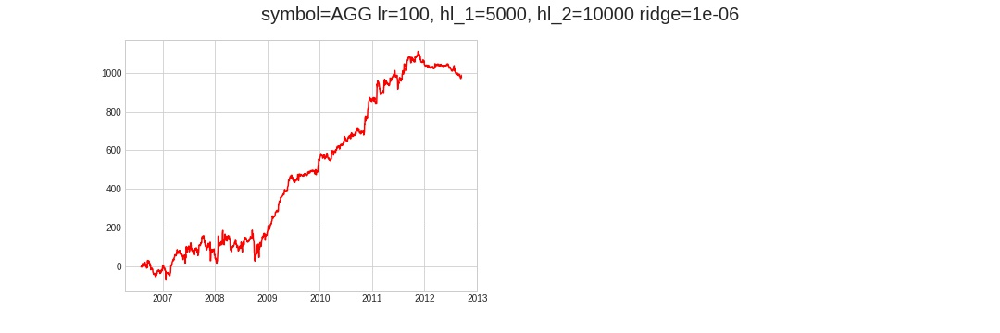

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
AGG,20000,0.9994,-0.107379,0.325786,0.020933,0.000438,2.96123,3.08033,3.144747,0.82875,0.633398,0.249268,0.201402,1154698200000000000,1347537600000000000


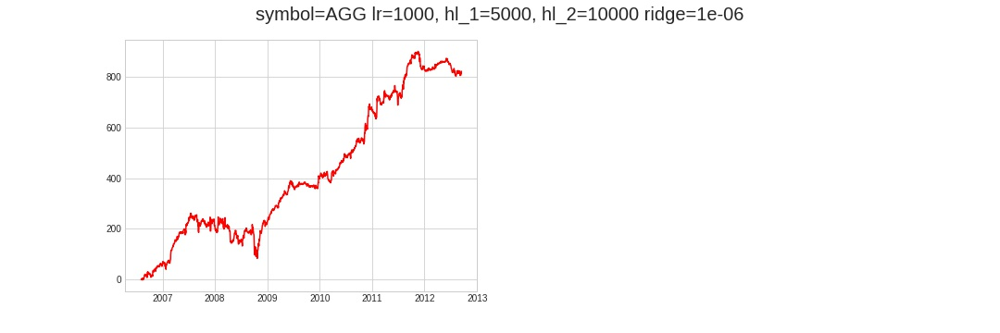

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
BND,20000,0.9081,-0.036048,0.083588,0.005469,0.00003,0.735848,0.779542,0.782534,0.926276,0.680377,0.255205,0.217525,1154698200000000000,1347537600000000000


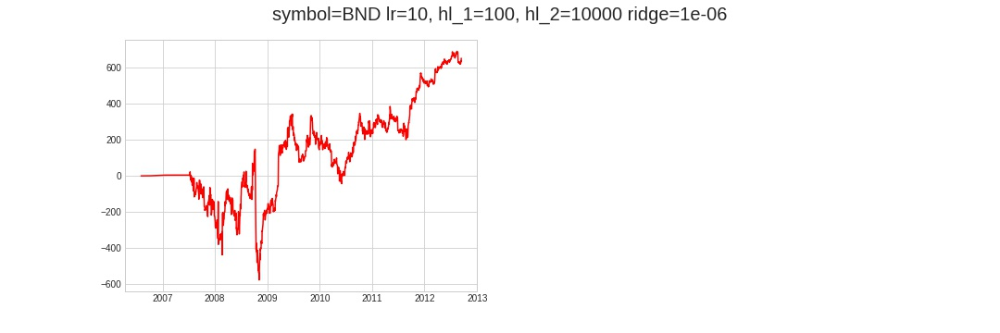

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
BND,20000,0.9081,-0.056396,0.073672,0.004996,0.000025,0.672012,0.618748,0.647797,0.942804,0.775176,0.401481,0.339674,1154698200000000000,1347537600000000000


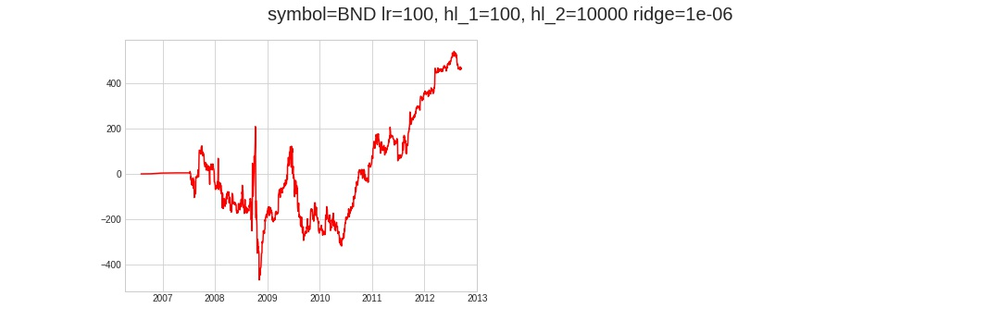

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
BND,20000,0.9081,-0.07997,0.108368,0.007246,0.000053,0.975703,0.927681,0.933412,0.903928,0.724937,0.372298,0.328526,1154698200000000000,1347537600000000000


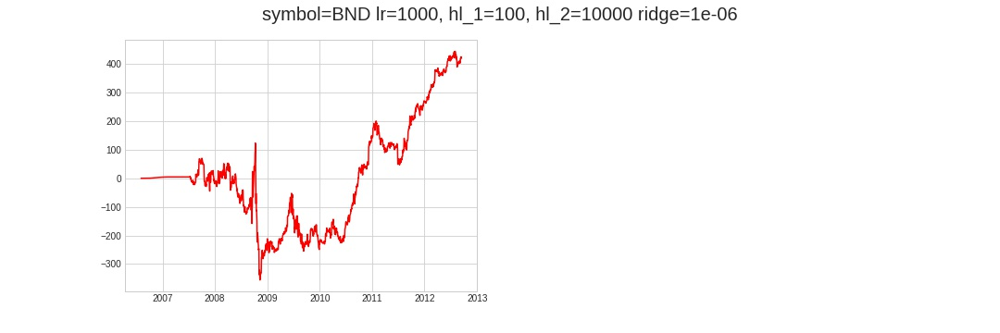

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
BND,20000,0.9081,-0.047624,0.14411,0.009561,0.000091,1.287822,1.264062,1.146066,0.958793,0.749858,0.366811,0.30524,1154698200000000000,1347537600000000000


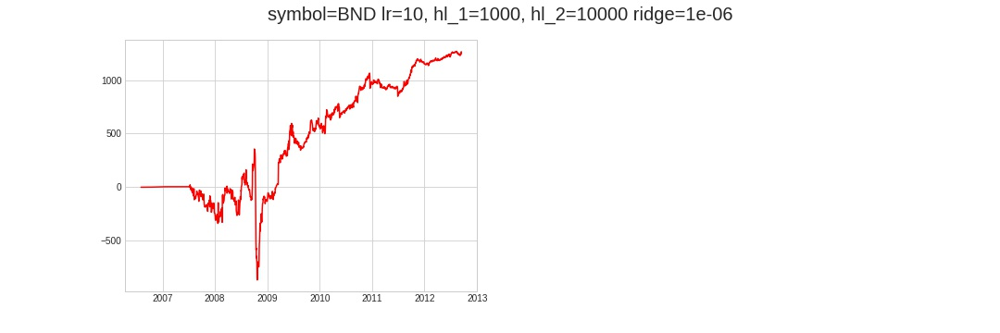

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
BND,20000,0.9081,-0.054378,0.038098,0.002641,0.000007,0.353609,0.310789,0.322147,0.977808,0.863781,0.563718,0.505929,1154698200000000000,1347537600000000000


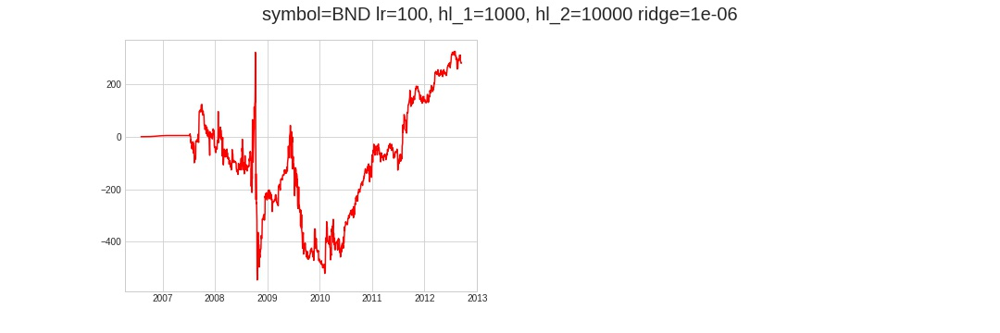

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
BND,20000,0.9081,-0.092082,0.010464,0.000792,6.267666e-07,0.098693,0.090066,0.091042,0.96024,0.846497,0.582177,0.534229,1154698200000000000,1347537600000000000


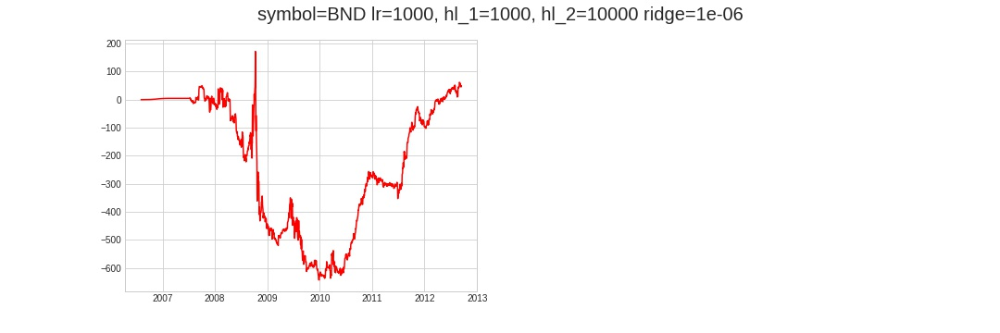

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
BND,20000,0.9081,-0.062897,0.080718,0.005472,0.00003,0.736316,0.694876,0.635982,0.969284,0.780734,0.402119,0.333577,1154698200000000000,1347537600000000000


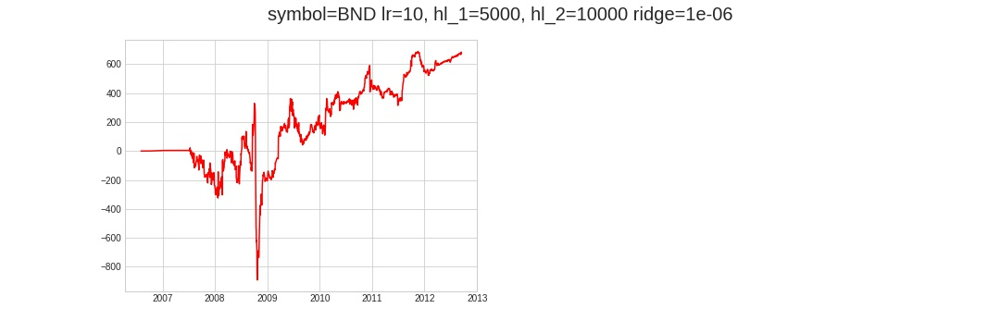

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
BND,20000,0.9081,-0.065175,-0.001808,-0.000326,1.063477e-07,-0.017,-0.014756,-0.015373,0.984554,0.881019,0.588093,0.528254,1154698200000000000,1347537600000000000


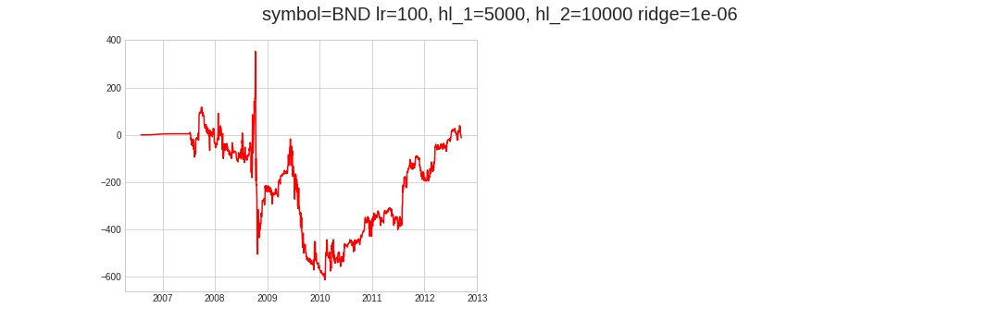

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
BND,20000,0.9081,-0.159508,-0.003149,-0.000375,1.403063e-07,-0.030095,-0.02708,-0.027646,0.975818,0.883938,0.649428,0.60114,1154698200000000000,1347537600000000000


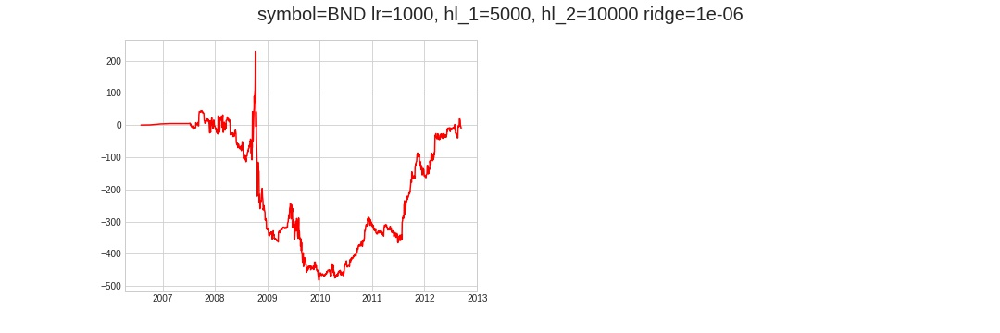

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
VXX,20000,0.7635,0.014156,-0.216159,-0.01797,0.000323,-2.220718,-1.906253,-1.927193,0.960839,0.696083,0.293492,0.273096,1154698200000000000,1347537600000000000


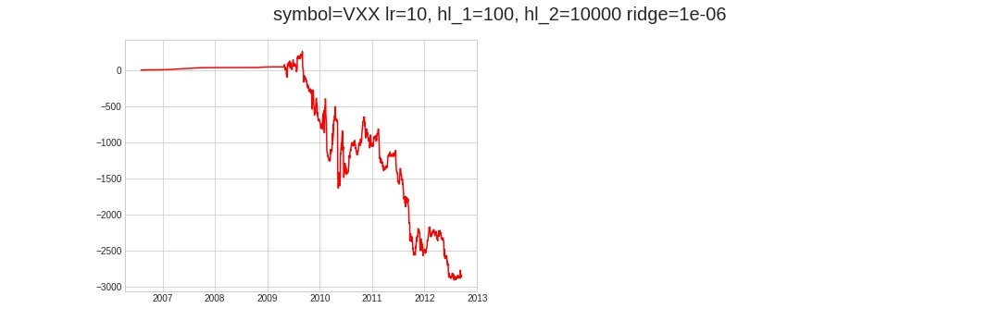

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
VXX,20000,0.7635,0.044782,-0.081626,-0.007209,0.000052,-0.89033,-0.700504,-0.710578,0.96097,0.715987,0.402886,0.379012,1154698200000000000,1347537600000000000


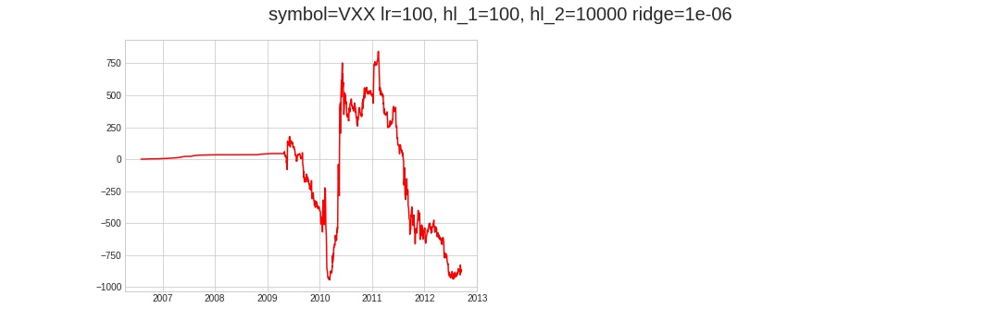

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
VXX,20000,0.7635,0.097042,-0.044167,-0.003514,0.000012,-0.433141,-0.346803,-0.32793,0.970077,0.848478,0.584397,0.550389,1154698200000000000,1347537600000000000


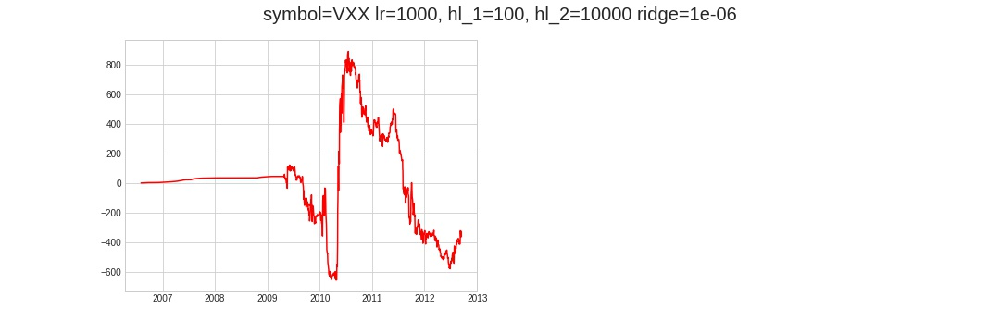

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
VXX,20000,0.7635,0.019399,-0.178007,-0.015021,0.000226,-1.856125,-1.555883,-1.534682,0.97965,0.744283,0.334493,0.272906,1154698200000000000,1347537600000000000


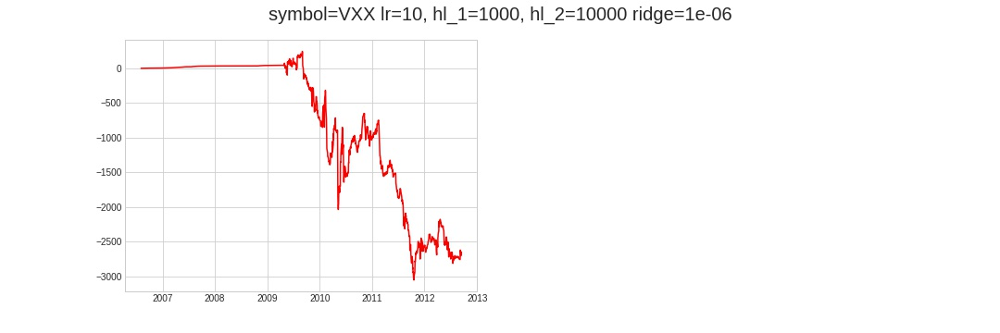

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
VXX,20000,0.7635,0.04427,-0.058966,-0.005221,0.000027,-0.644426,-0.508293,-0.5178,0.984281,0.798985,0.540947,0.516818,1154698200000000000,1347537600000000000


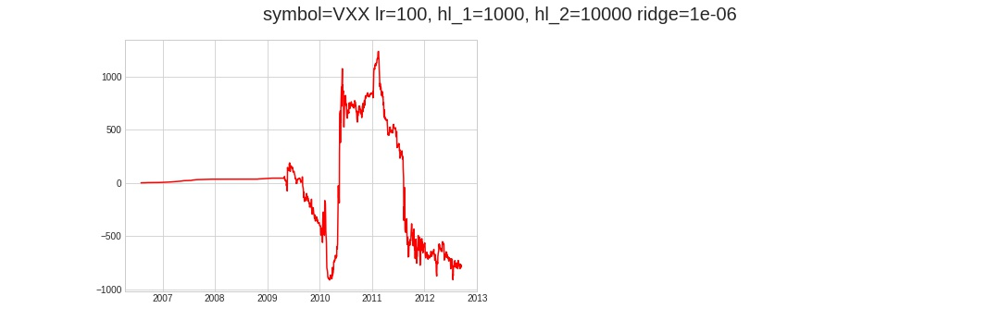

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
VXX,20000,0.7635,0.09491,-0.024238,-0.001931,0.000004,-0.236698,-0.187588,-0.177871,0.984112,0.904555,0.687118,0.666627,1154698200000000000,1347537600000000000


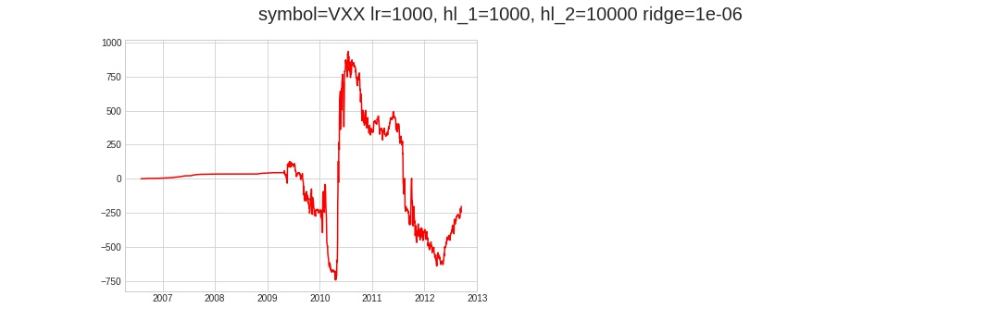

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
VXX,20000,0.7635,0.025726,-0.15883,-0.012852,0.000165,-1.587931,-1.342637,-1.311602,0.981455,0.776493,0.394931,0.337513,1154698200000000000,1347537600000000000


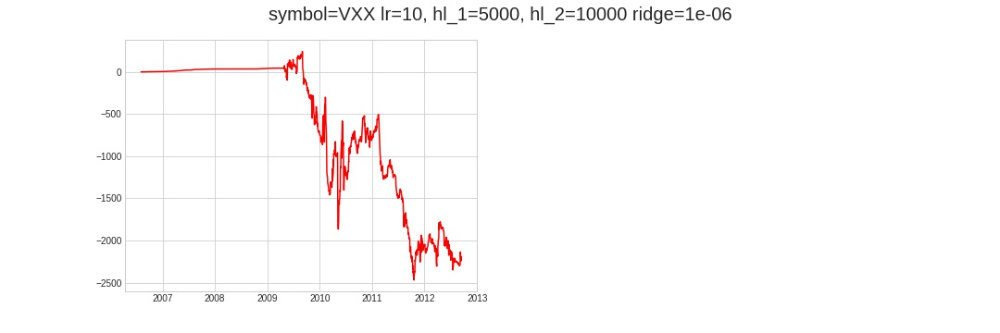

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
VXX,20000,0.7635,0.049247,-0.05779,-0.005031,0.000025,-0.620966,-0.49619,-0.499339,0.989315,0.836824,0.609585,0.585381,1154698200000000000,1347537600000000000


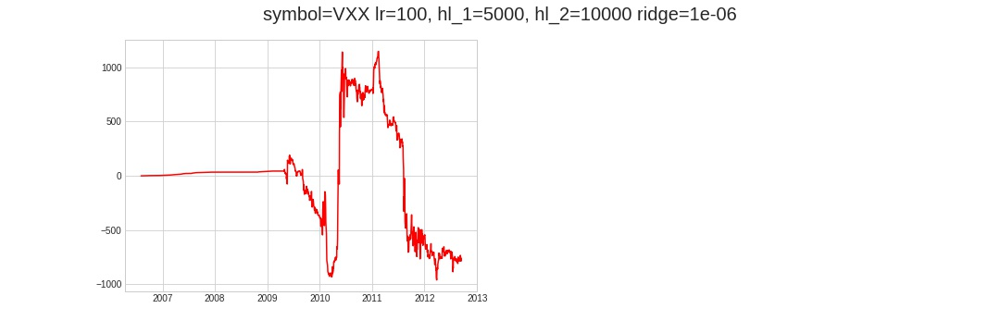

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
VXX,20000,0.7635,0.093678,-0.035858,-0.002803,0.000008,-0.345031,-0.276424,-0.262453,0.991693,0.93221,0.72395,0.705116,1154698200000000000,1347537600000000000


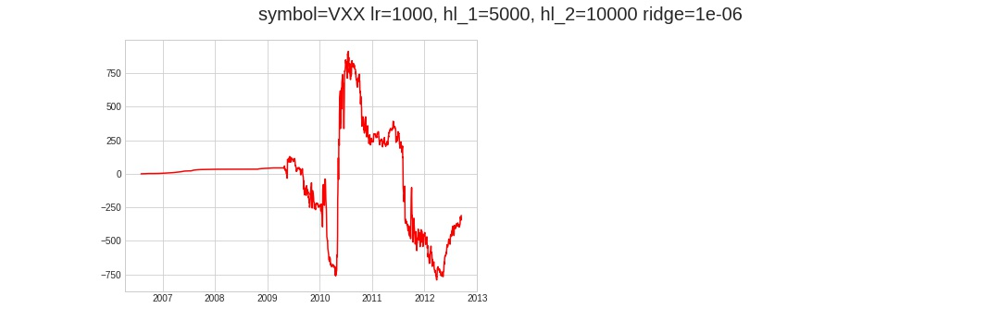

In [4]:
# --- 30 min online model (INSAMPLE)----
#####################################################################
%inline
hps = mx.HPSet()    
hps.symbol = 'SPY'
hps.features = (
    [ 'logrtn_lag_overnight', 'logrtn_lag_weekend',
      'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day',
     # 'logrtn_lag_intraday', 'logrtn_lag_intraweek',    'logrtn_lag_intramonth', 
     #'log_dollar_volume_30min', 'log_open_30min', 'log_dollar_volume_intraday', 'log_dollar_volume_intraweek',
     'log_open_30min_26.ew_sd',  'log_dollar_volume_30min_26.ew_sd',  'logrtn_lag_30min_26.ew_sd',  'logrtn_lag_1day_26.ew_sd',
     'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd',
     'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd',
     'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean',
     'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean',
     'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean']
    + ['cos_timeofday', 'sin_timeofday', 'cos_dayofweek', 'sin_dayofweek', 
       'cos_dayofmonth','sin_dayofmonth', 'cos_weekofyear', 'sin_weekofyear']
)
hps.response = 'logrtn_lead_30min_equalized'
hps.weight = 'one'
hps.lookhead = 12
hps.hl_1 = 100
hps.hl_2 = 10000      
hps.lr = 100
hps.algo = 'mbprox'
hps.loss = 'psr'
hps.ridge = 1e-3
hps.transformer = 'quadratic_transformer'


@mx.memoize
def compute_feature_sd_and_mean( features=hps.features ):
    builder = FeatureBuilder()
    da = builder( data=None )
    fsd = da.loc[:,:,features].std( dim='time' ).to_dataframe_mx()
    fmu = da.loc[:,:,features].mean( dim='time' ).to_dataframe_mx()
    return fsd, fmu

with mx.timer( 'compute_feature_sd_and_mean '):
    fsd, fmu = compute_feature_sd_and_mean()
disp( 'Feature batch means (mean and std across symbols)',  pd.concat( [fmu.mean(axis=0), fmu.std(axis=0)], axis=1  ).rename(columns={0:'mean', 1:'std'}), h=3 )
disp( 'Feature batch SD (mean and std across symbols)',  pd.concat( [fsd.mean(axis=0), fsd.std(axis=0)], axis=1  ).rename(columns={0:'mean', 1:'std'}), h=3 )

@mx.memoize
def run_one_configuration( hps, begin=28000, end=48000, verbose=True ):
    ''' run one configuration end to end'''
    # quadratic transformer
    def quadratic_transformer( Xt ):
        '''    compute quadratic features transforms for online learning    '''
        Xo =  tr.einsum( 'tna,tnb->tnab', Xt, Xt )
        assert Xo.shape == (Xt.shape[0], Xt.shape[1], Xt.shape[2], Xt.shape[2] )
        return Xo.reshape( Xt.shape[0], Xt.shape[1], -1 )

    builder = FeatureBuilder()
    da = builder( data=None )    
    da_use = da.loc[:, :, list(hps.features) + [hps.response, hps.weight]].fillna( 0 )[begin:end]
    # make sure you don't squeeze out this dimension !
    if hps.symbol is not None:
        da_use = da_use.sel( symbol=[hps.symbol] )
    X = da_use.loc[:, :, list(hps.features)]
    Y = da_use.loc[:, :, [hps.response]]
    W = da_use.loc[:, :, [hps.weight]]    
    
    # normalize X and Y before fitting ... just for shits and giggles
    X = (X - X.mean( dim=['time','symbol']) )/ X.std( dim=['time','symbol'] )
    Y = (Y - Y.mean( dim=['time','symbol']) )/ Y.std( dim=['time','symbol'] )
    
    decay_1 = mx.Resolve.halflife( hps.hl_1 )['decay']
    hl_1 = mx.Resolve.halflife( hps.hl_1 )['halflife']
    decay_2 = mx.Resolve.halflife( hps.hl_2 )['decay']
    hl_2 = mx.Resolve.halflife( hps.hl_2 )['halflife']
    
    tr.cuda.empty_cache()    
    device = 'cuda'
    dtype = tr.float64

    # the linear rnn learner
    linear_rnn = mxtr.LinearRNN(
        lookahead=hps.lookhead, ridge=hps.ridge, loss=hps.loss, algo=hps.algo,
        decay_1=decay_1, decay_2=decay_2, lr=hps.lr,
        transformer=quadratic_transformer if hps.transformer == 'quadratic_transformer' else None, 
        verbose=verbose, 
    )        
    tr.cuda.empty_cache()
    Xt = tr.as_tensor( X.values, dtype=dtype, device=device )
    Yt = tr.as_tensor( Y.values, dtype=dtype, device=device )
    Wt = tr.as_tensor( W.values, dtype=dtype, device=device )
    Yht, meta, state = linear_rnn( Xt, Yt, Wt )
    Yh = Yht.to_dataarray( Y )
    wins = mx.transforms.batch( sid='symbol' ).winsorize( quantiles=0.05 )
    #Yh = wins( Yh, features=Yh.features.values )
    
    reg = mx.Regression( response=hps.response, weight=hps.weight, dk_lags=[10, 30], autocorr=[1, 12, 72, 100],  )
    fig = figure( figsize=(15, 5 ) )            
    with timer( 'running regressions' ):
        rm = reg.apply_feature( Yh, Y )
        ax = subplot( 121 )
        model_pnl = rm.pop( 'pnl' )
        perma_pnl = permabet_pnl[model_pnl.index]
        rm['start'] = da_use.time.min().item()
        rm['end'] = da_use.time.max().item()
        rm.pop( 'hitRate' )
        ax.plot( model_pnl.cumsum(), '-r' )
        fig.suptitle( f'symbol={hps.symbol} lr={hps.lr}, hl_1={hps.hl_1}, hl_2={hps.hl_2} ridge={hps.ridge}', fontsize=20 )                    
    return Yh, Y, dict(hps=hps, fig=fig2format( fig ), rm=pd.DataFrame( rm, index=[hps.symbol]) )
                       
 
hl_2 = 10000
for symbol in [None] +  ['SPY' , 'XLF', 'GDX', 'EEM', 'HYG', 'AGG', 'BND', 'VXX']:
    for hl_1 in [100, 1000, 5000 ]: 
        for lr in [10, 100, 1000]:    
            for ridge in [1e-6]:             #1e-1, 1e-3, , 1e-9
                hpsc = hps.clone( symbol=symbol, ridge=ridge, lr=lr, hl_1=hl_1, hl_2=hl_2)
                out = run_one_configuration( hpsc )   
                disp( f'symbol={hpsc.symbol} lr={hpsc.lr}, hl_1={hpsc.hl_1}, hl_2={hpsc.hl_2} ridge={hpsc.ridge}', h=2 )
                disp( hpsc, out[2]['rm'] )
                display( out[2]['fig'] )


# fullsample results
* different HP grid (including `hl_2`
* float32 dtype

,mean,std
features,,
cos_dayofmonth,-2.592226e-02,0.000955
cos_dayofweek,1.825136e-01,0.000894
cos_timeofday,7.130840e-02,0.007088
cos_weekofyear,-1.853680e-02,0.007110
log_dollar_volume_30min_130.ew_mean,1.464890e+01,1.466815
log_dollar_volume_30min_130.ew_sd,9.209896e-01,0.161770
log_dollar_volume_30min_26.ew_mean,1.465688e+01,1.466740
log_dollar_volume_30min_26.ew_sd,8.703970e-01,0.163942
log_dollar_volume_30min_390.ew_mean,1.462852e+01,1.467063


,mean,std
features,,
cos_dayofmonth,0.699875,0.000356
cos_dayofweek,0.748315,0.000282
cos_timeofday,0.729424,0.000738
cos_weekofyear,0.699163,0.001482
log_dollar_volume_30min_130.ew_mean,1.147864,0.558458
log_dollar_volume_30min_130.ew_sd,0.174573,0.073371
log_dollar_volume_30min_26.ew_mean,1.164007,0.546274
log_dollar_volume_30min_26.ew_sd,0.192676,0.070826
log_dollar_volume_30min_390.ew_mean,1.148058,0.571082


/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
NaN,14218081,0.997534,-0.064023,1.48686,0.003629,0.000013,20.173656,25.036381,25.049548,0.99522,0.988722,0.981101,0.980267,883733400000000000,1580914800000000000


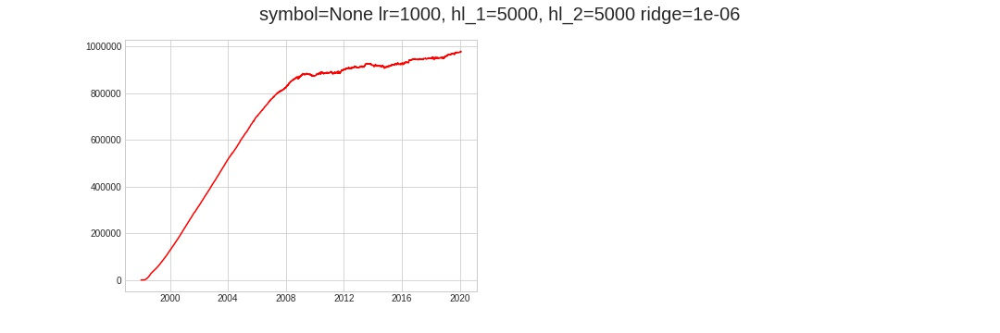

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
NaN,14218081,0.997534,-0.067026,1.440654,0.003719,0.000014,20.327917,24.135995,24.012147,0.995198,0.98836,0.980337,0.97949,883733400000000000,1580914800000000000


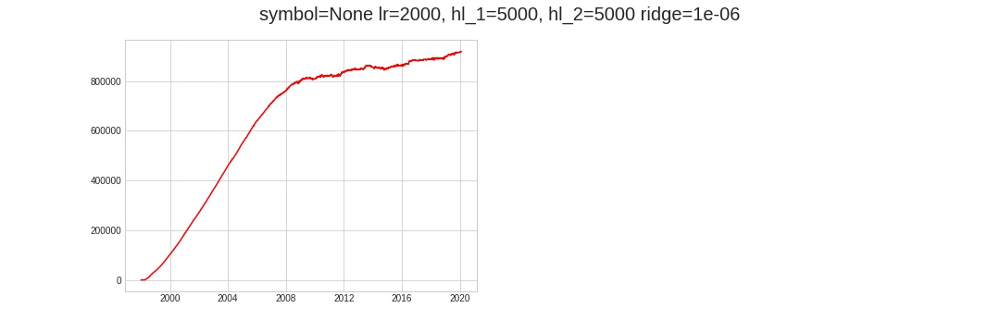

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
NaN,14218081,0.997534,-0.060959,1.562718,0.00353,0.000012,20.146969,26.411514,26.476957,0.995432,0.989458,0.982242,0.981266,883733400000000000,1580914800000000000


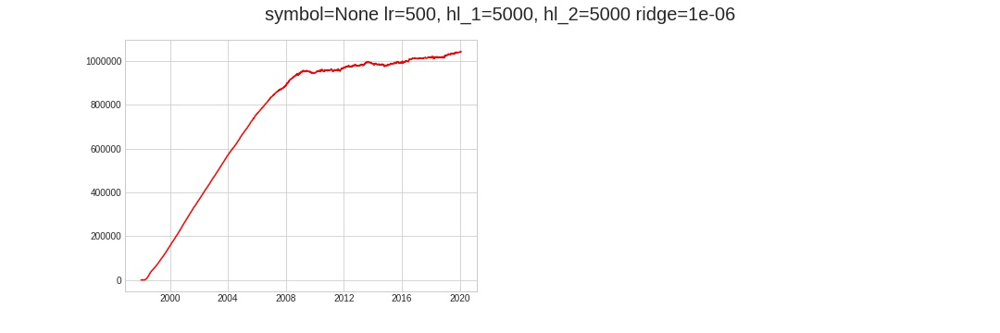

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
NaN,14218081,0.997534,-0.065908,1.015239,0.002514,0.000006,17.662222,16.835939,17.111565,0.994013,0.986094,0.977034,0.975905,883733400000000000,1580914800000000000


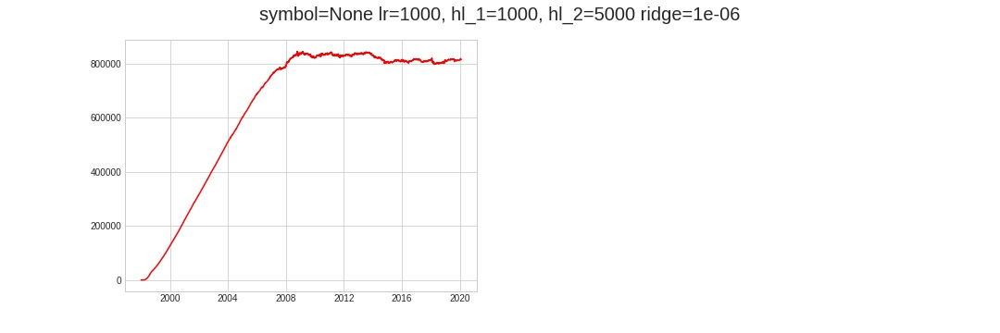

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
NaN,14218081,0.997534,-0.06961,1.005714,0.002584,0.000007,17.905058,16.722102,16.993956,0.99395,0.985442,0.975929,0.974858,883733400000000000,1580914800000000000


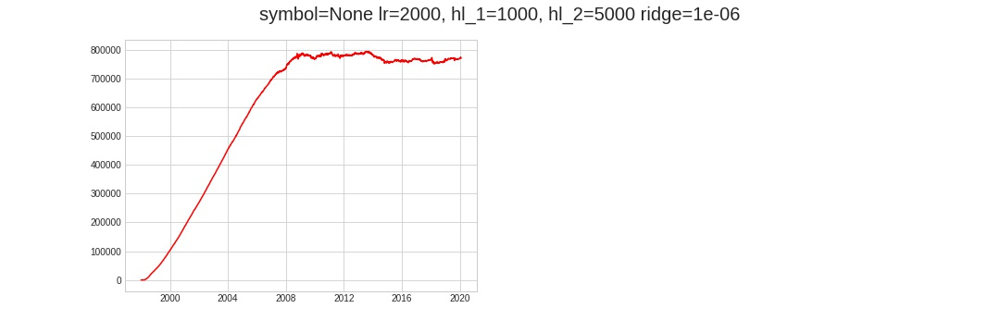

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
NaN,14218081,0.997534,-0.062373,1.045925,0.002561,0.000007,17.688484,17.340899,17.660027,0.994192,0.986851,0.978213,0.977009,883733400000000000,1580914800000000000


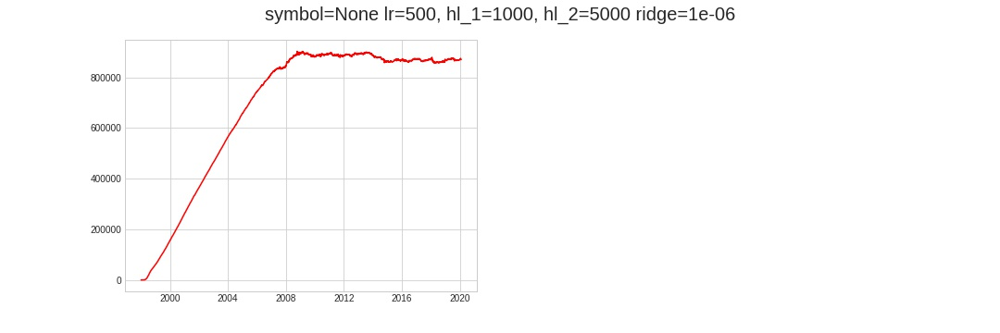

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
NaN,14218081,0.997367,-0.0651,1.408162,0.003735,0.000014,20.390528,23.750471,23.861982,0.994724,0.987404,0.980937,0.980043,883733400000000000,1580914800000000000


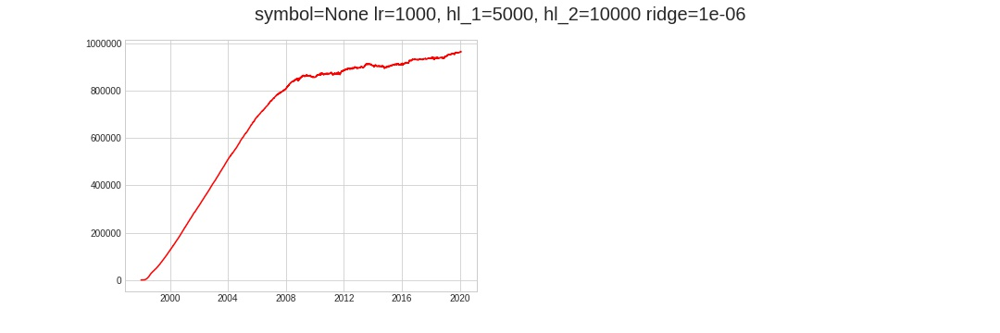

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
NaN,14218081,0.997367,-0.068308,1.37863,0.003814,0.000015,20.644009,23.130623,23.095068,0.99471,0.986985,0.980035,0.979131,883733400000000000,1580914800000000000


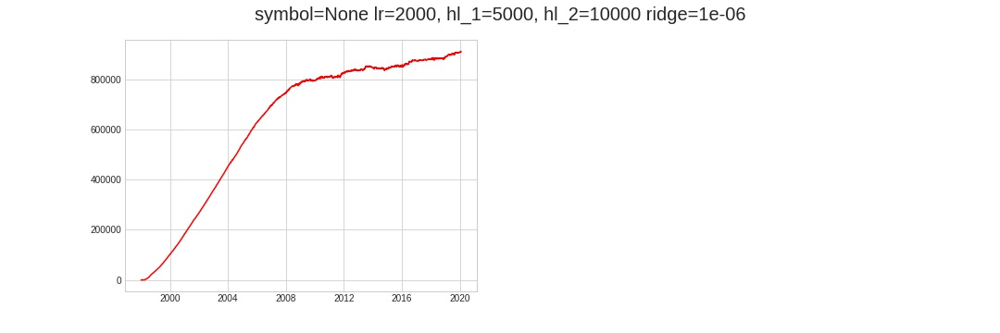

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
NaN,14218081,0.997367,-0.061959,1.464733,0.003588,0.000013,20.288715,24.789824,24.935778,0.994947,0.988253,0.982313,0.981281,883733400000000000,1580914800000000000


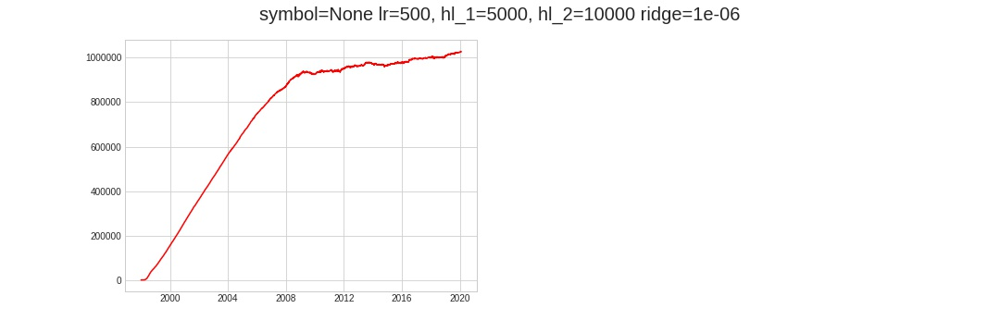

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
NaN,14218081,0.997367,-0.067063,0.955294,0.002607,0.000007,17.946154,15.812146,16.095049,0.993349,0.984102,0.975734,0.974435,883733400000000000,1580914800000000000


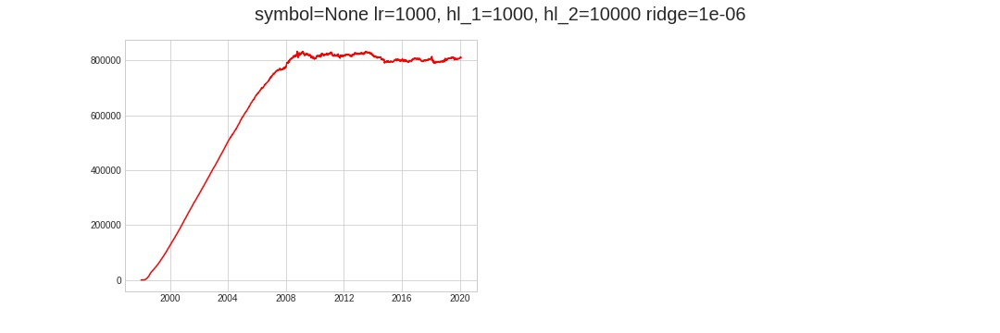

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
NaN,14218081,0.997367,-0.071169,0.954428,0.002805,0.000008,18.349356,15.835032,16.121797,0.993232,0.983197,0.974288,0.97307,883733400000000000,1580914800000000000


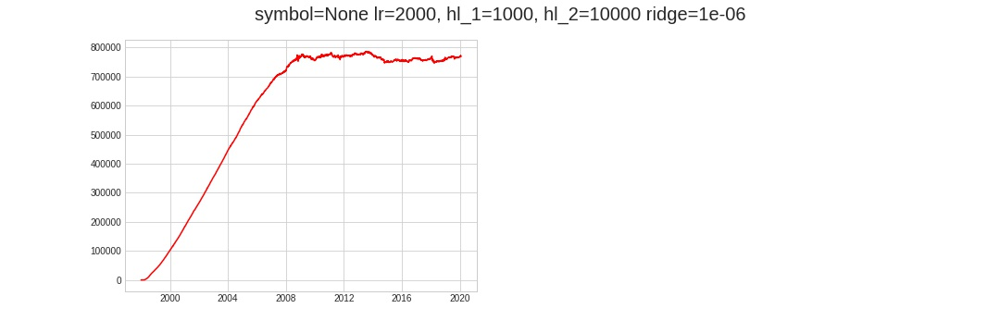

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
NaN,14218081,0.997367,-0.063247,0.976386,0.002572,0.000007,17.870234,16.150802,16.470455,0.993553,0.985011,0.97713,0.975746,883733400000000000,1580914800000000000


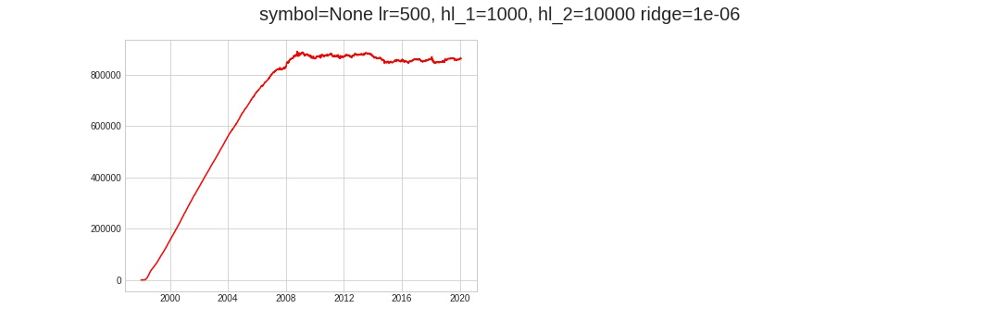

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,72173,0.990121,-0.02937,0.167434,0.011609,0.000135,3.105028,2.807616,2.767772,0.888869,0.631155,0.248929,0.189307,883733400000000000,1580914800000000000


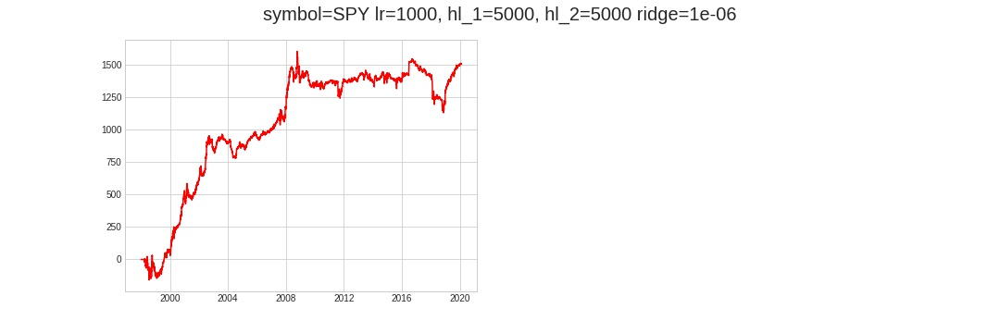

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,72173,0.990121,-0.02937,0.167433,0.011609,0.000135,3.104999,2.80759,2.767746,0.888869,0.631156,0.248931,0.189309,883733400000000000,1580914800000000000


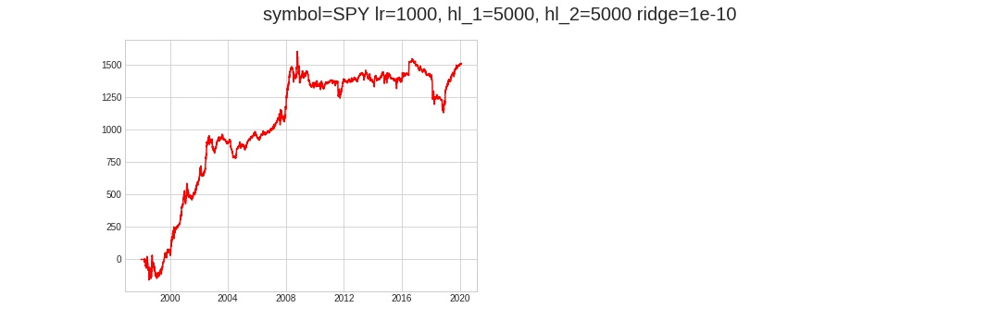

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,72173,0.990121,-0.030646,0.19911,0.013907,0.000193,3.718842,3.341942,3.328339,0.874981,0.598994,0.211718,0.153829,883733400000000000,1580914800000000000


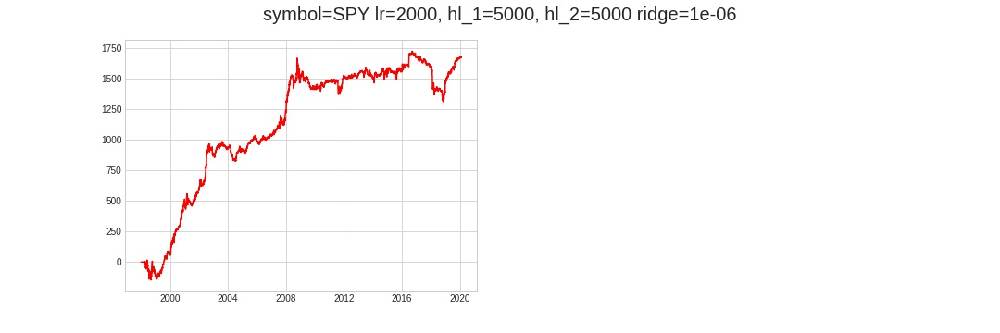

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,72173,0.990121,-0.030646,0.19911,0.013907,0.000193,3.718835,3.341936,3.328332,0.874981,0.598994,0.211718,0.153829,883733400000000000,1580914800000000000


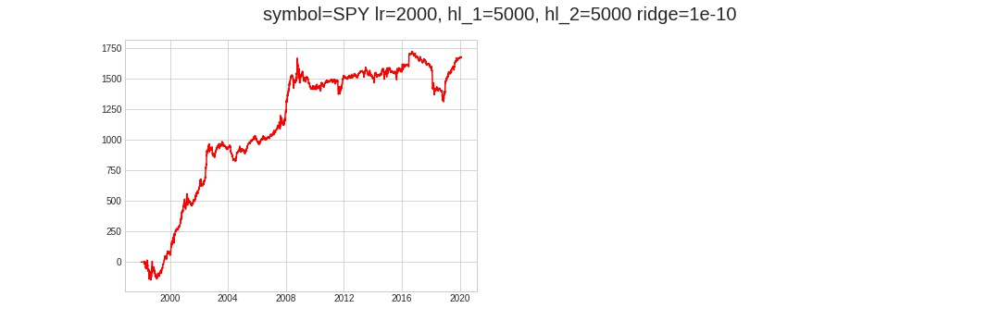

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,72173,0.990121,-0.02821,0.144087,0.009908,0.000098,2.650951,2.407887,2.35815,0.905785,0.667098,0.295495,0.233129,883733400000000000,1580914800000000000


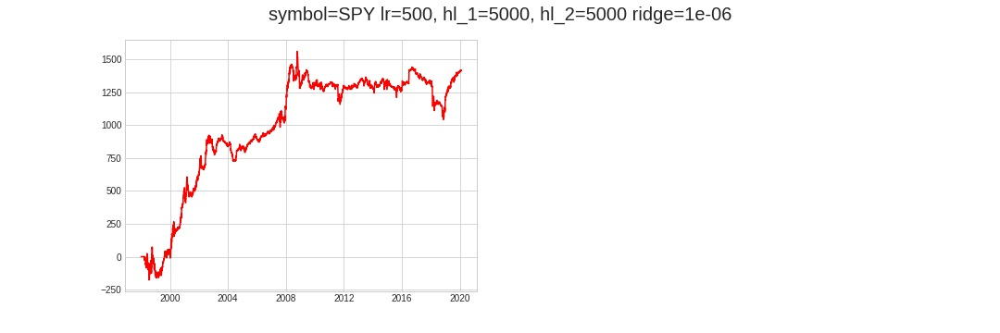

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceed

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,72173,0.990121,0.000755,0.131906,0.009063,0.000082,2.427095,2.235818,2.224362,0.863781,0.590098,0.185586,0.124524,883733400000000000,1580914800000000000


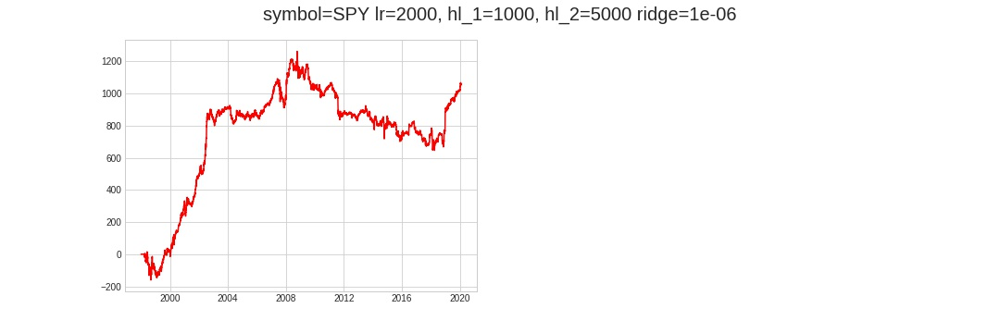

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,72173,0.990121,0.000755,0.131906,0.009069,0.000082,2.427098,2.23582,2.224364,0.863781,0.590099,0.185586,0.124524,883733400000000000,1580914800000000000


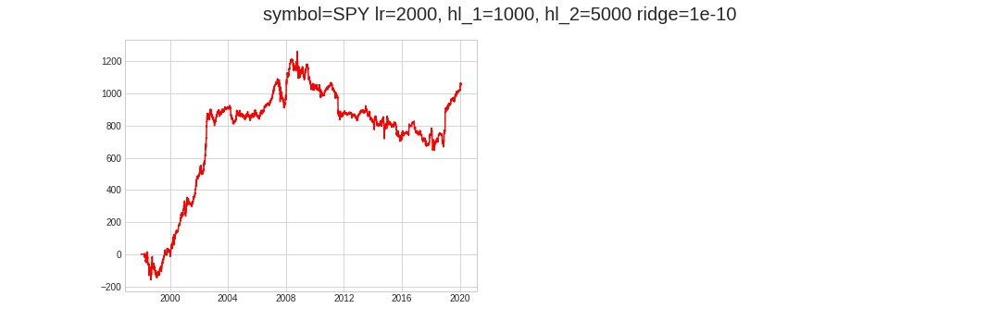

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceed

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,72173,0.990121,0.000051,0.067396,0.004548,0.000021,1.218119,1.133265,1.124583,0.877405,0.618381,0.212412,0.156963,883733400000000000,1580914800000000000


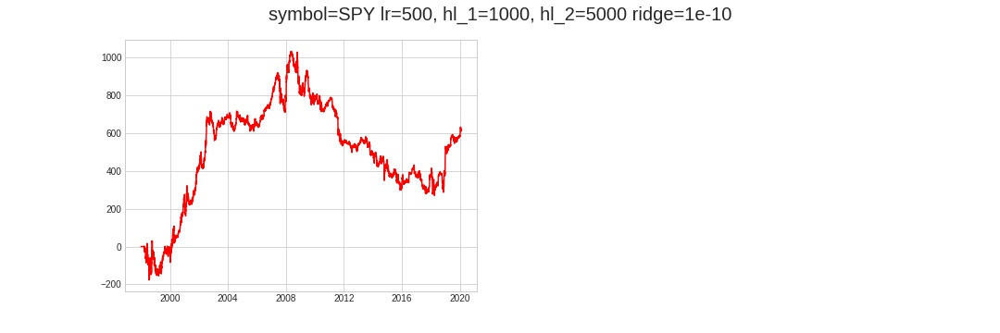

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,72173,0.996134,-0.021524,0.187863,0.013122,0.000172,3.520156,3.1341,3.078185,0.890831,0.642448,0.272132,0.21125,883733400000000000,1580914800000000000


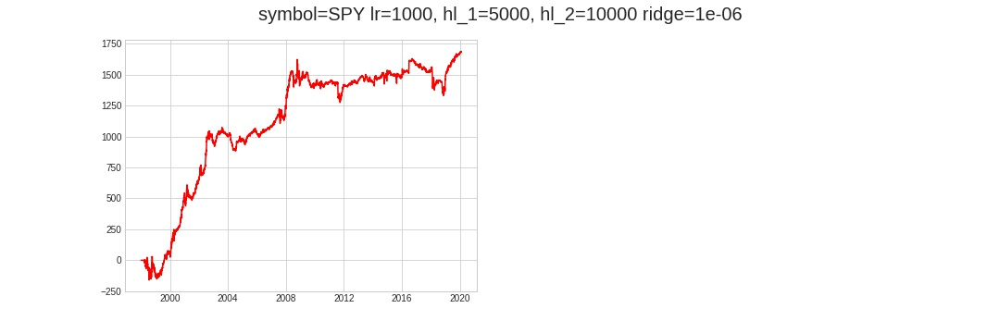

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,72173,0.996134,-0.021523,0.187863,0.013122,0.000172,3.520144,3.134089,3.078174,0.890831,0.642449,0.272134,0.211253,883733400000000000,1580914800000000000


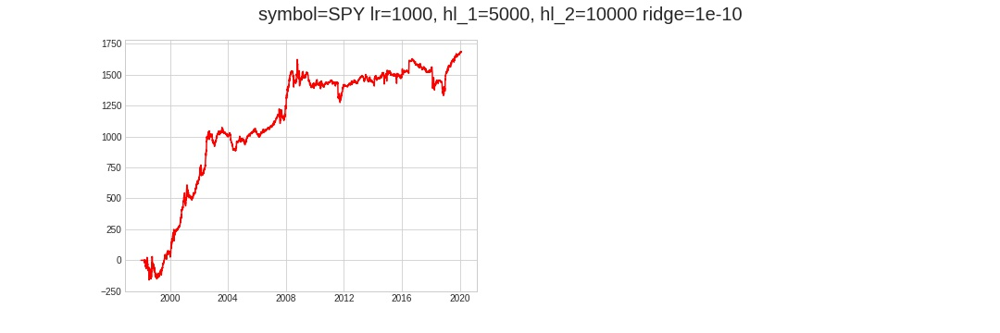

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,72173,0.996134,-0.027329,0.213828,0.015066,0.000227,4.04105,3.565523,3.532975,0.877511,0.608487,0.230998,0.170532,883733400000000000,1580914800000000000


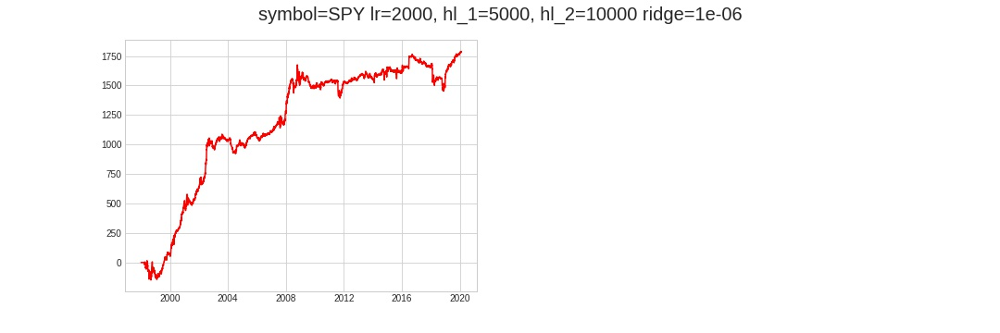

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceed

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,72173,0.996134,0.007719,0.089182,0.006064,0.000037,1.629435,1.504505,1.498922,0.88529,0.638815,0.255162,0.194067,883733400000000000,1580914800000000000


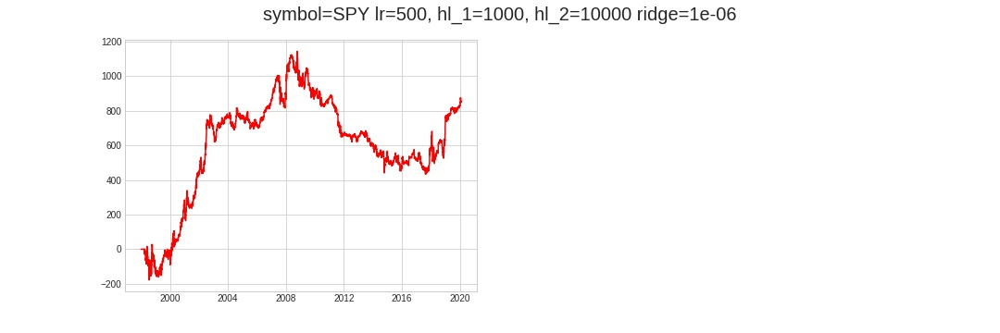

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceed

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
SPY,72173,0.996134,0.007719,0.089182,0.006064,0.000037,1.629442,1.504512,1.498929,0.885291,0.638815,0.255163,0.194068,883733400000000000,1580914800000000000


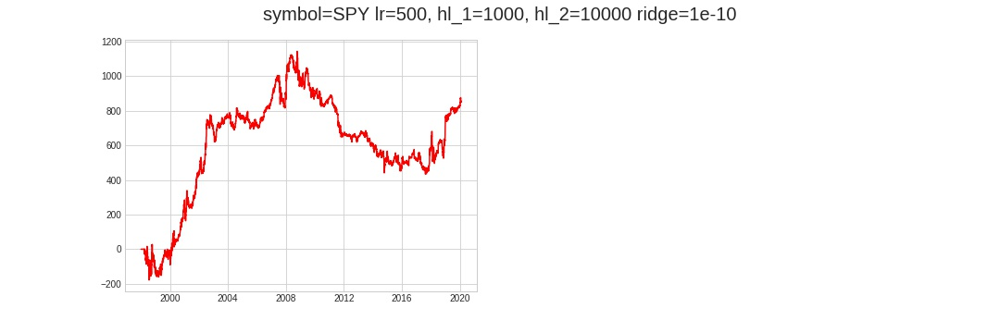

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceed

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
XLF,72173,0.967689,-0.070524,0.069871,0.003989,0.000016,1.048273,1.180977,1.16936,0.986914,0.923645,0.750655,0.721968,883733400000000000,1580914800000000000


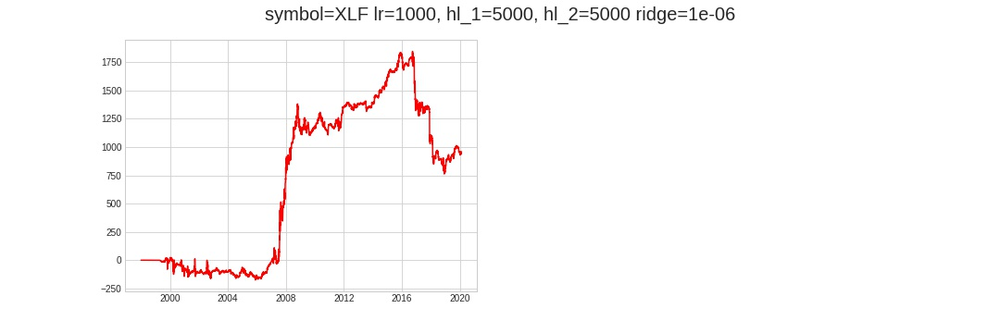

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceed

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
XLF,72173,0.967689,-0.070523,0.069871,0.003974,0.000016,1.04827,1.180977,1.16936,0.986914,0.923647,0.750659,0.721972,883733400000000000,1580914800000000000


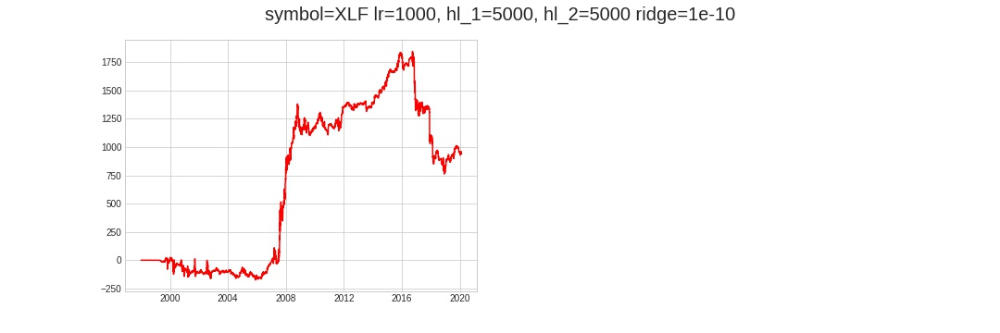

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceed

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceed

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
XLF,72173,0.967689,-0.082303,0.067427,0.004122,0.000017,1.084881,1.139982,1.133353,0.947386,0.818968,0.579119,0.542582,883733400000000000,1580914800000000000


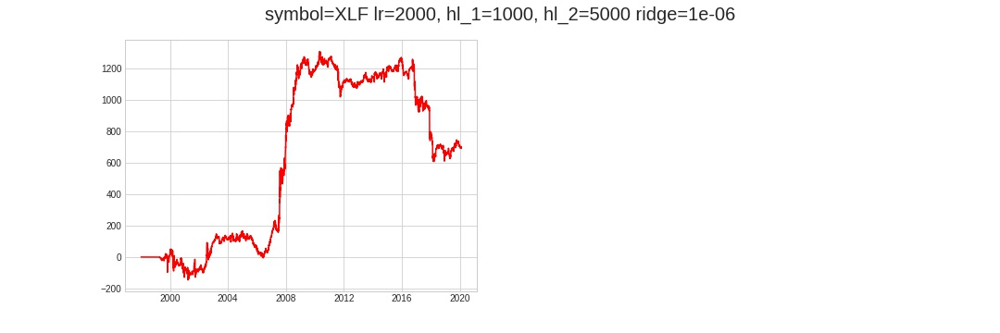

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceed

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
XLF,72173,0.967689,-0.078695,0.076705,0.004883,0.000024,1.287747,1.306668,1.297648,0.936236,0.771927,0.454344,0.419951,883733400000000000,1580914800000000000


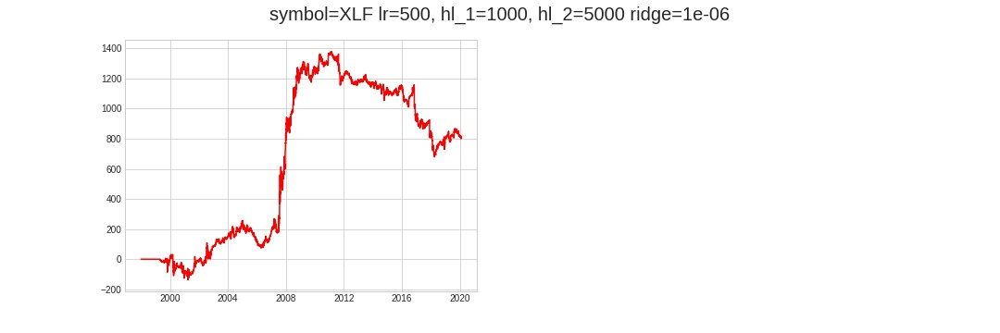

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceed

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceed

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
XLF,72173,0.984717,-0.070656,0.072285,0.004702,0.000022,1.250295,1.237576,1.232869,0.938412,0.784701,0.514067,0.47317,883733400000000000,1580914800000000000


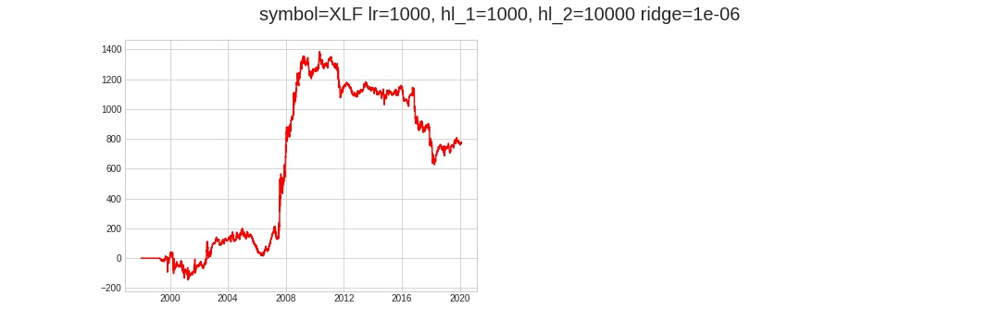

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceed

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.698322,0.079072,0.133314,0.009235,0.000085,2.072482,1.828721,1.856031,0.969908,0.849464,0.611346,0.570857,883733400000000000,1580914800000000000


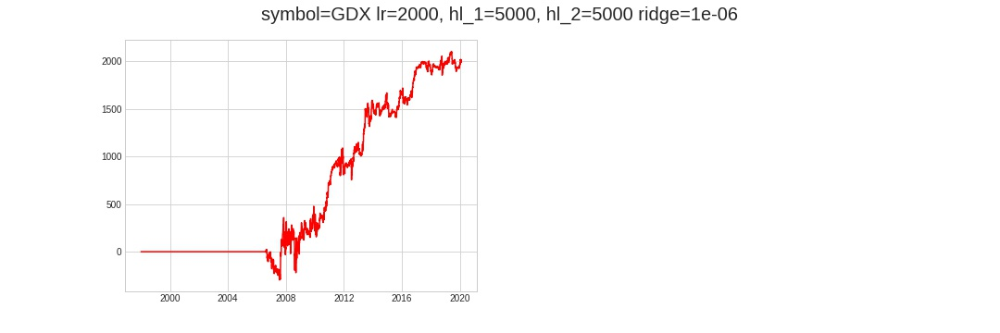

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.698322,0.079072,0.133314,0.009242,0.000085,2.072484,1.828723,1.856034,0.969908,0.849464,0.611347,0.570858,883733400000000000,1580914800000000000


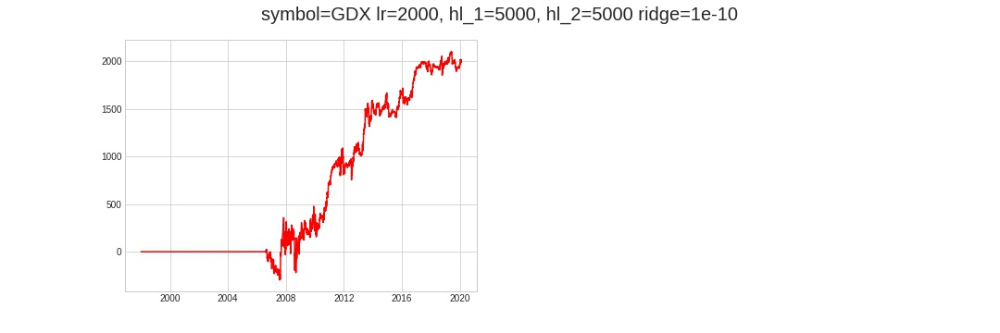

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.698322,0.064439,0.121121,0.008207,0.000067,1.842107,1.648276,1.699215,0.977169,0.877938,0.663694,0.619323,883733400000000000,1580914800000000000


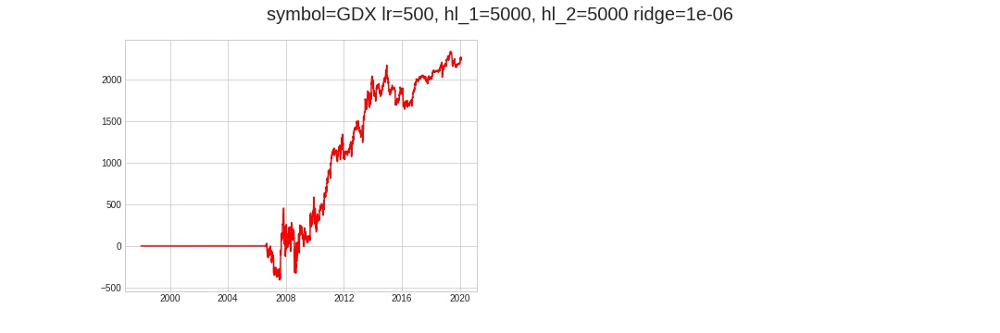

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.698322,0.064438,0.12112,0.008211,0.000067,1.842094,1.648265,1.699203,0.977169,0.87794,0.663697,0.619326,883733400000000000,1580914800000000000


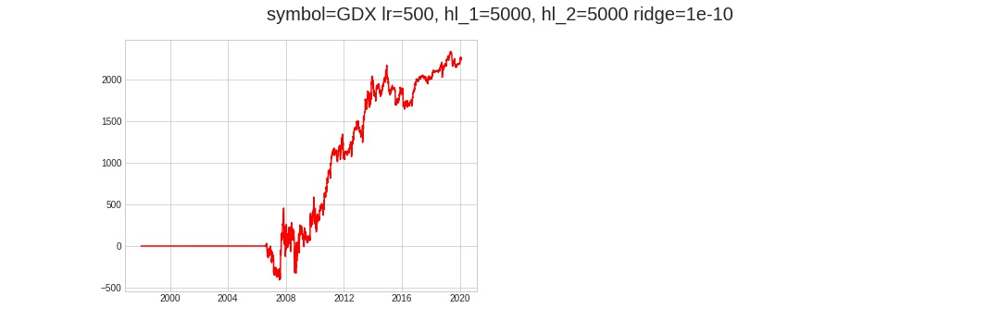

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.698322,0.085056,0.140455,0.009671,0.000094,2.171149,1.909355,1.952552,0.95814,0.824301,0.579007,0.534309,883733400000000000,1580914800000000000


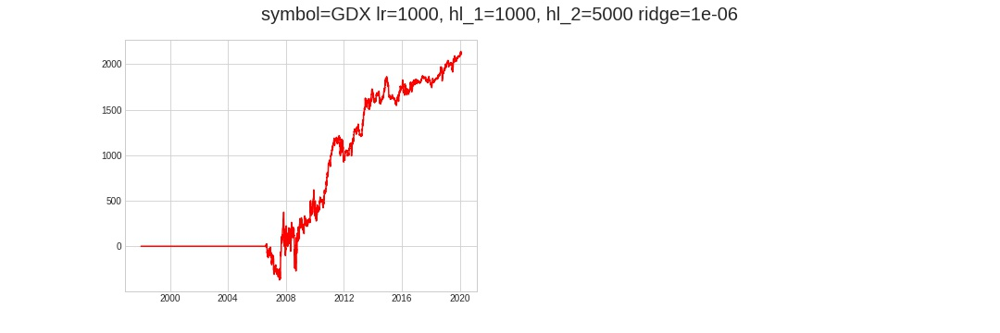

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.698322,0.085056,0.140454,0.009671,0.000094,2.171129,1.909339,1.952536,0.958141,0.824303,0.579009,0.534311,883733400000000000,1580914800000000000


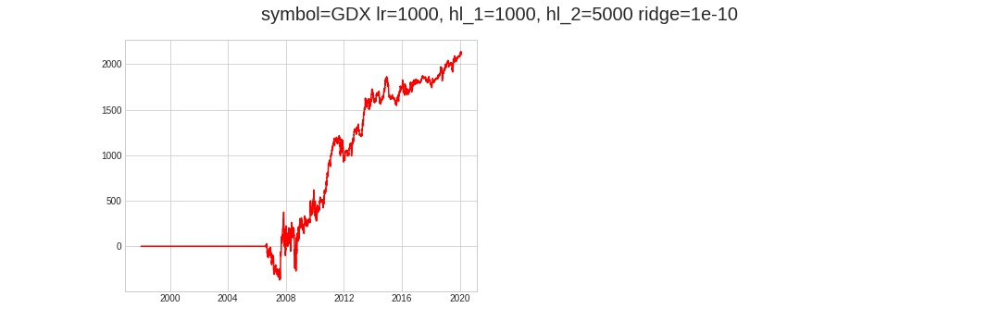

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.698322,0.096191,0.152399,0.010642,0.000113,2.38875,2.076283,2.114026,0.947046,0.79064,0.528748,0.483788,883733400000000000,1580914800000000000


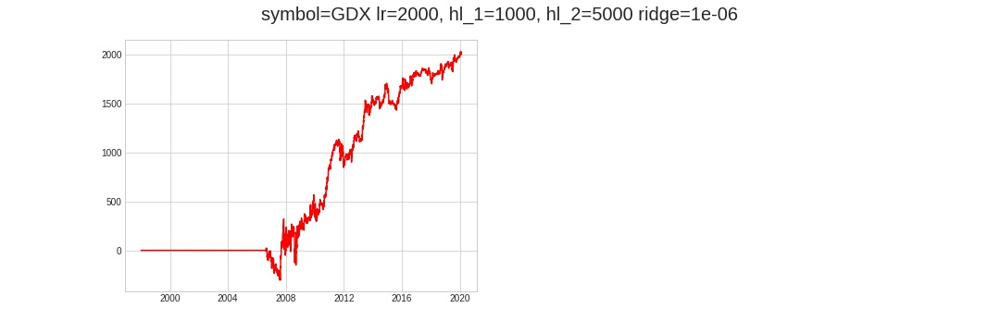

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.698322,0.09619,0.152399,0.010642,0.000113,2.388748,2.076281,2.114025,0.947046,0.790641,0.528749,0.48379,883733400000000000,1580914800000000000


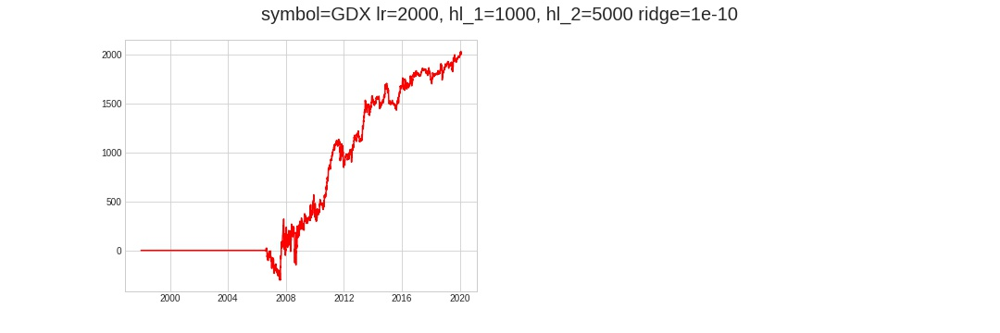

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.698322,0.076997,0.133438,0.00906,0.000082,2.032379,1.812992,1.875356,0.964626,0.844211,0.611527,0.566956,883733400000000000,1580914800000000000


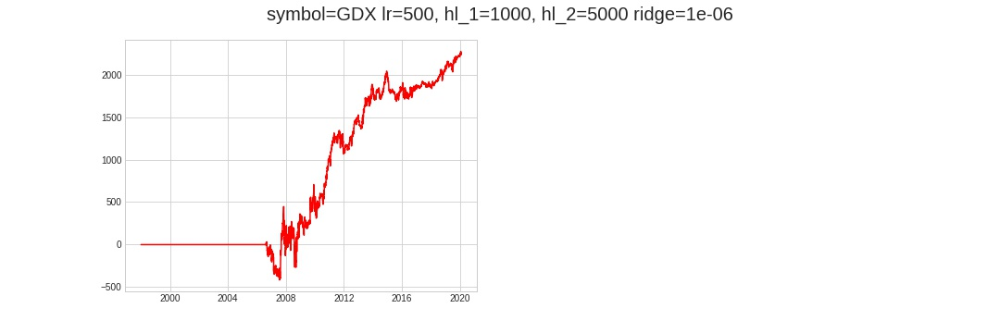

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.698322,0.076997,0.133437,0.00906,0.000082,2.032372,1.812987,1.87535,0.964627,0.844212,0.611529,0.566957,883733400000000000,1580914800000000000


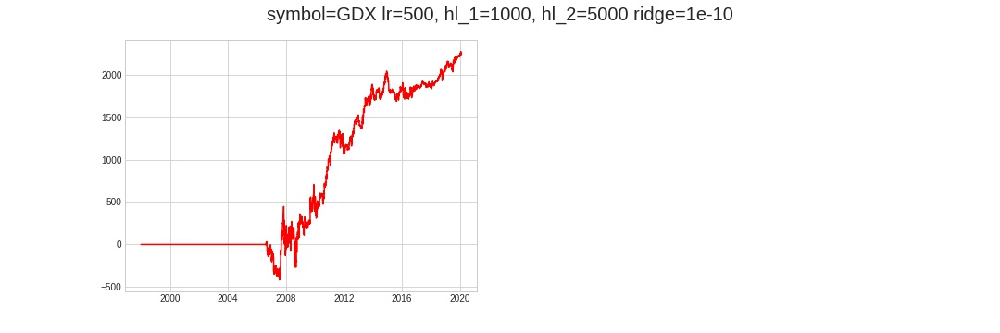

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.881299,0.066667,0.106495,0.008218,0.000068,2.07062,1.641995,1.674588,0.976809,0.87833,0.659869,0.619067,883733400000000000,1580914800000000000


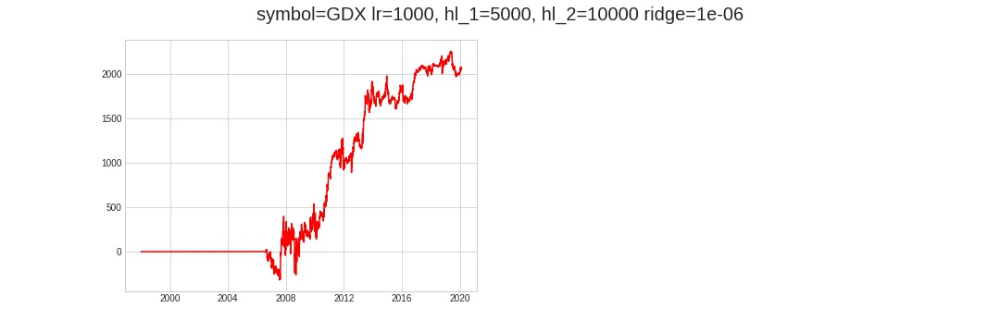

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.881299,0.066666,0.106494,0.008218,0.000068,2.070612,1.64199,1.674582,0.976809,0.878331,0.659871,0.619069,883733400000000000,1580914800000000000


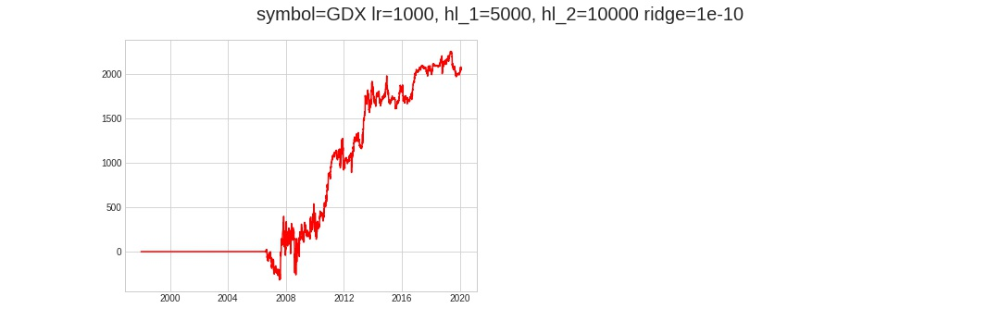

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.881299,0.077983,0.10718,0.008387,0.00007,2.111053,1.660771,1.689371,0.970591,0.853881,0.622913,0.582887,883733400000000000,1580914800000000000


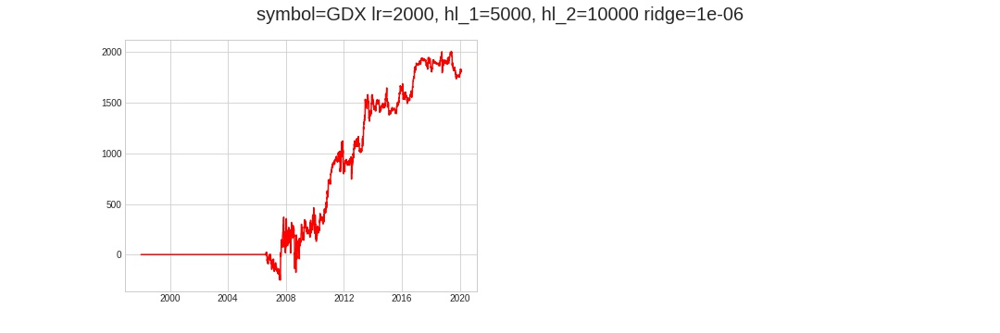

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.881299,0.077984,0.107179,0.008387,0.00007,2.111032,1.660754,1.689354,0.970591,0.853881,0.622913,0.582887,883733400000000000,1580914800000000000


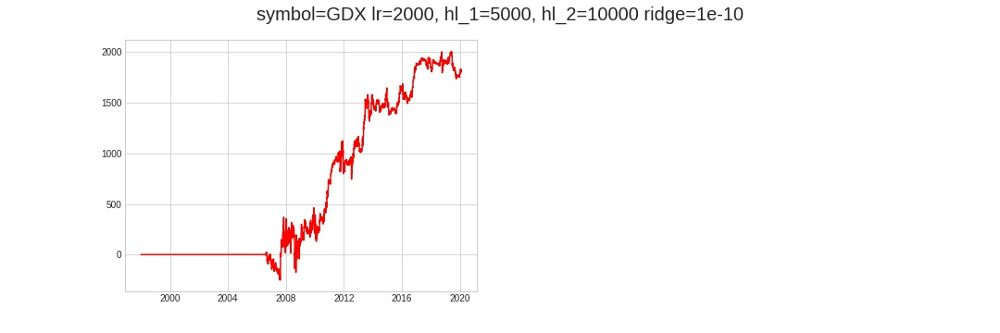

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.881299,0.061172,0.107872,0.00825,0.000068,2.076465,1.659101,1.70876,0.97968,0.890622,0.684664,0.641507,883733400000000000,1580914800000000000


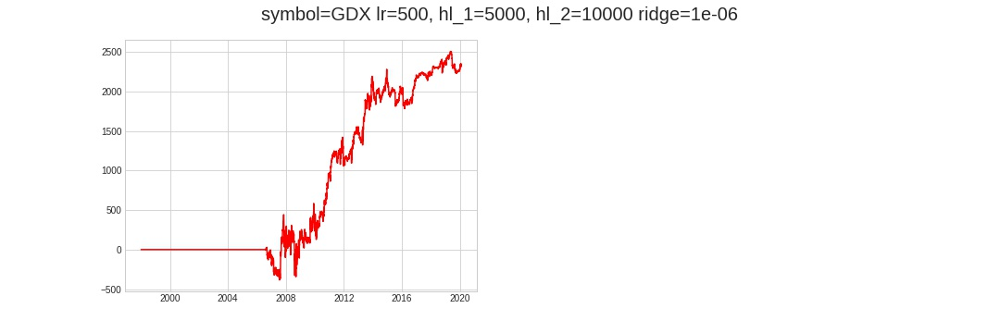

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.881299,0.061171,0.107871,0.00825,0.000068,2.076432,1.659075,1.708733,0.97968,0.890623,0.684667,0.641509,883733400000000000,1580914800000000000


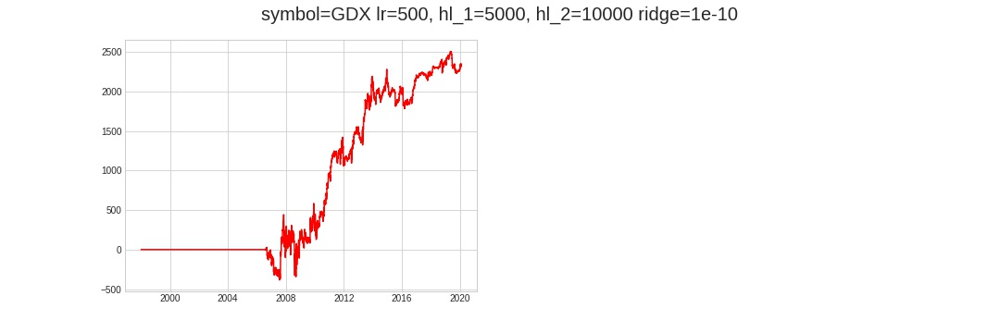

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.881299,0.082153,0.130795,0.010172,0.000103,2.564331,2.006653,2.048742,0.956747,0.823747,0.581598,0.535957,883733400000000000,1580914800000000000


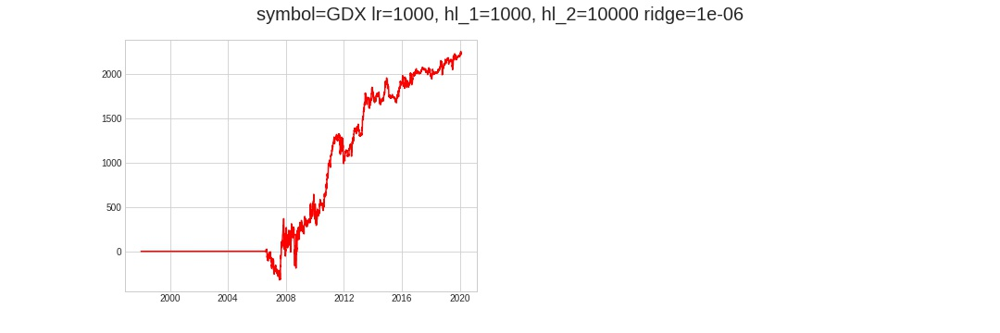

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.881299,0.082153,0.130795,0.010172,0.000103,2.564332,2.006654,2.048743,0.956747,0.823748,0.5816,0.535958,883733400000000000,1580914800000000000


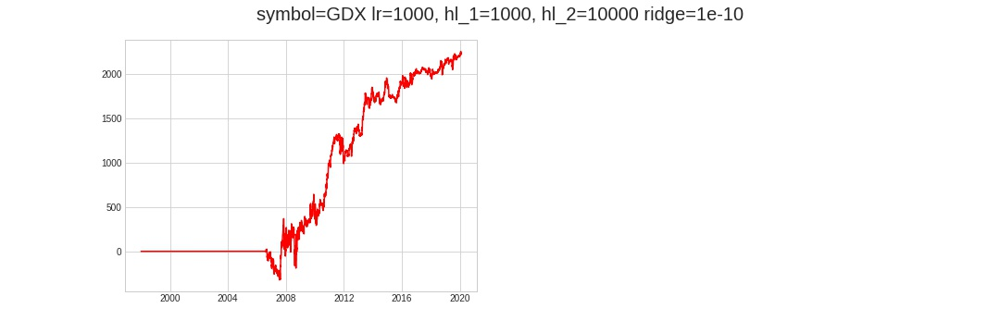

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.881299,0.092798,0.138083,0.010902,0.000119,2.747249,2.127404,2.16959,0.944242,0.784078,0.524842,0.477156,883733400000000000,1580914800000000000


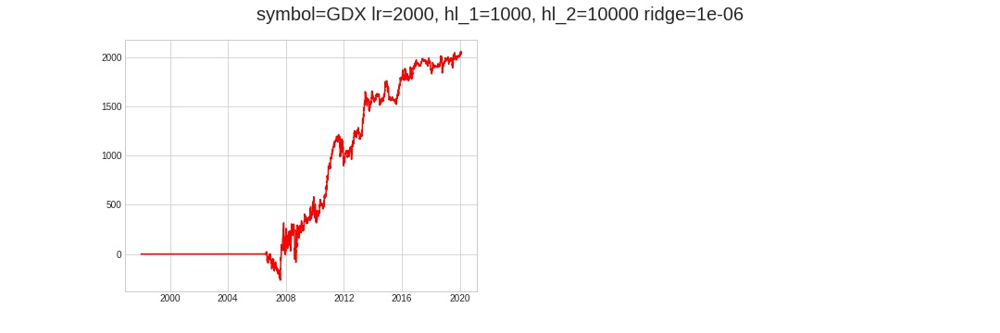

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.881299,0.092798,0.138082,0.010902,0.000119,2.747235,2.127393,2.169579,0.944242,0.784079,0.524843,0.477156,883733400000000000,1580914800000000000


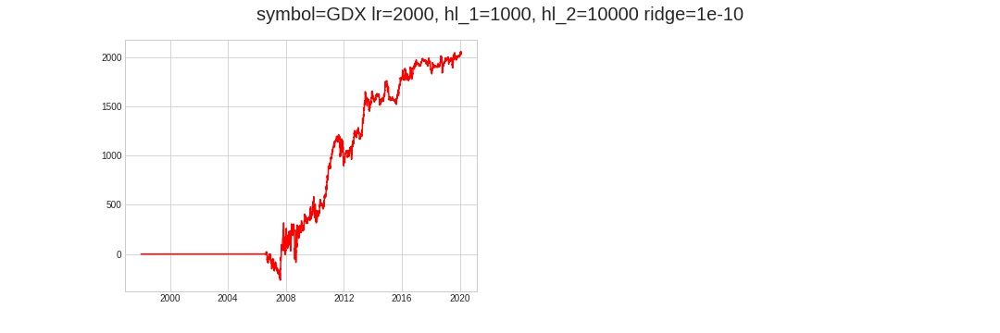

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.881299,0.074211,0.123858,0.009496,0.00009,2.393248,1.898158,1.954928,0.964855,0.848543,0.622433,0.577036,883733400000000000,1580914800000000000


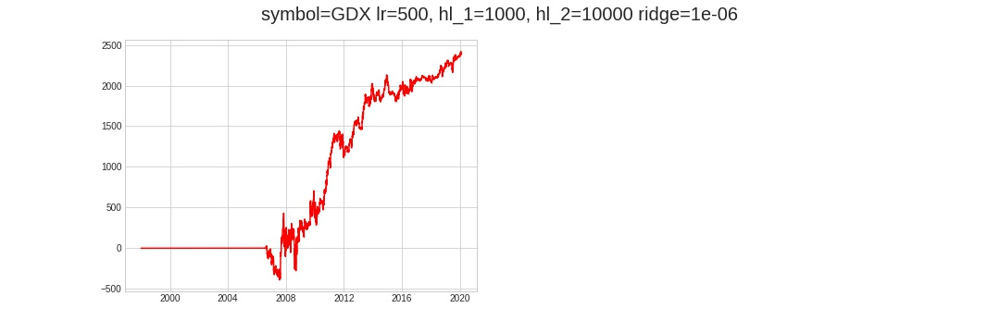

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
GDX,72173,0.881299,0.07421,0.123857,0.009496,0.00009,2.393236,1.898151,1.954919,0.964856,0.848545,0.622436,0.577039,883733400000000000,1580914800000000000


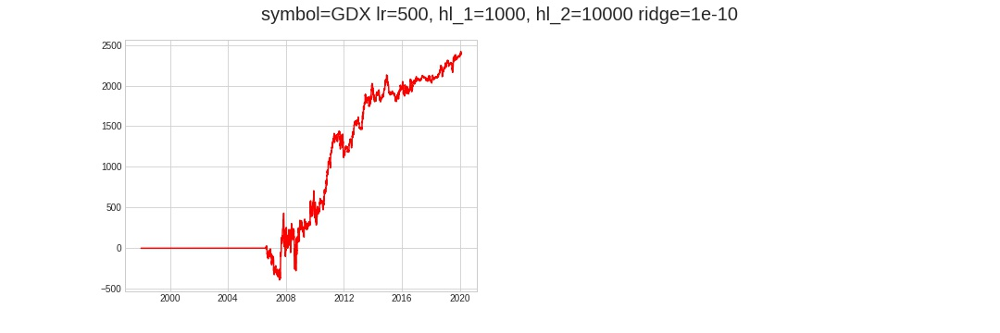

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
EEM,72173,0.807809,-0.073897,0.079228,0.005366,0.000029,1.297584,1.157384,1.19025,0.984059,0.917138,0.744503,0.696332,883733400000000000,1580914800000000000


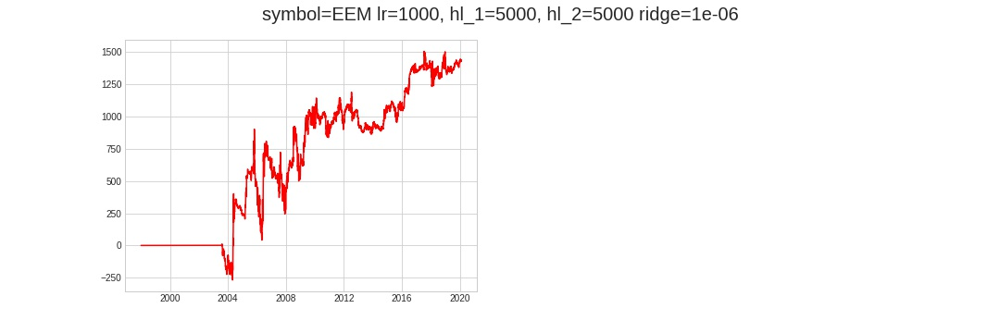

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
EEM,72173,0.807809,-0.073897,0.079227,0.005366,0.000029,1.297569,1.15737,1.190236,0.984059,0.917139,0.744503,0.696332,883733400000000000,1580914800000000000


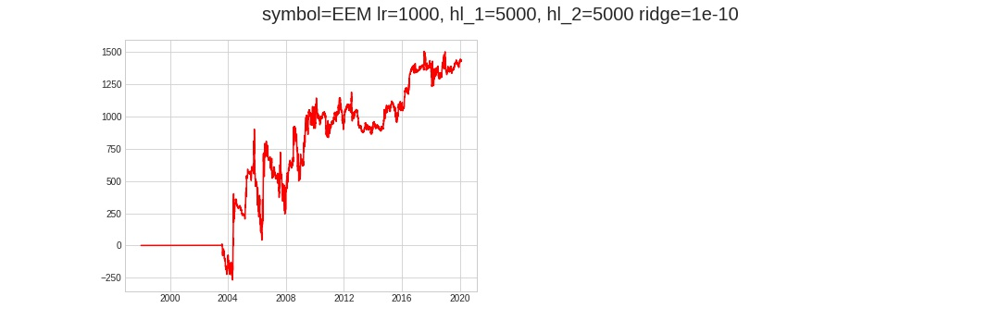

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
EEM,72173,0.807809,-0.080998,0.10262,0.007017,0.000049,1.693691,1.499756,1.552557,0.983071,0.916362,0.736866,0.684628,883733400000000000,1580914800000000000


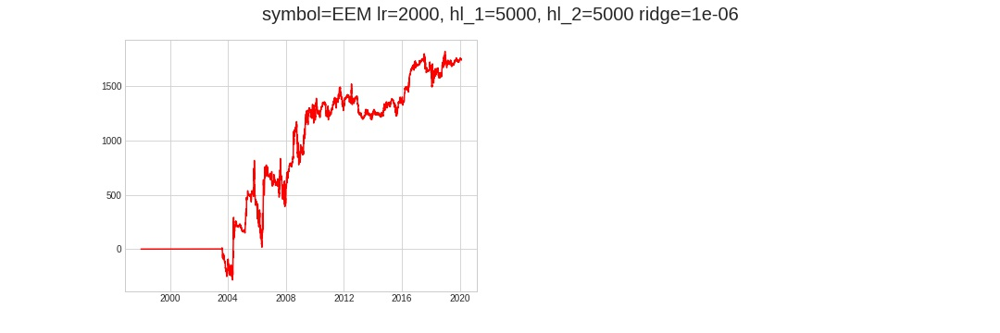

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
EEM,72173,0.807809,-0.080998,0.10262,0.007012,0.000049,1.693684,1.49975,1.552551,0.983071,0.916362,0.736866,0.684628,883733400000000000,1580914800000000000


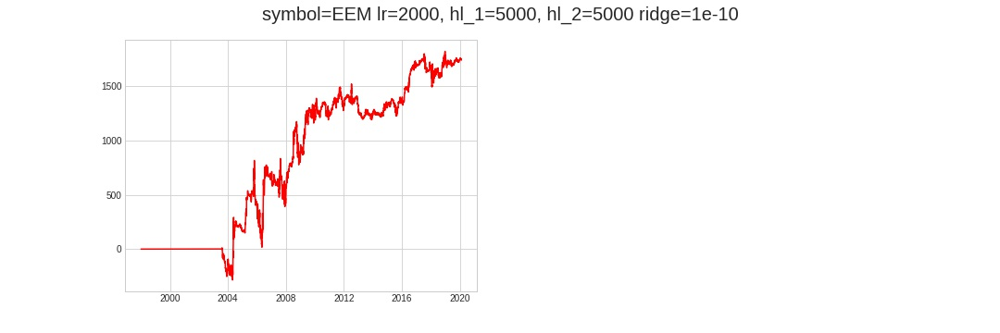

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
EEM,72173,0.807809,-0.066898,0.058099,0.003921,0.000015,0.94732,0.848598,0.867652,0.983994,0.912229,0.737303,0.693724,883733400000000000,1580914800000000000


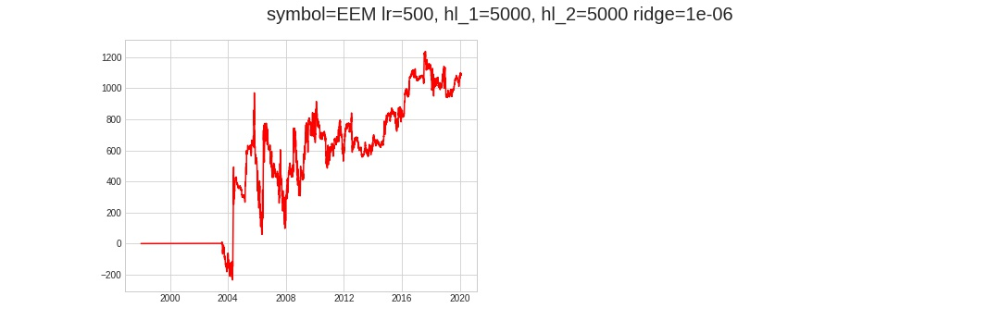

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
EEM,72173,0.807809,-0.066897,0.058098,0.003921,0.000015,0.947303,0.848582,0.867636,0.983994,0.91223,0.737304,0.693725,883733400000000000,1580914800000000000


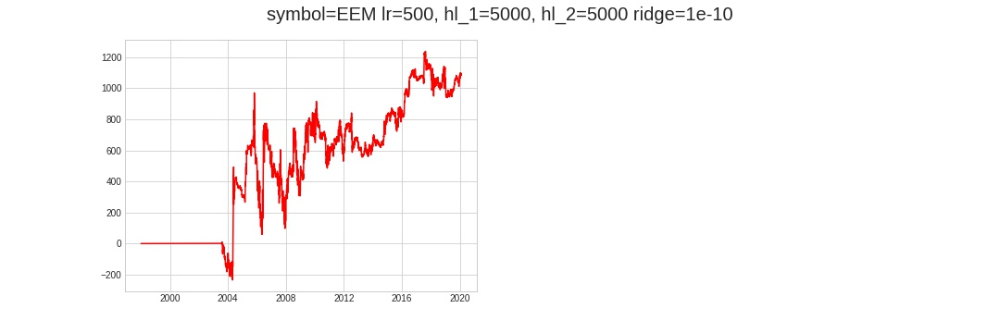

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceed

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
EEM,72173,0.807809,-0.073734,0.046136,0.003155,0.00001,0.764418,0.669803,0.681715,0.973535,0.883423,0.695635,0.656158,883733400000000000,1580914800000000000


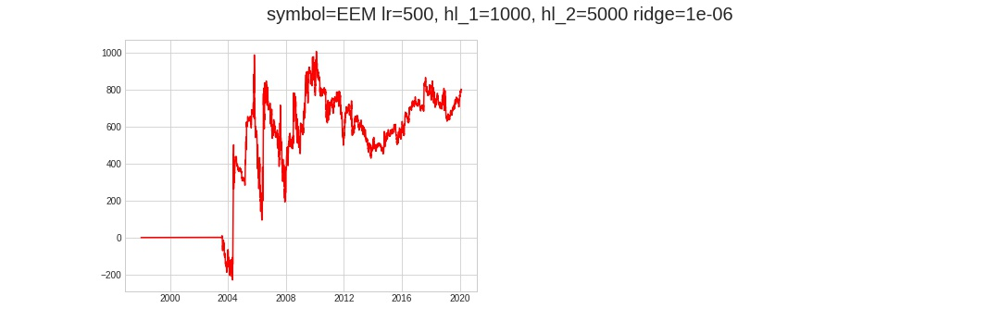

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceed

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
EEM,72173,0.836546,-0.072473,0.083415,0.005736,0.000033,1.40808,1.244853,1.288482,0.987914,0.931762,0.773514,0.726737,883733400000000000,1580914800000000000


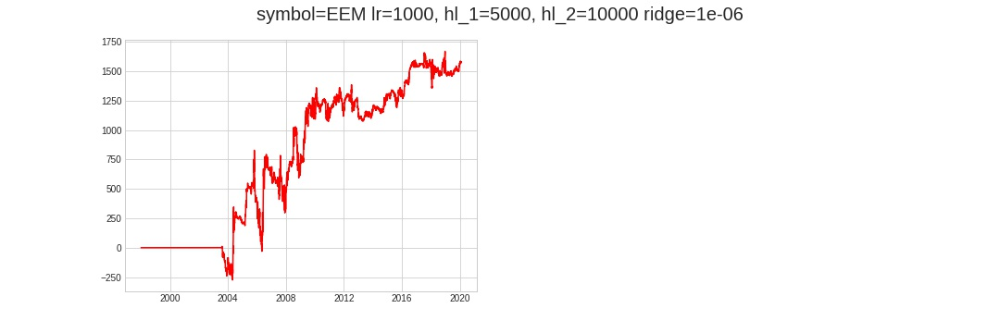

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
EEM,72173,0.836546,-0.072473,0.083414,0.005726,0.000033,1.408066,1.244842,1.28847,0.987914,0.931763,0.773515,0.726738,883733400000000000,1580914800000000000


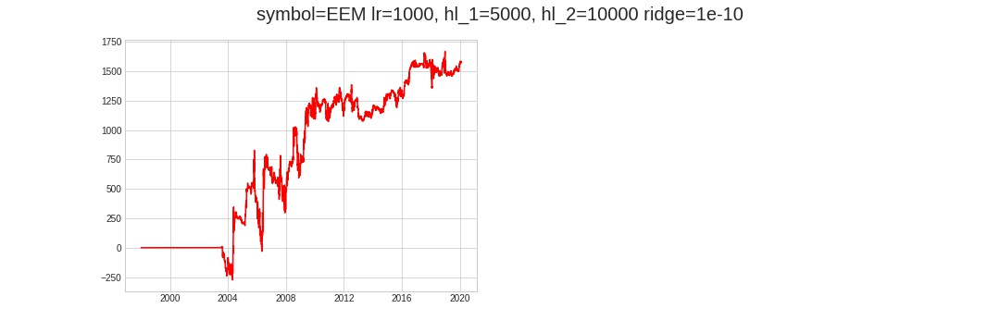

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceed

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
EEM,72173,0.836546,-0.075441,0.085609,0.00592,0.000035,1.45477,1.276504,1.317847,0.977947,0.90433,0.730281,0.684786,883733400000000000,1580914800000000000


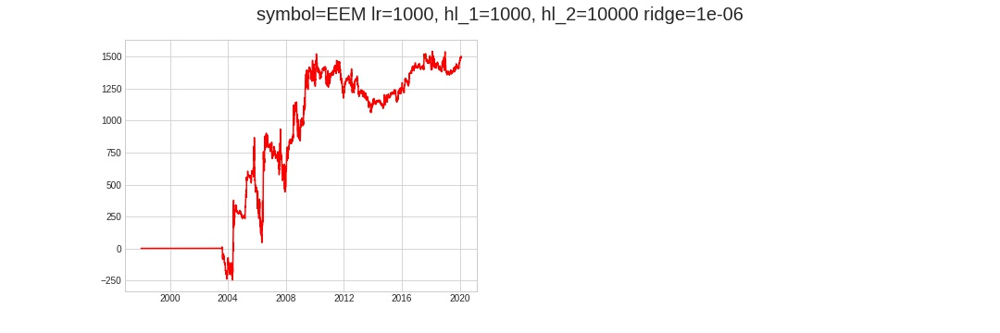

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceed

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
EEM,72173,0.836546,-0.085508,0.108924,0.007576,0.000057,1.863512,1.628461,1.688757,0.976785,0.901499,0.721048,0.671506,883733400000000000,1580914800000000000


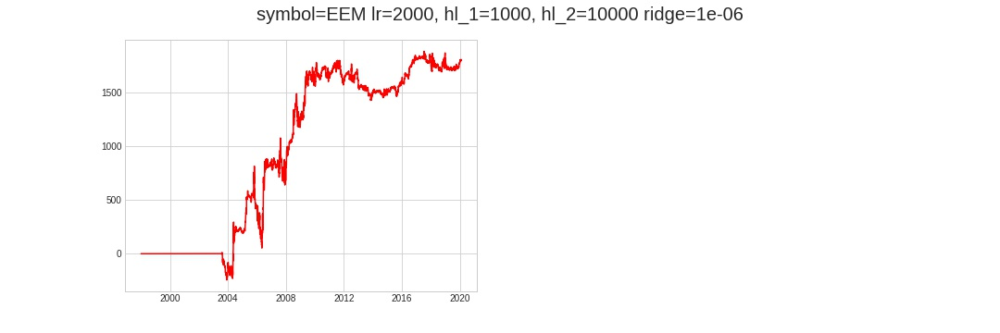

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceed

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,72173,0.929156,-0.123315,-0.178661,-0.013165,0.000173,-3.405294,-3.01818,-2.963998,0.953059,0.8384,0.685017,0.653626,883733400000000000,1580914800000000000


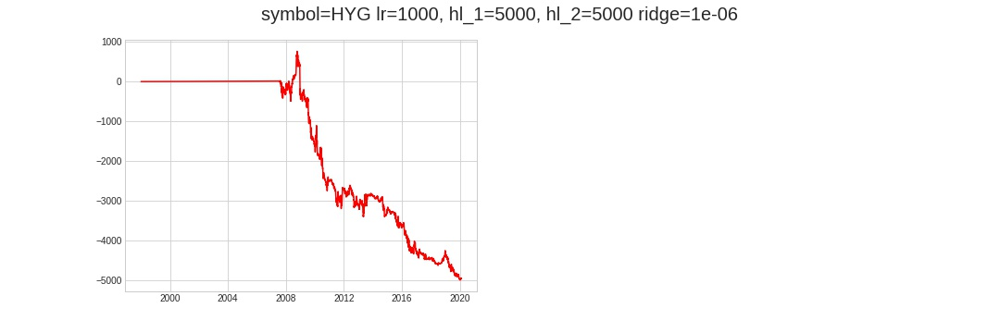

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceed

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,72173,0.740997,-0.128804,-0.201518,-0.01347,0.000181,-3.112651,-3.023125,-2.969526,0.960792,0.853813,0.696678,0.664882,883733400000000000,1580914800000000000


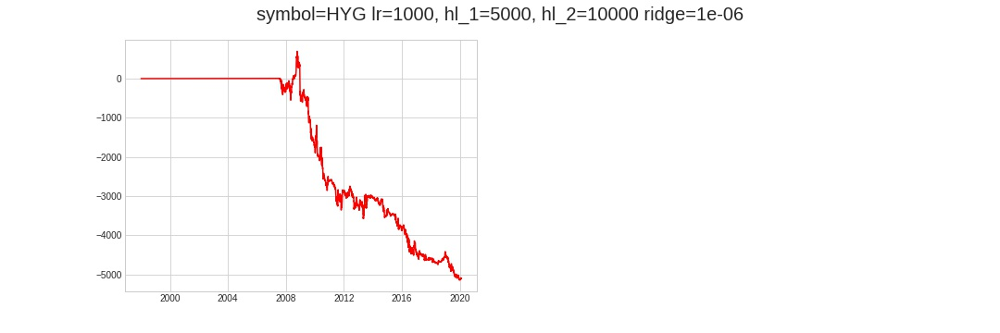

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,72173,0.740997,-0.128804,-0.201519,-0.01347,0.000181,-3.112663,-3.023135,-2.969537,0.960792,0.853813,0.696678,0.664881,883733400000000000,1580914800000000000


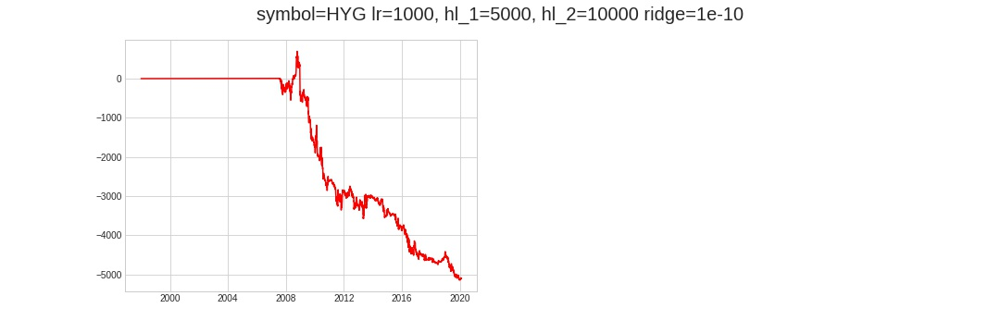

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,72173,0.740997,-0.14527,-0.197781,-0.013357,0.000178,-3.08684,-2.964483,-2.915078,0.96576,0.866178,0.708319,0.679028,883733400000000000,1580914800000000000


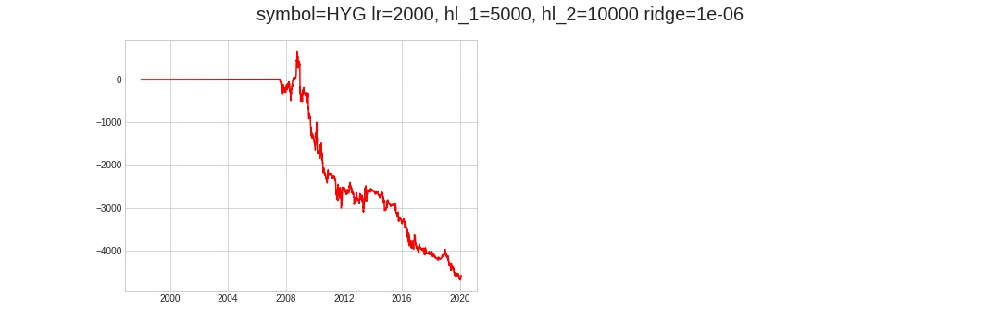

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,72173,0.740997,-0.14527,-0.197782,-0.013357,0.000178,-3.08686,-2.964501,-2.915095,0.96576,0.866178,0.708319,0.679028,883733400000000000,1580914800000000000


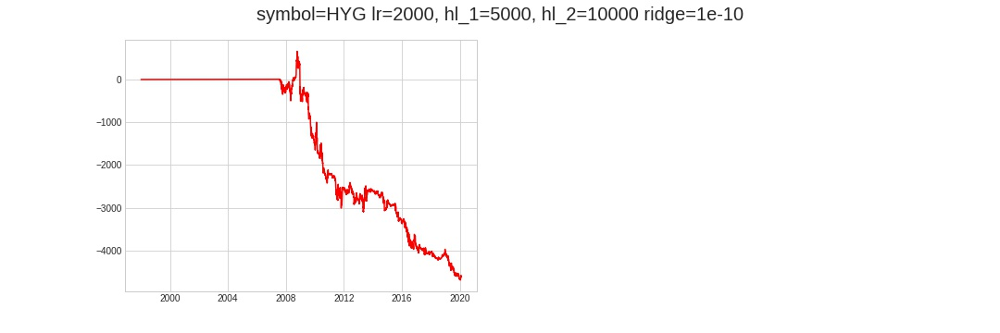

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,72173,0.740997,-0.113819,-0.196551,-0.012921,0.000167,-2.986126,-2.962631,-2.900672,0.952418,0.832017,0.669725,0.635267,883733400000000000,1580914800000000000


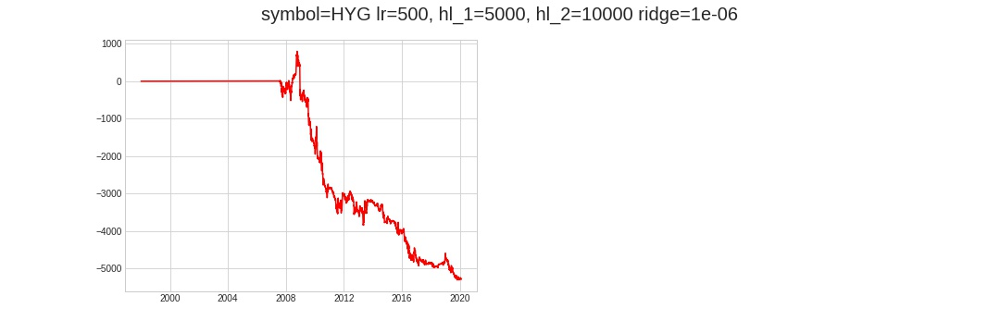

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,72173,0.740997,-0.11382,-0.196551,-0.012921,0.000167,-2.986133,-2.962642,-2.900683,0.952417,0.832017,0.669724,0.635267,883733400000000000,1580914800000000000


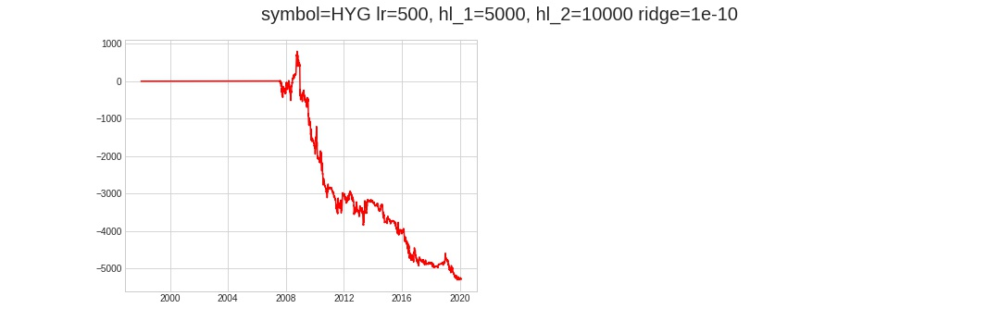

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,72173,0.740997,-0.128161,-0.194276,-0.013063,0.000171,-3.017483,-2.927636,-2.879353,0.958889,0.846835,0.675441,0.64366,883733400000000000,1580914800000000000


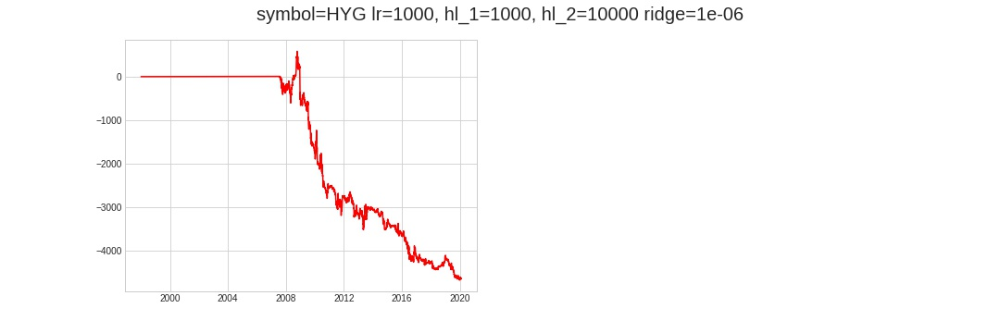

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,72173,0.740997,-0.128161,-0.194278,-0.013063,0.000171,-3.017511,-2.927663,-2.879379,0.958888,0.846835,0.675442,0.64366,883733400000000000,1580914800000000000


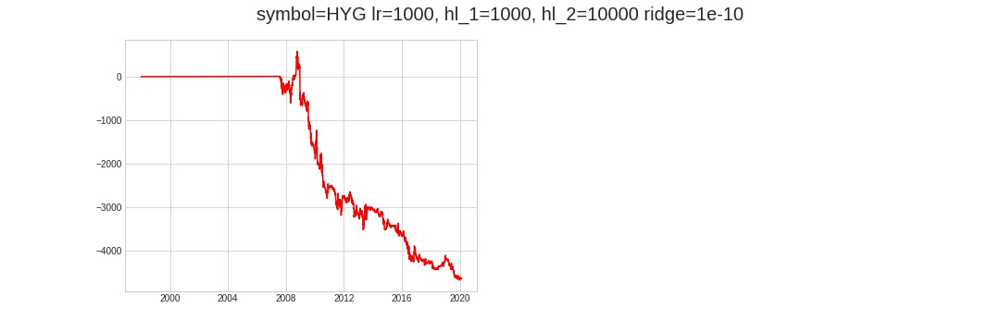

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,72173,0.740997,-0.148051,-0.193157,-0.013145,0.000173,-3.037689,-2.916253,-2.865663,0.960328,0.850371,0.671381,0.642934,883733400000000000,1580914800000000000


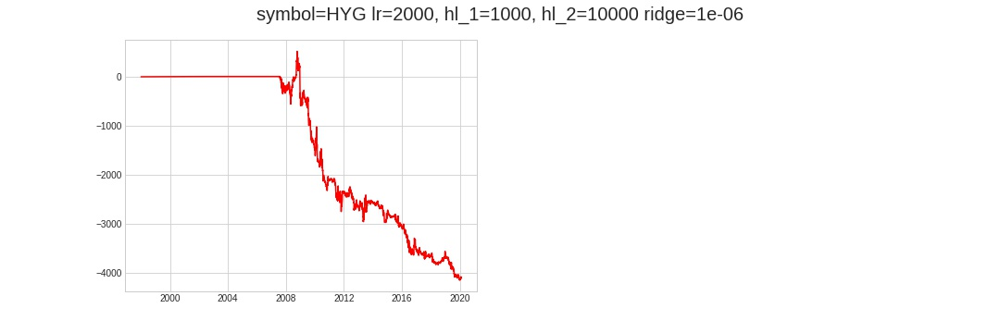

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,72173,0.740997,-0.148051,-0.193156,-0.013145,0.000173,-3.037675,-2.91624,-2.86565,0.960328,0.850371,0.671381,0.642933,883733400000000000,1580914800000000000


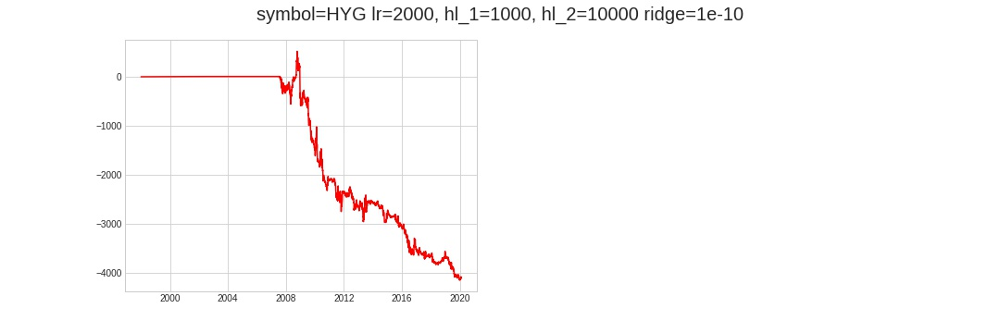

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,72173,0.740997,-0.111607,-0.186104,-0.012295,0.000151,-2.840203,-2.814217,-2.760366,0.952839,0.830869,0.657545,0.623268,883733400000000000,1580914800000000000


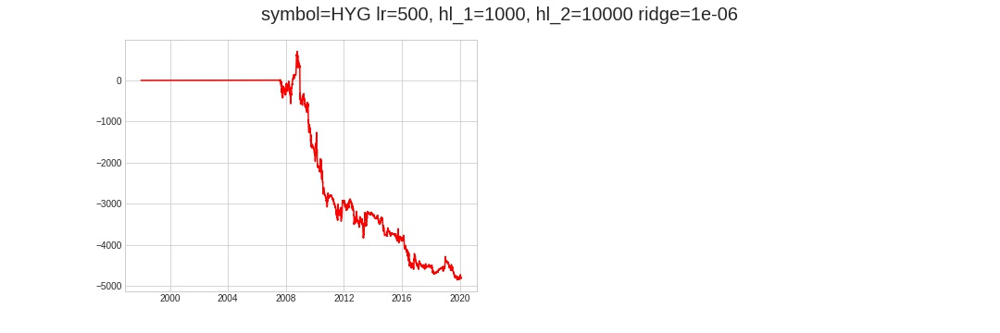

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
HYG,72173,0.740997,-0.111607,-0.186106,-0.012295,0.000151,-2.840213,-2.814232,-2.76038,0.952839,0.83087,0.657547,0.62327,883733400000000000,1580914800000000000


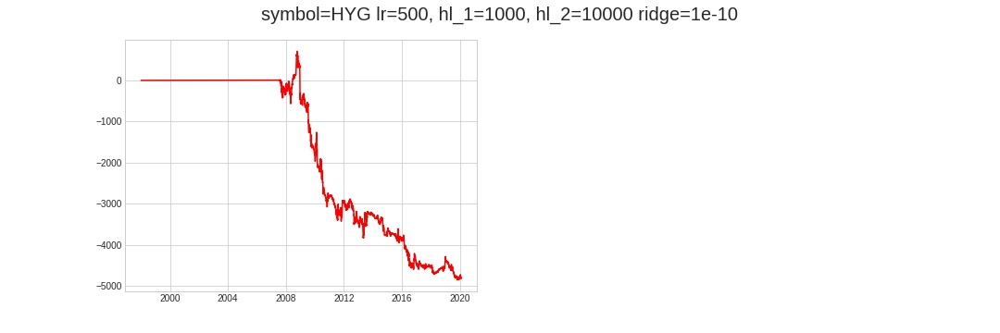

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
AGG,72173,0.933729,-0.237916,-0.053771,-0.003638,0.000013,-0.9562,-1.014499,-1.042183,0.957738,0.833076,0.620266,0.569888,883733400000000000,1580914800000000000


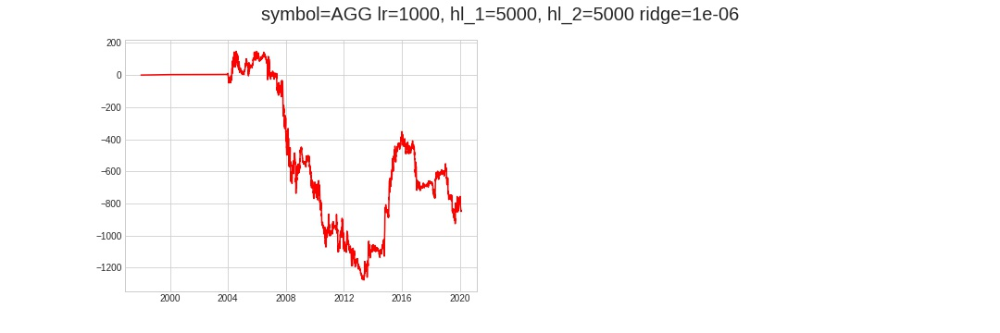

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )
/home/fj/cloud/code/madmax/experiment/logging.py:102: UserWarning: Logger.log_uri not set. Try running Config.start() ? Will not write to disk 
  warnings.warn( 'Logger.log_uri not set. Try running Config.start() ? Will not write to disk ' )


,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_10,DK_30,ac_1,ac_12,ac_72,ac_100,start,end
AGG,72173,0.933729,-0.237917,-0.053771,-0.003621,0.000013,-0.956203,-1.014504,-1.042187,0.957737,0.833076,0.620266,0.569887,883733400000000000,1580914800000000000


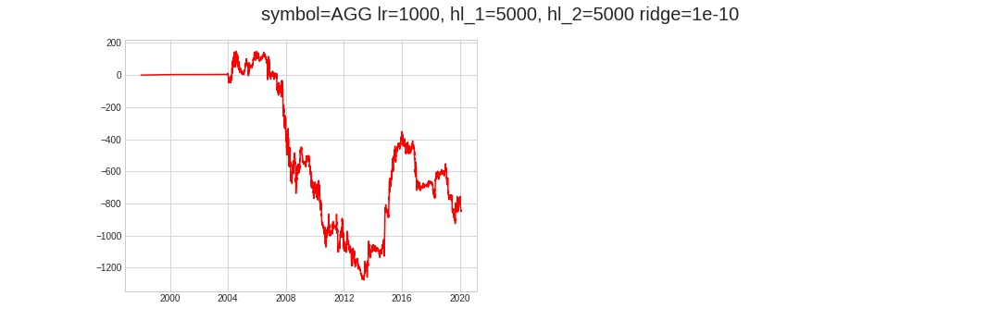

/home/fj/cloud/code/madmax/experiment/hpset.py:23: UserWarning: converting list features=['logrtn_lag_overnight', 'logrtn_lag_weekend', 'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day', 'log_open_30min_26.ew_sd', 'log_dollar_volume_30min_26.ew_sd', 'logrtn_lag_30min_26.ew_sd', 'logrtn_lag_1day_26.ew_sd', 'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd', 'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd', 'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean', 'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean', 'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean', 'cos_timeofday', 'sin_timeofday', 'cos_dayofwee

In [ ]:
# --- 30 min online model (fullsample)----
#####################################################################
%inline
hps = mx.HPSet()    
hps.symbol = 'SPY'
hps.features = (
    [ 'logrtn_lag_overnight', 'logrtn_lag_weekend',
      'logrtn_lag_30min', 'logrtn_lag_1hr', 'logrtn_lag_1day',
     # 'logrtn_lag_intraday', 'logrtn_lag_intraweek',    'logrtn_lag_intramonth', 
     #'log_dollar_volume_30min', 'log_open_30min', 'log_dollar_volume_intraday', 'log_dollar_volume_intraweek',
     'log_open_30min_26.ew_sd',  'log_dollar_volume_30min_26.ew_sd',  'logrtn_lag_30min_26.ew_sd',  'logrtn_lag_1day_26.ew_sd',
     'log_open_30min_130.ew_sd', 'log_dollar_volume_30min_130.ew_sd', 'logrtn_lag_30min_130.ew_sd', 'logrtn_lag_1day_130.ew_sd',
     'log_open_30min_390.ew_sd', 'log_dollar_volume_30min_390.ew_sd', 'logrtn_lag_30min_390.ew_sd', 'logrtn_lag_1day_390.ew_sd',
     'log_open_30min_26.ew_mean', 'log_dollar_volume_30min_26.ew_mean', 'logrtn_lag_30min_26.ew_mean', 'logrtn_lag_1day_26.ew_mean',
     'log_open_30min_130.ew_mean', 'log_dollar_volume_30min_130.ew_mean', 'logrtn_lag_30min_130.ew_mean', 'logrtn_lag_1day_130.ew_mean',
     'log_open_30min_390.ew_mean', 'log_dollar_volume_30min_390.ew_mean', 'logrtn_lag_30min_390.ew_mean', 'logrtn_lag_1day_390.ew_mean']
    + ['cos_timeofday', 'sin_timeofday', 'cos_dayofweek', 'sin_dayofweek', 
       'cos_dayofmonth','sin_dayofmonth', 'cos_weekofyear', 'sin_weekofyear']
)
hps.response = 'logrtn_lead_30min_equalized'
hps.weight = 'one'
hps.lookhead = 2
hps.hl_1 = 100
hps.hl_2 = 10000      
hps.lr = 100
hps.algo = 'mbprox'
hps.loss = 'psr'
hps.ridge = 1e-3
hps.transformer = 'quadratic_transformer'


@mx.memoize
def compute_feature_sd_and_mean( features=hps.features ):
    builder = FeatureBuilder()
    da = builder( data=None )
    fsd = da.loc[:,:,features].std( dim='time' ).to_dataframe_mx()
    fmu = da.loc[:,:,features].mean( dim='time' ).to_dataframe_mx()
    return fsd, fmu

with mx.timer( 'compute_feature_sd_and_mean '):
    fsd, fmu = compute_feature_sd_and_mean()
disp( 'Feature batch means (mean and std across symbols)',  pd.concat( [fmu.mean(axis=0), fmu.std(axis=0)], axis=1  ).rename(columns={0:'mean', 1:'std'}), h=3 )
disp( 'Feature batch SD (mean and std across symbols)',  pd.concat( [fsd.mean(axis=0), fsd.std(axis=0)], axis=1  ).rename(columns={0:'mean', 1:'std'}), h=3 )

@mx.memoize
def run_one_configuration( hps, begin=0, end=-1, verbose=True ):
    ''' run one configuration end to end'''
    # quadratic transformer
    def quadratic_transformer( Xt ):
        '''    compute quadratic features transforms for online learning    '''
        Xo =  tr.einsum( 'tna,tnb->tnab', Xt, Xt )
        assert Xo.shape == (Xt.shape[0], Xt.shape[1], Xt.shape[2], Xt.shape[2] )
        return Xo.reshape( Xt.shape[0], Xt.shape[1], -1 )

    builder = FeatureBuilder()
    da = builder( data=None )    
    da_use = da.loc[:, :, list(hps.features) + [hps.response, hps.weight]].fillna( 0 )[begin:end]
    # make sure you don't squeeze out this dimension !
    if hps.symbol is not None:
        da_use = da_use.sel( symbol=[hps.symbol] )
    X = da_use.loc[:, :, list(hps.features)]
    Y = da_use.loc[:, :, [hps.response]]
    W = da_use.loc[:, :, [hps.weight]]    
    
    # normalize X and Y before fitting ... just for shits and giggles
    X = (X - X.mean( dim=['time','symbol']) )/ X.std( dim=['time','symbol'] )
    Y = (Y - Y.mean( dim=['time','symbol']) )/ Y.std( dim=['time','symbol'] )
    
    decay_1 = mx.Resolve.halflife( hps.hl_1 )['decay']
    hl_1 = mx.Resolve.halflife( hps.hl_1 )['halflife']
    decay_2 = mx.Resolve.halflife( hps.hl_2 )['decay']
    hl_2 = mx.Resolve.halflife( hps.hl_2 )['halflife']
    
    tr.cuda.empty_cache()    
    device = 'cuda'
    dtype = tr.float32

    # the linear rnn learner
    linear_rnn = mxtr.LinearRNN(
        lookahead=hps.lookhead, ridge=hps.ridge, loss=hps.loss, algo=hps.algo,
        decay_1=decay_1, decay_2=decay_2, lr=hps.lr,
        transformer=quadratic_transformer if hps.transformer == 'quadratic_transformer' else None, 
        verbose=verbose, 
    )        
    tr.cuda.empty_cache()
    Xt = tr.as_tensor( X.values, dtype=dtype, device=device )
    Yt = tr.as_tensor( Y.values, dtype=dtype, device=device )
    Wt = tr.as_tensor( W.values, dtype=dtype, device=device )
    Yht, meta, state = linear_rnn( Xt, Yt, Wt )
    Yh = Yht.to_dataarray( Y )
    wins = mx.transforms.batch( sid='symbol' ).winsorize( quantiles=0.05 )
    #Yh = wins( Yh, features=Yh.features.values )
    del Xt, Yt, Wt, Yht, linear_rnn
    gc.collect()
    tr.cuda.empty_cache()        

    reg = mx.Regression( response=hps.response, weight=hps.weight, dk_lags=[10, 30], autocorr=[1, 12, 72, 100],  )
    fig = figure( figsize=(15, 5 ) )            
    with timer( 'running regressions' ):
        rm = reg.apply_feature( Yh, Y )
        ax = subplot( 121 )
        model_pnl = rm.pop( 'pnl' )
        rm['start'] = da_use.time.min().item()
        rm['end'] = da_use.time.max().item()
        rm.pop( 'hitRate' )
        ax.plot( model_pnl.cumsum(), '-r' )
        fig.suptitle( f'symbol={hps.symbol} lr={hps.lr}, hl_1={hps.hl_1}, hl_2={hps.hl_2} ridge={hps.ridge}', fontsize=20 )                    
    
    return Yh, Y, dict(hps=hps, fig=fig2format( fig ), rm=pd.DataFrame( rm, index=[hps.symbol]) )
                       
 
for symbol in [None] +  ['SPY' , 'XLF', 'GDX', 'EEM', 'HYG', 'AGG', 'BND', 'VXX']:
    for hl_2 in [5000, 10000]:
        for hl_1 in [5000, 1000 ]: 
            for lr in [1000, 2000, 500]:
                ridges = [1e-6] if symbol is None else [1e-6, 1e-10]
                for ridge in ridges:             #1e-1, 1e-3, , 1e-9
                    hpsc = hps.clone( symbol=symbol, ridge=ridge, lr=lr, hl_1=hl_1, hl_2=hl_2)
                    out = run_one_configuration( hpsc )   
                    disp( f'symbol={hpsc.symbol} lr={hpsc.lr}, hl_1={hpsc.hl_1}, hl_2={hpsc.hl_2} ridge={hpsc.ridge}', h=2 )
                    disp( hpsc, out[2]['rm'] )
                    display( out[2]['fig'] )
